Matplotlib-Challenge-HW




Import Libraries:

In [33]:
%matplotlib inline
%matplotlib notebook
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import os
import csv
import warnings
#warnings.filterwarnings('ignore')

Define File Paths:


In [34]:

mouse_data_file = "mouse_drug_data.csv"
clinical_data_file = "clinicaltrial_data.csv"

mouse_csv_path = os.path.join("Pymaceuticals", "mouse_drug_data.csv")
clinical_csv_path = os.path.join("Pymaceuticals", "clinicaltrial_data.csv")

#print(mouse_csv_path)
#print(clinical_csv_path)


Read CSV File:

In [35]:
clinical_data_file_pd = pd.read_csv(clinical_csv_path, encoding="ISO-8859-1")
clinical_data_file_pd.head(len(clinical_data_file_pd))
print(len(clinical_data_file_pd))

1893


In [36]:
mouse_data_file_pd = pd.read_csv(mouse_csv_path, encoding="ISO-8859-1")
mouse_data_file_pd.head(len(mouse_data_file_pd))
print(len(mouse_data_file_pd))

250


Note: Original list includes 250 lines of data.

Question: is mouse_data_file_pd = mouse_data_file_df?  They seem to produce the same chart.

SECTION: MOUSE/DRUG DATA

In [37]:
mouse_data_file_df = pd.DataFrame(mouse_data_file_pd)
mouse_data_file_df

,Mouse ID,Drug
0,f234,Stelasyn
1,x402,Stelasyn
2,a492,Stelasyn
3,w540,Stelasyn
4,v764,Stelasyn
...,...,...
245,i669,Placebo
246,r850,Placebo
247,a262,Placebo
248,q787,Placebo


Display the Statistical Data of the DataFrame:

In [38]:
mouse_data_file_df.describe()

,Mouse ID,Drug
count,250,250
unique,249,10
top,g989,Naftisol
freq,2,25


Preserve the Original List:

In [39]:
mouse_original_list_df = mouse_data_file_df
#mouse_original_list_df

Created specific list for each drug to analyze.    
Note: This took a few hours to limit a list to these four drugs.  And i could not get them on one variable so i did it one drug at a time.

In [40]:
placebo_list = mouse_data_file_df.loc[mouse_data_file_df["Drug"] == "Placebo", :]
capomulin_list = mouse_data_file_df.loc[mouse_data_file_df["Drug"] == "Capomulin", :]
infubinol_list = mouse_data_file_df.loc[mouse_data_file_df["Drug"] == "Infubinol", :]
ketapril_list = mouse_data_file_df.loc[mouse_data_file_df["Drug"] == "Ketapril", :]

In [41]:
mouse_df = mouse_data_file_df.set_index("Drug")
mouse_df.head(250)
#mouse_df.reset_index()

,Mouse ID
Drug,
Stelasyn,f234
Stelasyn,x402
Stelasyn,a492
Stelasyn,w540
Stelasyn,v764
...,...
Placebo,i669
Placebo,r850
Placebo,a262


Confirming CSV List Includes Unique Mouse ID:

In [42]:
mouse_unique_df = mouse_data_file_df["Mouse ID"].unique()
mouse_unique_count_df = mouse_data_file_df["Mouse ID"].value_counts()

print(len(mouse_unique_df))
print(mouse_unique_count_df)
#NOTE: looks like Mouse ID #g989 is listed twice

249
g989    2
h333    1
r604    1
t451    1
m550    1
       ..
l215    1
w140    1
u364    1
g867    1
s619    1
Name: Mouse ID, Length: 249, dtype: int64


Identify the duplicate mouse data rows:

In [43]:
mouse_df = mouse_data_file_df.set_index("Mouse ID")
#mouse_df.head(250)
#mouse_df.reset_index()

In [44]:
mouse_duplicate = mouse_df.loc["g989", "Drug"]
print("Mouse 'g989' received this drug: " + mouse_duplicate)

Mouse ID
g989    Mouse 'g989' received this drug: Stelasyn
g989    Mouse 'g989' received this drug: Propriva
Name: Drug, dtype: object


In [45]:
mouse_df.reset_index()

,Mouse ID,Drug
0,f234,Stelasyn
1,x402,Stelasyn
2,a492,Stelasyn
3,w540,Stelasyn
4,v764,Stelasyn
...,...,...
245,i669,Placebo
246,r850,Placebo
247,a262,Placebo
248,q787,Placebo


Deleted the mouse "g989" from the list since it received both drugs.   
NOTE: I could not get this to work on dropping the other drugs from the list, so i had to isolate the four drugs instead.

In [46]:
mouse_new_list = mouse_df.drop(["g989"])
mouse_new_list_df = pd.DataFrame(mouse_new_list)
mouse_new_list_df.describe()

,Drug
count,248
unique,10
top,Naftisol
freq,25


Sort Mouse ID in Alphabetical Order

In [47]:
mouse_new_list_sorted = mouse_new_list_df.sort_values(by="Mouse ID")
print(mouse_new_list_sorted)

               Drug
Mouse ID           
a203      Infubinol
a251      Infubinol
a262        Placebo
a275       Ceftamin
a366       Stelasyn
...             ...
z435       Propriva
z578       Ramicane
z581      Infubinol
z795       Naftisol
z969       Naftisol

[248 rows x 1 columns]


Listing out the drugs I needed to eliminate from my list since I only needed four drugs to analyze.

In [48]:
mouse_new_list_drug = mouse_new_list_df["Drug"].value_counts()
mouse_new_list_drug

Naftisol     25
Ketapril     25
Zoniferol    25
Ramicane     25
Ceftamin     25
Capomulin    25
Infubinol    25
Placebo      25
Propriva     24
Stelasyn     24
Name: Drug, dtype: int64

SECTION: CLINICAL DATA

In [49]:
clinical_data_file_df = pd.DataFrame(clinical_data_file_pd)
clinical_data_file_df.describe()

,Timepoint,Tumor Volume (mm3),Metastatic Sites
count,1893.000000,1893.000000,1893.000000
mean,19.572108,50.455258,1.021659
std,14.079460,8.888824,1.137974
min,0.000000,22.050126,0.000000
25%,5.000000,45.000000,0.000000
50%,20.000000,48.957919,1.000000
75%,30.000000,56.292200,2.000000
max,45.000000,78.567014,4.000000


In [50]:
clinical_data_file_df.head(142)

,Mouse ID,Timepoint,Tumor Volume (mm3),Metastatic Sites
0,b128,0,45.0,0
1,f932,0,45.0,0
2,g107,0,45.0,0
3,a457,0,45.0,0
4,c819,0,45.0,0
...,...,...,...,...
137,g989,0,45.0,0
138,a401,0,45.0,0
139,w350,0,45.0,0
140,c302,0,45.0,0


Mouse Survival Rate

In [51]:
mouse_survival = clinical_data_file_df.groupby(clinical_data_file_df["Mouse ID"])
mouse_survival.sort
mouse_survival.count()

,Timepoint,Tumor Volume (mm3),Metastatic Sites
Mouse ID,,,
a203,10,10,10
a251,10,10,10
a262,10,10,10
a275,10,10,10
a366,7,7,7
...,...,...,...
z435,3,3,3
z578,10,10,10
z581,10,10,10


<IPython.core.display.Javascript object>


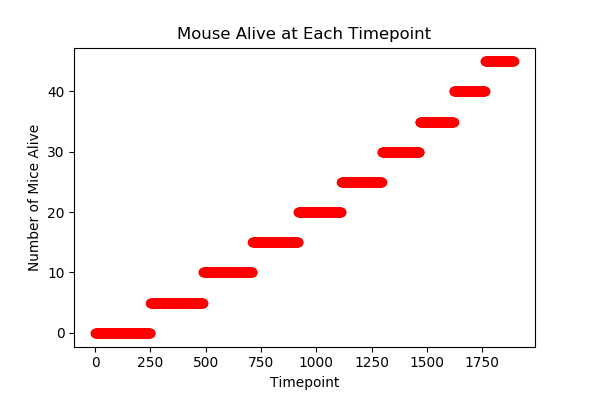

In [52]:
x_axis_s = np.arange(0, len(clinical_data_file_df))

mouse_survival = []

mouse_survival = clinical_data_file_df["Timepoint"]
    
plt.title("Mouse Alive at Each Timepoint")
plt.xlabel("Timepoint")
plt.ylabel("Number of Mice Alive")

plt.scatter(x_axis_s, mouse_survival, marker="o", color="red")
plt.show()

Confirming unique "Mouse ID" for each list.

In [19]:
capomulin_list_df = pd.DataFrame(capomulin_list)
capomulin_list_df
capomulin_list_df.describe()

,Mouse ID,Drug
count,25,25
unique,25,1
top,x401,Capomulin
freq,1,25


In [20]:
infubinol_list_df = pd.DataFrame(infubinol_list)
infubinol_list_df
infubinol_list_df.describe()

,Mouse ID,Drug
count,25,25
unique,25,1
top,z581,Infubinol
freq,1,25


In [21]:
ketapril_list_df = pd.DataFrame(ketapril_list)
ketapril_list_df
ketapril_list_df.describe()

,Mouse ID,Drug
count,25,25
unique,25,1
top,d474,Ketapril
freq,1,25


In [22]:
placebo_list_df = pd.DataFrame(placebo_list)
placebo_list_df
placebo_list_df.describe()

,Mouse ID,Drug
count,25,25
unique,25,1
top,s166,Placebo
freq,1,25


"Placebo" Treatment List

In [23]:
placebo_data_list = []
a = 0
b = 0
x = 0
y = 0
z = 0

for mouse_a in placebo_list_df["Mouse ID"]:
    b = 0
    for mouse_b in clinical_data_file_df["Mouse ID"]:
        
        if mouse_a == mouse_b:
            
            z = clinical_data_file_df.iloc[b]
            print("match for x: " + str(x) + " " + mouse_a + " = " + mouse_b)
            x = x +1
            print(z)
            placebo_data_list.append(z)
            b = b + 1 
        else:
            print ("no match")    
            print("next mouse_b: " + mouse_b + "  " + str(b))
            b = b + 1
    print("next mouse_a: " + str(a))
    a = a + 1
placebo_data_list_df = pd.DataFrame(placebo_data_list)
print("Placebo data clinical data list")
placebo_data_list_df

no match
next mouse_b: b128  0
no match
next mouse_b: f932  1
no match
next mouse_b: g107  2
no match
next mouse_b: a457  3
no match
next mouse_b: c819  4
no match
next mouse_b: h246  5
no match
next mouse_b: p189  6
no match
next mouse_b: n923  7
no match
next mouse_b: q119  8
no match
next mouse_b: f993  9
no match
next mouse_b: z234  10
no match
next mouse_b: b559  11
no match
next mouse_b: y260  12
no match
next mouse_b: x930  13
no match
next mouse_b: o725  14
no match
next mouse_b: z969  15
no match
next mouse_b: v835  16
no match
next mouse_b: r604  17
no match
next mouse_b: n304  18
no match
next mouse_b: l700  19
no match
next mouse_b: x336  20
no match
next mouse_b: l725  21
no match
next mouse_b: m133  22
no match
next mouse_b: v295  23
no match
next mouse_b: a818  24
no match
next mouse_b: y601  25
no match
next mouse_b: t724  26
no match
next mouse_b: k382  27
no match
next mouse_b: w422  28
no match
next mouse_b: c326  29
no match
next mouse_b: c139  30
no match
next mous

no match
next mouse_b: f993  1090
no match
next mouse_b: c458  1091
no match
next mouse_b: u196  1092
no match
next mouse_b: a411  1093
no match
next mouse_b: x930  1094
no match
next mouse_b: u327  1095
no match
next mouse_b: q610  1096
no match
next mouse_b: b559  1097
no match
next mouse_b: j913  1098
no match
next mouse_b: v603  1099
no match
next mouse_b: g497  1100
no match
next mouse_b: z795  1101
no match
next mouse_b: a520  1102
no match
next mouse_b: d474  1103
no match
next mouse_b: d251  1104
no match
next mouse_b: s710  1105
no match
next mouse_b: r604  1106
no match
next mouse_b: x401  1107
no match
next mouse_b: m269  1108
no match
next mouse_b: a963  1109
no match
next mouse_b: p189  1110
no match
next mouse_b: g989  1111
no match
next mouse_b: n304  1112
no match
next mouse_b: u149  1113
no match
next mouse_b: x264  1114
no match
next mouse_b: l725  1115
no match
next mouse_b: i177  1116
no match
next mouse_b: l471  1117
no match
next mouse_b: r944  1118
no match
next 

no match
next mouse_b: c302  1818
no match
next mouse_b: w350  1819
no match
next mouse_b: c402  1820
no match
next mouse_b: v923  1821
no match
next mouse_b: c758  1822
no match
next mouse_b: j984  1823
no match
next mouse_b: a699  1824
match for x: 9 a897 = a897
Mouse ID                a897
Timepoint                 45
Tumor Volume (mm3)    72.256
Metastatic Sites           4
Name: 1825, dtype: object
no match
next mouse_b: t198  1826
no match
next mouse_b: k862  1827
no match
next mouse_b: j989  1828
no match
next mouse_b: b742  1829
no match
next mouse_b: m269  1830
no match
next mouse_b: c264  1831
no match
next mouse_b: g296  1832
no match
next mouse_b: j913  1833
no match
next mouse_b: w575  1834
no match
next mouse_b: k894  1835
no match
next mouse_b: a444  1836
no match
next mouse_b: q633  1837
no match
next mouse_b: w914  1838
no match
next mouse_b: a401  1839
no match
next mouse_b: f545  1840
no match
next mouse_b: x402  1841
no match
next mouse_b: j365  1842
no match
next m

next mouse_b: r850  696
no match
next mouse_b: j235  697
no match
next mouse_b: i901  698
no match
next mouse_b: s152  699
no match
next mouse_b: o926  700
no match
next mouse_b: m331  701
no match
next mouse_b: x401  702
no match
next mouse_b: l215  703
no match
next mouse_b: j246  704
no match
next mouse_b: s508  705
no match
next mouse_b: p981  706
no match
next mouse_b: i334  707
no match
next mouse_b: r157  708
no match
next mouse_b: t198  709
no match
next mouse_b: c766  710
no match
next mouse_b: q597  711
no match
next mouse_b: l661  712
no match
next mouse_b: y769  713
no match
next mouse_b: s185  714
no match
next mouse_b: d251  715
no match
next mouse_b: y865  716
no match
next mouse_b: a685  717
no match
next mouse_b: a262  718
no match
next mouse_b: b128  719
no match
next mouse_b: r811  720
no match
next mouse_b: z581  721
no match
next mouse_b: c819  722
no match
next mouse_b: r850  723
no match
next mouse_b: b559  724
no match
next mouse_b: c264  725
no match
next mouse

no match
next mouse_b: w697  1383
no match
next mouse_b: p981  1384
no match
next mouse_b: c302  1385
no match
next mouse_b: t451  1386
no match
next mouse_b: k483  1387
no match
next mouse_b: q511  1388
no match
next mouse_b: o973  1389
no match
next mouse_b: l897  1390
no match
next mouse_b: j989  1391
no match
next mouse_b: g288  1392
no match
next mouse_b: s337  1393
no match
next mouse_b: a963  1394
no match
next mouse_b: k804  1395
no match
next mouse_b: d474  1396
no match
next mouse_b: a788  1397
no match
next mouse_b: m269  1398
no match
next mouse_b: o926  1399
no match
next mouse_b: b128  1400
no match
next mouse_b: a366  1401
no match
next mouse_b: r701  1402
no match
next mouse_b: m957  1403
no match
next mouse_b: v295  1404
no match
next mouse_b: b759  1405
no match
next mouse_b: n364  1406
no match
next mouse_b: z969  1407
no match
next mouse_b: w151  1408
no match
next mouse_b: l700  1409
no match
next mouse_b: o287  1410
no match
next mouse_b: t724  1411
no match
next 

next mouse_b: l471  176
no match
next mouse_b: y865  177
no match
next mouse_b: y769  178
no match
next mouse_b: l661  179
no match
next mouse_b: j296  180
no match
next mouse_b: u149  181
no match
next mouse_b: u153  182
no match
next mouse_b: w151  183
no match
next mouse_b: h531  184
no match
next mouse_b: a685  185
no match
next mouse_b: o813  186
no match
next mouse_b: m756  187
no match
next mouse_b: n671  188
no match
next mouse_b: s121  189
no match
next mouse_b: v766  190
no match
next mouse_b: w193  191
no match
next mouse_b: e476  192
no match
next mouse_b: w584  193
no match
next mouse_b: b447  194
no match
next mouse_b: k210  195
no match
next mouse_b: a275  196
no match
next mouse_b: x581  197
no match
next mouse_b: n482  198
no match
next mouse_b: t198  199
no match
next mouse_b: l215  200
no match
next mouse_b: s141  201
no match
next mouse_b: o523  202
no match
next mouse_b: i635  203
no match
next mouse_b: w746  204
no match
next mouse_b: r107  205
no match
next mouse

no match
next mouse_b: p310  898
no match
next mouse_b: r107  899
no match
next mouse_b: q633  900
no match
next mouse_b: x930  901
no match
next mouse_b: f234  902
no match
next mouse_b: l700  903
no match
next mouse_b: a444  904
no match
next mouse_b: a366  905
no match
next mouse_b: x822  906
no match
next mouse_b: x613  907
no match
next mouse_b: l471  908
no match
next mouse_b: z969  909
no match
next mouse_b: c458  910
no match
next mouse_b: q610  911
no match
next mouse_b: w697  912
no match
next mouse_b: v923  913
no match
next mouse_b: w575  914
no match
next mouse_b: t198  915
no match
next mouse_b: n304  916
no match
next mouse_b: i901  917
no match
next mouse_b: u364  918
no match
next mouse_b: o926  919
no match
next mouse_b: q132  920
no match
next mouse_b: a577  921
no match
next mouse_b: i386  922
no match
next mouse_b: t198  923
no match
next mouse_b: g558  924
no match
next mouse_b: c766  925
no match
next mouse_b: u946  926
no match
next mouse_b: p310  927
no match
n

next mouse_b: y478  1633
no match
next mouse_b: t718  1634
no match
next mouse_b: c282  1635
no match
next mouse_b: o795  1636
no match
next mouse_b: m546  1637
no match
next mouse_b: z578  1638
no match
next mouse_b: g791  1639
no match
next mouse_b: c758  1640
no match
next mouse_b: d251  1641
no match
next mouse_b: c264  1642
no match
next mouse_b: u196  1643
no match
next mouse_b: c757  1644
no match
next mouse_b: r811  1645
no match
next mouse_b: c766  1646
no match
next mouse_b: e227  1647
no match
next mouse_b: n763  1648
no match
next mouse_b: f545  1649
no match
next mouse_b: r944  1650
no match
next mouse_b: x773  1651
no match
next mouse_b: s185  1652
no match
next mouse_b: a897  1653
no match
next mouse_b: q787  1654
no match
next mouse_b: a444  1655
no match
next mouse_b: m601  1656
no match
next mouse_b: t565  1657
no match
next mouse_b: q597  1658
no match
next mouse_b: j989  1659
no match
next mouse_b: u327  1660
no match
next mouse_b: b879  1661
no match
next mouse_b: 

next mouse_b: k382  407
no match
next mouse_b: k804  408
no match
next mouse_b: r850  409
no match
next mouse_b: g316  410
no match
next mouse_b: v766  411
no match
next mouse_b: g497  412
no match
next mouse_b: a520  413
no match
next mouse_b: x773  414
no match
next mouse_b: m550  415
no match
next mouse_b: t994  416
no match
next mouse_b: n364  417
no match
next mouse_b: l264  418
no match
next mouse_b: e227  419
no match
next mouse_b: c326  420
no match
next mouse_b: r157  421
no match
next mouse_b: c766  422
no match
next mouse_b: v719  423
no match
next mouse_b: w678  424
no match
next mouse_b: c139  425
no match
next mouse_b: m546  426
no match
next mouse_b: v339  427
no match
next mouse_b: s152  428
no match
next mouse_b: m650  429
no match
next mouse_b: c282  430
no match
next mouse_b: v989  431
no match
next mouse_b: r944  432
no match
next mouse_b: r554  433
no match
next mouse_b: c895  434
no match
next mouse_b: v409  435
no match
next mouse_b: u196  436
no match
next mouse

next mouse_b: p136  1158
no match
next mouse_b: c559  1159
no match
next mouse_b: m269  1160
no match
next mouse_b: a788  1161
no match
next mouse_b: x401  1162
no match
next mouse_b: a963  1163
no match
next mouse_b: l897  1164
no match
next mouse_b: s337  1165
no match
next mouse_b: b313  1166
no match
next mouse_b: j989  1167
no match
next mouse_b: q511  1168
no match
next mouse_b: t451  1169
no match
next mouse_b: c302  1170
no match
next mouse_b: o926  1171
no match
next mouse_b: p981  1172
no match
next mouse_b: c264  1173
no match
next mouse_b: d251  1174
no match
next mouse_b: w540  1175
no match
next mouse_b: j365  1176
no match
next mouse_b: j913  1177
no match
next mouse_b: a411  1178
no match
next mouse_b: k894  1179
no match
next mouse_b: g296  1180
no match
next mouse_b: w914  1181
no match
next mouse_b: q610  1182
no match
next mouse_b: w575  1183
no match
next mouse_b: h333  1184
no match
next mouse_b: m601  1185
no match
next mouse_b: q633  1186
no match
next mouse_b: 

next mouse_b: c580  40
no match
next mouse_b: q132  41
no match
next mouse_b: u327  42
no match
next mouse_b: v603  43
no match
next mouse_b: f278  44
no match
next mouse_b: g497  45
no match
next mouse_b: d474  46
no match
next mouse_b: o973  47
no match
next mouse_b: c832  48
no match
next mouse_b: o331  49
no match
next mouse_b: m650  50
no match
next mouse_b: v289  51
no match
next mouse_b: m550  52
no match
next mouse_b: h428  53
no match
next mouse_b: r701  54
no match
next mouse_b: v199  55
no match
next mouse_b: x264  56
no match
next mouse_b: f234  57
no match
next mouse_b: c458  58
no match
next mouse_b: q610  59
no match
next mouse_b: j913  60
no match
next mouse_b: a411  61
no match
next mouse_b: a444  62
no match
next mouse_b: d251  63
no match
next mouse_b: j989  64
no match
next mouse_b: y449  65
no match
next mouse_b: k403  66
no match
next mouse_b: c758  67
no match
next mouse_b: x402  68
no match
next mouse_b: r811  69
no match
next mouse_b: a644  70
no match
next mou

no match
next mouse_b: v295  828
no match
next mouse_b: s187  829
no match
next mouse_b: a401  830
no match
next mouse_b: x581  831
no match
next mouse_b: a492  832
no match
next mouse_b: e291  833
no match
next mouse_b: a275  834
no match
next mouse_b: f129  835
no match
next mouse_b: s565  836
no match
next mouse_b: x402  837
no match
next mouse_b: l725  838
no match
next mouse_b: b742  839
no match
next mouse_b: t724  840
no match
next mouse_b: k210  841
no match
next mouse_b: p136  842
no match
next mouse_b: m269  843
no match
next mouse_b: q511  844
no match
next mouse_b: u946  845
no match
next mouse_b: x401  846
no match
next mouse_b: g558  847
no match
next mouse_b: t451  848
no match
next mouse_b: z795  849
no match
next mouse_b: o562  850
no match
next mouse_b: s337  851
no match
next mouse_b: v991  852
no match
next mouse_b: a788  853
no match
next mouse_b: a963  854
no match
next mouse_b: x264  855
no match
next mouse_b: e584  856
no match
next mouse_b: c927  857
no match
n

no match
next mouse_b: a262  1612
no match
next mouse_b: m957  1613
no match
next mouse_b: b742  1614
no match
next mouse_b: c758  1615
no match
next mouse_b: v923  1616
no match
next mouse_b: w697  1617
no match
next mouse_b: p981  1618
no match
next mouse_b: t198  1619
no match
next mouse_b: g791  1620
no match
next mouse_b: a262  1621
no match
next mouse_b: a644  1622
no match
next mouse_b: i334  1623
no match
next mouse_b: a520  1624
no match
next mouse_b: k894  1625
no match
next mouse_b: e662  1626
no match
next mouse_b: n364  1627
no match
next mouse_b: k403  1628
no match
next mouse_b: b128  1629
no match
next mouse_b: i177  1630
no match
next mouse_b: c302  1631
no match
next mouse_b: s508  1632
no match
next mouse_b: y478  1633
match for x: 38 t718 = t718
Mouse ID                 t718
Timepoint                  40
Tumor Volume (mm3)    61.5304
Metastatic Sites            3
Name: 1634, dtype: object
no match
next mouse_b: c282  1635
no match
next mouse_b: o795  1636
no match
n

next mouse_b: a262  471
no match
next mouse_b: b128  472
no match
next mouse_b: n671  473
no match
next mouse_b: g288  474
no match
next mouse_b: v603  475
no match
next mouse_b: i334  476
no match
next mouse_b: k403  477
no match
next mouse_b: p189  478
no match
next mouse_b: o809  479
no match
next mouse_b: g107  480
no match
next mouse_b: t718  481
no match
next mouse_b: i386  482
no match
next mouse_b: s121  483
no match
next mouse_b: z581  484
no match
next mouse_b: f278  485
no match
next mouse_b: j235  486
no match
next mouse_b: m957  487
no match
next mouse_b: e291  488
no match
next mouse_b: u946  489
no match
next mouse_b: g558  490
no match
next mouse_b: i386  491
no match
next mouse_b: e584  492
no match
next mouse_b: o523  493
no match
next mouse_b: i635  494
no match
next mouse_b: b879  495
no match
next mouse_b: u327  496
no match
next mouse_b: n678  497
no match
next mouse_b: r554  498
no match
next mouse_b: z435  499
no match
next mouse_b: s565  500
no match
next mouse

no match
next mouse_b: o302  1201
no match
next mouse_b: g570  1202
no match
next mouse_b: j755  1203
no match
next mouse_b: e213  1204
no match
next mouse_b: t718  1205
no match
next mouse_b: u364  1206
no match
next mouse_b: g558  1207
no match
next mouse_b: e584  1208
no match
next mouse_b: e291  1209
no match
next mouse_b: a644  1210
no match
next mouse_b: o562  1211
no match
next mouse_b: r811  1212
no match
next mouse_b: r107  1213
no match
next mouse_b: p387  1214
no match
next mouse_b: i635  1215
no match
next mouse_b: w350  1216
no match
next mouse_b: k403  1217
no match
next mouse_b: j984  1218
no match
next mouse_b: p310  1219
no match
next mouse_b: a897  1220
no match
next mouse_b: a699  1221
no match
next mouse_b: w697  1222
no match
next mouse_b: c402  1223
no match
next mouse_b: b742  1224
no match
next mouse_b: k862  1225
no match
next mouse_b: t198  1226
no match
next mouse_b: c758  1227
no match
next mouse_b: c757  1228
no match
next mouse_b: s141  1229
no match
next 

no match
next mouse_b: r921  81
no match
next mouse_b: a492  82
no match
next mouse_b: w540  83
no match
next mouse_b: v764  84
no match
next mouse_b: z795  85
no match
next mouse_b: e291  86
no match
next mouse_b: e584  87
no match
next mouse_b: e213  88
no match
next mouse_b: j755  89
no match
next mouse_b: s565  90
no match
next mouse_b: a366  91
no match
next mouse_b: p387  92
no match
next mouse_b: b879  93
no match
next mouse_b: i901  94
no match
next mouse_b: k862  95
no match
next mouse_b: g867  96
no match
next mouse_b: s619  97
no match
next mouse_b: w697  98
no match
next mouse_b: j984  99
no match
next mouse_b: c402  100
no match
next mouse_b: h333  101
no match
next mouse_b: k510  102
no match
next mouse_b: p981  103
no match
next mouse_b: t451  104
no match
next mouse_b: a963  105
no match
next mouse_b: m269  106
no match
next mouse_b: g989  107
no match
next mouse_b: z314  108
no match
next mouse_b: o848  109
no match
next mouse_b: v719  110
no match
next mouse_b: q597  

next mouse_b: a262  688
no match
next mouse_b: w350  689
no match
next mouse_b: n364  690
no match
next mouse_b: z578  691
no match
next mouse_b: w697  692
no match
next mouse_b: p310  693
no match
next mouse_b: k603  694
no match
next mouse_b: k510  695
no match
next mouse_b: r850  696
no match
next mouse_b: j235  697
no match
next mouse_b: i901  698
no match
next mouse_b: s152  699
no match
next mouse_b: o926  700
no match
next mouse_b: m331  701
no match
next mouse_b: x401  702
no match
next mouse_b: l215  703
no match
next mouse_b: j246  704
no match
next mouse_b: s508  705
no match
next mouse_b: p981  706
no match
next mouse_b: i334  707
no match
next mouse_b: r157  708
no match
next mouse_b: t198  709
no match
next mouse_b: c766  710
no match
next mouse_b: q597  711
no match
next mouse_b: l661  712
no match
next mouse_b: y769  713
no match
next mouse_b: s185  714
no match
next mouse_b: d251  715
no match
next mouse_b: y865  716
no match
next mouse_b: a685  717
no match
next mouse

no match
next mouse_b: s185  1479
no match
next mouse_b: s337  1480
no match
next mouse_b: o973  1481
no match
next mouse_b: d474  1482
no match
next mouse_b: h246  1483
no match
next mouse_b: j989  1484
no match
next mouse_b: k804  1485
no match
next mouse_b: e227  1486
no match
next mouse_b: w151  1487
no match
next mouse_b: q511  1488
no match
next mouse_b: l700  1489
no match
next mouse_b: t451  1490
no match
next mouse_b: e662  1491
no match
next mouse_b: z581  1492
no match
next mouse_b: c264  1493
no match
next mouse_b: w914  1494
no match
next mouse_b: l661  1495
no match
next mouse_b: v603  1496
no match
next mouse_b: j246  1497
no match
next mouse_b: q610  1498
no match
next mouse_b: l509  1499
no match
next mouse_b: m546  1500
no match
next mouse_b: w575  1501
no match
next mouse_b: i386  1502
no match
next mouse_b: y865  1503
no match
next mouse_b: n364  1504
no match
next mouse_b: i738  1505
no match
next mouse_b: k894  1506
no match
next mouse_b: c282  1507
no match
next 

next mouse_b: l215  386
no match
next mouse_b: y793  387
no match
next mouse_b: n763  388
no match
next mouse_b: a203  389
no match
next mouse_b: w584  390
no match
next mouse_b: y163  391
no match
next mouse_b: o973  392
no match
next mouse_b: o795  393
no match
next mouse_b: w422  394
no match
next mouse_b: e662  395
no match
next mouse_b: g791  396
no match
next mouse_b: c580  397
no match
next mouse_b: e476  398
no match
next mouse_b: k483  399
no match
next mouse_b: y478  400
no match
next mouse_b: i669  401
no match
next mouse_b: d474  402
no match
next mouse_b: w193  403
no match
next mouse_b: q582  404
match for x: 59 s166 = s166
Mouse ID                 s166
Timepoint                   5
Tumor Volume (mm3)    47.1868
Metastatic Sites            0
Name: 405, dtype: object
no match
next mouse_b: o331  406
no match
next mouse_b: k382  407
no match
next mouse_b: k804  408
no match
next mouse_b: r850  409
no match
next mouse_b: g316  410
no match
next mouse_b: v766  411
no match
ne

no match
next mouse_b: m601  1089
no match
next mouse_b: f993  1090
no match
next mouse_b: c458  1091
no match
next mouse_b: u196  1092
no match
next mouse_b: a411  1093
no match
next mouse_b: x930  1094
no match
next mouse_b: u327  1095
no match
next mouse_b: q610  1096
no match
next mouse_b: b559  1097
no match
next mouse_b: j913  1098
no match
next mouse_b: v603  1099
no match
next mouse_b: g497  1100
no match
next mouse_b: z795  1101
no match
next mouse_b: a520  1102
no match
next mouse_b: d474  1103
no match
next mouse_b: d251  1104
no match
next mouse_b: s710  1105
no match
next mouse_b: r604  1106
no match
next mouse_b: x401  1107
no match
next mouse_b: m269  1108
no match
next mouse_b: a963  1109
no match
next mouse_b: p189  1110
no match
next mouse_b: g989  1111
no match
next mouse_b: n304  1112
no match
next mouse_b: u149  1113
no match
next mouse_b: x264  1114
no match
next mouse_b: l725  1115
no match
next mouse_b: i177  1116
no match
next mouse_b: l471  1117
no match
next 

next mouse_b: z969  15
no match
next mouse_b: v835  16
no match
next mouse_b: r604  17
no match
next mouse_b: n304  18
no match
next mouse_b: l700  19
no match
next mouse_b: x336  20
no match
next mouse_b: l725  21
no match
next mouse_b: m133  22
no match
next mouse_b: v295  23
no match
next mouse_b: a818  24
no match
next mouse_b: y601  25
no match
next mouse_b: t724  26
no match
next mouse_b: k382  27
no match
next mouse_b: w422  28
no match
next mouse_b: c326  29
no match
next mouse_b: c139  30
no match
next mouse_b: v339  31
no match
next mouse_b: a577  32
no match
next mouse_b: y163  33
no match
next mouse_b: k483  34
no match
next mouse_b: k804  35
no match
next mouse_b: o809  36
no match
next mouse_b: z581  37
no match
next mouse_b: a251  38
no match
next mouse_b: i386  39
no match
next mouse_b: c580  40
no match
next mouse_b: q132  41
no match
next mouse_b: u327  42
no match
next mouse_b: v603  43
no match
next mouse_b: f278  44
no match
next mouse_b: g497  45
no match
next mou

next mouse_b: i669  799
no match
next mouse_b: i177  800
no match
next mouse_b: r157  801
no match
next mouse_b: k382  802
no match
next mouse_b: k483  803
match for x: 64 q582 = q582
Mouse ID                 q582
Timepoint                  15
Tumor Volume (mm3)    48.3226
Metastatic Sites            2
Name: 804, dtype: object
no match
next mouse_b: e476  805
no match
next mouse_b: g791  806
no match
next mouse_b: g316  807
no match
next mouse_b: r554  808
no match
next mouse_b: o973  809
no match
next mouse_b: e662  810
no match
next mouse_b: w193  811
no match
next mouse_b: s141  812
no match
next mouse_b: n967  813
no match
next mouse_b: p438  814
no match
next mouse_b: g989  815
no match
next mouse_b: b487  816
no match
next mouse_b: g570  817
no match
next mouse_b: j119  818
no match
next mouse_b: j755  819
no match
next mouse_b: v764  820
no match
next mouse_b: a818  821
no match
next mouse_b: o287  822
no match
next mouse_b: w540  823
no match
next mouse_b: w350  824
no match
ne

next mouse_b: a275  1665
no match
next mouse_b: s710  1666
no match
next mouse_b: s565  1667
no match
next mouse_b: p387  1668
no match
next mouse_b: l471  1669
no match
next mouse_b: i635  1670
no match
next mouse_b: e476  1671
no match
next mouse_b: k382  1672
no match
next mouse_b: j119  1673
no match
next mouse_b: i901  1674
no match
next mouse_b: a203  1675
no match
next mouse_b: b742  1676
no match
next mouse_b: w422  1677
no match
next mouse_b: k862  1678
no match
next mouse_b: t198  1679
no match
next mouse_b: k210  1680
no match
next mouse_b: a699  1681
no match
next mouse_b: f345  1682
no match
next mouse_b: v923  1683
no match
next mouse_b: m550  1684
no match
next mouse_b: l661  1685
no match
next mouse_b: o287  1686
no match
next mouse_b: v295  1687
no match
next mouse_b: e213  1688
no match
next mouse_b: w151  1689
no match
next mouse_b: p189  1690
no match
next mouse_b: t724  1691
no match
next mouse_b: q483  1692
no match
next mouse_b: r701  1693
no match
next mouse_b: 

no match
next mouse_b: x773  608
no match
next mouse_b: a401  609
no match
next mouse_b: i177  610
no match
next mouse_b: s166  611
no match
next mouse_b: q582  612
no match
next mouse_b: w540  613
no match
next mouse_b: j365  614
no match
next mouse_b: v764  615
no match
next mouse_b: g791  616
match for x: 71 y478 = y478
Mouse ID                 y478
Timepoint                  10
Tumor Volume (mm3)    52.2889
Metastatic Sites            1
Name: 617, dtype: object
no match
next mouse_b: l897  618
no match
next mouse_b: o795  619
no match
next mouse_b: g989  620
no match
next mouse_b: p136  621
no match
next mouse_b: t451  622
no match
next mouse_b: c282  623
no match
next mouse_b: s337  624
no match
next mouse_b: m546  625
no match
next mouse_b: v989  626
no match
next mouse_b: a788  627
no match
next mouse_b: a644  628
no match
next mouse_b: v409  629
no match
next mouse_b: r944  630
no match
next mouse_b: a963  631
no match
next mouse_b: t994  632
no match
next mouse_b: c559  633
no

no match
next mouse_b: j246  1354
no match
next mouse_b: w575  1355
no match
next mouse_b: w914  1356
no match
next mouse_b: q610  1357
no match
next mouse_b: i386  1358
no match
next mouse_b: m601  1359
no match
next mouse_b: k894  1360
no match
next mouse_b: u327  1361
no match
next mouse_b: g296  1362
no match
next mouse_b: j913  1363
no match
next mouse_b: q132  1364
no match
next mouse_b: i334  1365
no match
next mouse_b: x401  1366
no match
next mouse_b: o809  1367
no match
next mouse_b: c559  1368
no match
next mouse_b: o331  1369
no match
next mouse_b: a897  1370
no match
next mouse_b: a577  1371
no match
next mouse_b: j984  1372
no match
next mouse_b: q597  1373
no match
next mouse_b: k403  1374
no match
next mouse_b: w350  1375
no match
next mouse_b: c832  1376
no match
next mouse_b: s185  1377
no match
next mouse_b: w584  1378
no match
next mouse_b: y163  1379
no match
next mouse_b: g989  1380
no match
next mouse_b: h333  1381
no match
next mouse_b: a262  1382
no match
next 

next mouse_b: x111  209
no match
next mouse_b: z435  210
no match
next mouse_b: n678  211
no match
next mouse_b: g558  212
no match
next mouse_b: u946  213
no match
next mouse_b: o562  214
no match
next mouse_b: v991  215
no match
next mouse_b: c927  216
no match
next mouse_b: x226  217
no match
next mouse_b: p438  218
no match
next mouse_b: b487  219
no match
next mouse_b: o287  220
no match
next mouse_b: q483  221
no match
next mouse_b: t573  222
no match
next mouse_b: f345  223
no match
next mouse_b: i334  224
no match
next mouse_b: l264  225
no match
next mouse_b: j246  226
no match
next mouse_b: r554  227
no match
next mouse_b: s185  228
no match
next mouse_b: b742  229
no match
next mouse_b: x401  230
no match
next mouse_b: l509  231
no match
next mouse_b: s710  232
no match
next mouse_b: r157  233
no match
next mouse_b: u364  234
no match
next mouse_b: j119  235
no match
next mouse_b: v923  236
no match
next mouse_b: w914  237
no match
next mouse_b: i738  238
no match
next mouse

no match
next mouse_b: q483  825
no match
next mouse_b: j365  826
no match
next mouse_b: j984  827
no match
next mouse_b: v295  828
no match
next mouse_b: s187  829
no match
next mouse_b: a401  830
no match
next mouse_b: x581  831
no match
next mouse_b: a492  832
no match
next mouse_b: e291  833
no match
next mouse_b: a275  834
no match
next mouse_b: f129  835
no match
next mouse_b: s565  836
no match
next mouse_b: x402  837
no match
next mouse_b: l725  838
no match
next mouse_b: b742  839
no match
next mouse_b: t724  840
no match
next mouse_b: k210  841
no match
next mouse_b: p136  842
no match
next mouse_b: m269  843
no match
next mouse_b: q511  844
no match
next mouse_b: u946  845
no match
next mouse_b: x401  846
no match
next mouse_b: g558  847
no match
next mouse_b: t451  848
no match
next mouse_b: z795  849
no match
next mouse_b: o562  850
no match
next mouse_b: s337  851
no match
next mouse_b: v991  852
no match
next mouse_b: a788  853
no match
next mouse_b: a963  854
no match
n

no match
next mouse_b: z795  1572
no match
next mouse_b: i557  1573
no match
next mouse_b: p438  1574
no match
next mouse_b: w167  1575
no match
next mouse_b: i177  1576
no match
next mouse_b: a203  1577
no match
next mouse_b: a644  1578
no match
next mouse_b: c927  1579
no match
next mouse_b: j755  1580
no match
next mouse_b: y260  1581
no match
next mouse_b: w422  1582
no match
next mouse_b: x264  1583
no match
next mouse_b: g570  1584
no match
next mouse_b: e213  1585
no match
next mouse_b: q483  1586
no match
next mouse_b: c757  1587
no match
next mouse_b: a411  1588
no match
next mouse_b: o562  1589
no match
next mouse_b: a685  1590
no match
next mouse_b: a897  1591
no match
next mouse_b: g989  1592
no match
next mouse_b: o331  1593
no match
next mouse_b: q597  1594
no match
next mouse_b: j984  1595
no match
next mouse_b: v295  1596
no match
next mouse_b: q582  1597
no match
next mouse_b: k862  1598
no match
next mouse_b: j119  1599
no match
next mouse_b: k210  1600
no match
next 

no match
next mouse_b: y449  290
no match
next mouse_b: l661  291
no match
next mouse_b: c302  292
no match
next mouse_b: c264  293
no match
next mouse_b: l471  294
no match
next mouse_b: x930  295
no match
next mouse_b: k754  296
no match
next mouse_b: f436  297
no match
next mouse_b: v295  298
no match
next mouse_b: j913  299
no match
next mouse_b: s710  300
no match
next mouse_b: z969  301
no match
next mouse_b: k894  302
no match
next mouse_b: l490  303
no match
next mouse_b: b759  304
no match
next mouse_b: a411  305
no match
next mouse_b: f545  306
no match
next mouse_b: o725  307
no match
next mouse_b: y601  308
no match
next mouse_b: w914  309
no match
next mouse_b: n967  310
no match
next mouse_b: l733  311
no match
next mouse_b: m601  312
no match
next mouse_b: b487  313
no match
next mouse_b: o287  314
no match
next mouse_b: p310  315
no match
next mouse_b: r107  316
no match
next mouse_b: s565  317
no match
next mouse_b: w350  318
no match
next mouse_b: s187  319
no match
n

next mouse_b: f234  1088
no match
next mouse_b: m601  1089
no match
next mouse_b: f993  1090
no match
next mouse_b: c458  1091
no match
next mouse_b: u196  1092
no match
next mouse_b: a411  1093
no match
next mouse_b: x930  1094
no match
next mouse_b: u327  1095
no match
next mouse_b: q610  1096
no match
next mouse_b: b559  1097
no match
next mouse_b: j913  1098
no match
next mouse_b: v603  1099
no match
next mouse_b: g497  1100
no match
next mouse_b: z795  1101
no match
next mouse_b: a520  1102
no match
next mouse_b: d474  1103
no match
next mouse_b: d251  1104
no match
next mouse_b: s710  1105
no match
next mouse_b: r604  1106
no match
next mouse_b: x401  1107
no match
next mouse_b: m269  1108
no match
next mouse_b: a963  1109
no match
next mouse_b: p189  1110
no match
next mouse_b: g989  1111
no match
next mouse_b: n304  1112
no match
next mouse_b: u149  1113
no match
next mouse_b: x264  1114
no match
next mouse_b: l725  1115
no match
next mouse_b: i177  1116
no match
next mouse_b: 

next mouse_b: z969  15
no match
next mouse_b: v835  16
no match
next mouse_b: r604  17
no match
next mouse_b: n304  18
no match
next mouse_b: l700  19
no match
next mouse_b: x336  20
no match
next mouse_b: l725  21
no match
next mouse_b: m133  22
no match
next mouse_b: v295  23
no match
next mouse_b: a818  24
no match
next mouse_b: y601  25
no match
next mouse_b: t724  26
no match
next mouse_b: k382  27
no match
next mouse_b: w422  28
no match
next mouse_b: c326  29
no match
next mouse_b: c139  30
no match
next mouse_b: v339  31
no match
next mouse_b: a577  32
no match
next mouse_b: y163  33
no match
next mouse_b: k483  34
no match
next mouse_b: k804  35
no match
next mouse_b: o809  36
no match
next mouse_b: z581  37
no match
next mouse_b: a251  38
no match
next mouse_b: i386  39
no match
next mouse_b: c580  40
no match
next mouse_b: q132  41
no match
next mouse_b: u327  42
no match
next mouse_b: v603  43
no match
next mouse_b: f278  44
no match
next mouse_b: g497  45
no match
next mou

no match
next mouse_b: c757  655
no match
next mouse_b: g296  656
no match
next mouse_b: r921  657
no match
next mouse_b: q633  658
no match
next mouse_b: t565  659
no match
next mouse_b: r811  660
no match
next mouse_b: f234  661
no match
next mouse_b: x613  662
no match
next mouse_b: x402  663
no match
next mouse_b: o302  664
no match
next mouse_b: w575  665
no match
next mouse_b: c458  666
no match
next mouse_b: i477  667
no match
next mouse_b: c758  668
no match
next mouse_b: d164  669
no match
next mouse_b: q610  670
no match
next mouse_b: s185  671
no match
next mouse_b: q511  672
no match
next mouse_b: c264  673
no match
next mouse_b: k862  674
no match
next mouse_b: n763  675
no match
next mouse_b: h333  676
no match
next mouse_b: c402  677
no match
next mouse_b: q787  678
no match
next mouse_b: b128  679
no match
next mouse_b: g867  680
no match
next mouse_b: g989  681
no match
next mouse_b: b742  682
no match
next mouse_b: e662  683
no match
next mouse_b: i669  684
no match
n

next mouse_b: v603  1353
no match
next mouse_b: j246  1354
no match
next mouse_b: w575  1355
no match
next mouse_b: w914  1356
no match
next mouse_b: q610  1357
no match
next mouse_b: i386  1358
no match
next mouse_b: m601  1359
no match
next mouse_b: k894  1360
no match
next mouse_b: u327  1361
no match
next mouse_b: g296  1362
no match
next mouse_b: j913  1363
no match
next mouse_b: q132  1364
no match
next mouse_b: i334  1365
no match
next mouse_b: x401  1366
no match
next mouse_b: o809  1367
no match
next mouse_b: c559  1368
no match
next mouse_b: o331  1369
no match
next mouse_b: a897  1370
no match
next mouse_b: a577  1371
no match
next mouse_b: j984  1372
no match
next mouse_b: q597  1373
no match
next mouse_b: k403  1374
no match
next mouse_b: w350  1375
no match
next mouse_b: c832  1376
no match
next mouse_b: s185  1377
no match
next mouse_b: w584  1378
no match
next mouse_b: y163  1379
no match
next mouse_b: g989  1380
no match
next mouse_b: h333  1381
no match
next mouse_b: 

next mouse_b: c282  151
no match
next mouse_b: v989  152
no match
next mouse_b: w140  153
match for x: 95 v409 = v409
Mouse ID              v409
Timepoint                0
Tumor Volume (mm3)      45
Metastatic Sites         0
Name: 154, dtype: object
no match
next mouse_b: l872  155
no match
next mouse_b: o795  156
no match
next mouse_b: y478  157
no match
next mouse_b: q582  158
no match
next mouse_b: s166  159
no match
next mouse_b: x773  160
no match
next mouse_b: w167  161
no match
next mouse_b: t718  162
no match
next mouse_b: o302  163
no match
next mouse_b: i477  164
no match
next mouse_b: c757  165
no match
next mouse_b: t994  166
no match
next mouse_b: p310  167
no match
next mouse_b: a699  168
no match
next mouse_b: k603  169
no match
next mouse_b: x822  170
no match
next mouse_b: l558  171
no match
next mouse_b: l733  172
no match
next mouse_b: f436  173
no match
next mouse_b: l490  174
no match
next mouse_b: b759  175
no match
next mouse_b: l471  176
no match
next mouse_b: 

next mouse_b: k754  889
no match
next mouse_b: j913  890
no match
next mouse_b: v835  891
no match
next mouse_b: l490  892
no match
next mouse_b: k894  893
no match
next mouse_b: l733  894
no match
next mouse_b: f966  895
no match
next mouse_b: f545  896
no match
next mouse_b: o725  897
no match
next mouse_b: p310  898
no match
next mouse_b: r107  899
no match
next mouse_b: q633  900
no match
next mouse_b: x930  901
no match
next mouse_b: f234  902
no match
next mouse_b: l700  903
no match
next mouse_b: a444  904
no match
next mouse_b: a366  905
no match
next mouse_b: x822  906
no match
next mouse_b: x613  907
no match
next mouse_b: l471  908
no match
next mouse_b: z969  909
no match
next mouse_b: c458  910
no match
next mouse_b: q610  911
no match
next mouse_b: w697  912
no match
next mouse_b: v923  913
no match
next mouse_b: w575  914
no match
next mouse_b: t198  915
no match
next mouse_b: n304  916
no match
next mouse_b: i901  917
no match
next mouse_b: u364  918
no match
next mouse

next mouse_b: z969  1730
no match
next mouse_b: a251  1731
no match
next mouse_b: w914  1732
no match
next mouse_b: w575  1733
no match
next mouse_b: r554  1734
no match
next mouse_b: i386  1735
no match
next mouse_b: j913  1736
no match
next mouse_b: g296  1737
no match
next mouse_b: i738  1738
no match
next mouse_b: c832  1739
no match
next mouse_b: c559  1740
no match
next mouse_b: x401  1741
no match
next mouse_b: n304  1742
no match
next mouse_b: w350  1743
no match
next mouse_b: m650  1744
no match
next mouse_b: c402  1745
no match
next mouse_b: b559  1746
no match
next mouse_b: o926  1747
no match
next mouse_b: c139  1748
no match
next mouse_b: l897  1749
no match
next mouse_b: x822  1750
no match
next mouse_b: l700  1751
no match
next mouse_b: t451  1752
no match
next mouse_b: y163  1753
no match
next mouse_b: q511  1754
no match
next mouse_b: l733  1755
no match
next mouse_b: m269  1756
no match
next mouse_b: y769  1757
no match
next mouse_b: g288  1758
no match
next mouse_b: 

no match
next mouse_b: a963  631
no match
next mouse_b: t994  632
no match
next mouse_b: c559  633
no match
next mouse_b: a520  634
no match
next mouse_b: a444  635
no match
next mouse_b: u196  636
no match
next mouse_b: e227  637
no match
next mouse_b: f129  638
no match
next mouse_b: t718  639
no match
next mouse_b: n967  640
no match
next mouse_b: d251  641
no match
next mouse_b: b313  642
no match
next mouse_b: f545  643
no match
next mouse_b: a411  644
no match
next mouse_b: w914  645
no match
next mouse_b: c302  646
no match
next mouse_b: j989  647
no match
next mouse_b: k894  648
no match
next mouse_b: y449  649
no match
next mouse_b: w150  650
no match
next mouse_b: j913  651
no match
next mouse_b: a897  652
no match
next mouse_b: k754  653
no match
next mouse_b: k403  654
no match
next mouse_b: c757  655
no match
next mouse_b: g296  656
no match
next mouse_b: r921  657
no match
next mouse_b: q633  658
no match
next mouse_b: t565  659
no match
next mouse_b: r811  660
no match
n

next mouse_b: o795  1431
no match
next mouse_b: r604  1432
no match
next mouse_b: x581  1433
no match
next mouse_b: c819  1434
no match
next mouse_b: l490  1435
no match
next mouse_b: a818  1436
no match
next mouse_b: c766  1437
no match
next mouse_b: l725  1438
no match
next mouse_b: q483  1439
no match
next mouse_b: t565  1440
no match
next mouse_b: j119  1441
no match
next mouse_b: l661  1442
no match
next mouse_b: m546  1443
no match
next mouse_b: x822  1444
no match
next mouse_b: k210  1445
no match
next mouse_b: w167  1446
no match
next mouse_b: h246  1447
no match
next mouse_b: s710  1448
no match
next mouse_b: v991  1449
no match
next mouse_b: b559  1450
no match
next mouse_b: i738  1451
no match
next mouse_b: z795  1452
no match
next mouse_b: c282  1453
no match
next mouse_b: e476  1454
no match
next mouse_b: k382  1455
no match
next mouse_b: y769  1456
no match
next mouse_b: o562  1457
no match
next mouse_b: i177  1458
no match
next mouse_b: y478  1459
no match
next mouse_b: 

next mouse_b: h246  454
no match
next mouse_b: q597  455
no match
next mouse_b: a251  456
no match
next mouse_b: q787  457
no match
next mouse_b: c758  458
no match
next mouse_b: u327  459
no match
next mouse_b: t565  460
no match
next mouse_b: c819  461
no match
next mouse_b: o302  462
no match
next mouse_b: h531  463
no match
next mouse_b: i477  464
no match
next mouse_b: w151  465
no match
next mouse_b: y260  466
no match
next mouse_b: r921  467
no match
next mouse_b: a457  468
no match
next mouse_b: j296  469
no match
next mouse_b: w167  470
no match
next mouse_b: a262  471
no match
next mouse_b: b128  472
no match
next mouse_b: n671  473
no match
next mouse_b: g288  474
no match
next mouse_b: v603  475
no match
next mouse_b: i334  476
no match
next mouse_b: k403  477
no match
next mouse_b: p189  478
no match
next mouse_b: o809  479
no match
next mouse_b: g107  480
no match
next mouse_b: t718  481
no match
next mouse_b: i386  482
no match
next mouse_b: s121  483
no match
next mouse

no match
next mouse_b: c559  1159
no match
next mouse_b: m269  1160
no match
next mouse_b: a788  1161
no match
next mouse_b: x401  1162
no match
next mouse_b: a963  1163
no match
next mouse_b: l897  1164
no match
next mouse_b: s337  1165
no match
next mouse_b: b313  1166
no match
next mouse_b: j989  1167
no match
next mouse_b: q511  1168
no match
next mouse_b: t451  1169
no match
next mouse_b: c302  1170
no match
next mouse_b: o926  1171
no match
next mouse_b: p981  1172
no match
next mouse_b: c264  1173
no match
next mouse_b: d251  1174
no match
next mouse_b: w540  1175
no match
next mouse_b: j365  1176
no match
next mouse_b: j913  1177
no match
next mouse_b: a411  1178
no match
next mouse_b: k894  1179
no match
next mouse_b: g296  1180
no match
next mouse_b: w914  1181
no match
next mouse_b: q610  1182
no match
next mouse_b: w575  1183
no match
next mouse_b: h333  1184
no match
next mouse_b: m601  1185
no match
next mouse_b: q633  1186
no match
next mouse_b: f234  1187
no match
next 

next mouse_b: m546  75
no match
next mouse_b: w678  76
no match
next mouse_b: n364  77
no match
next mouse_b: s508  78
no match
next mouse_b: e662  79
no match
next mouse_b: z578  80
no match
next mouse_b: r921  81
no match
next mouse_b: a492  82
no match
next mouse_b: w540  83
no match
next mouse_b: v764  84
no match
next mouse_b: z795  85
no match
next mouse_b: e291  86
no match
next mouse_b: e584  87
no match
next mouse_b: e213  88
no match
next mouse_b: j755  89
no match
next mouse_b: s565  90
no match
next mouse_b: a366  91
no match
next mouse_b: p387  92
no match
next mouse_b: b879  93
no match
next mouse_b: i901  94
no match
next mouse_b: k862  95
no match
next mouse_b: g867  96
no match
next mouse_b: s619  97
no match
next mouse_b: w697  98
no match
next mouse_b: j984  99
no match
next mouse_b: c402  100
no match
next mouse_b: h333  101
no match
next mouse_b: k510  102
no match
next mouse_b: p981  103
no match
next mouse_b: t451  104
no match
next mouse_b: a963  105
no match
ne

no match
next mouse_b: g558  924
no match
next mouse_b: c766  925
no match
next mouse_b: u946  926
no match
next mouse_b: p310  927
no match
next mouse_b: s152  928
no match
next mouse_b: z581  929
no match
next mouse_b: f966  930
no match
next mouse_b: o809  931
no match
next mouse_b: s187  932
no match
next mouse_b: b128  933
no match
next mouse_b: i669  934
no match
next mouse_b: b742  935
no match
next mouse_b: k804  936
no match
next mouse_b: a699  937
no match
next mouse_b: i635  938
no match
next mouse_b: r107  939
no match
next mouse_b: r554  940
no match
next mouse_b: w350  941
no match
next mouse_b: k603  942
no match
next mouse_b: a251  943
no match
next mouse_b: k483  944
no match
next mouse_b: a262  945
no match
next mouse_b: n763  946
no match
next mouse_b: q787  947
no match
next mouse_b: y163  948
no match
next mouse_b: g570  949
no match
next mouse_b: g989  950
no match
next mouse_b: s141  951
no match
next mouse_b: q511  952
no match
next mouse_b: s121  953
no match
n

next mouse_b: s565  1667
no match
next mouse_b: p387  1668
no match
next mouse_b: l471  1669
no match
next mouse_b: i635  1670
no match
next mouse_b: e476  1671
no match
next mouse_b: k382  1672
no match
next mouse_b: j119  1673
no match
next mouse_b: i901  1674
no match
next mouse_b: a203  1675
no match
next mouse_b: b742  1676
no match
next mouse_b: w422  1677
no match
next mouse_b: k862  1678
no match
next mouse_b: t198  1679
no match
next mouse_b: k210  1680
no match
next mouse_b: a699  1681
no match
next mouse_b: f345  1682
no match
next mouse_b: v923  1683
no match
next mouse_b: m550  1684
no match
next mouse_b: l661  1685
no match
next mouse_b: o287  1686
no match
next mouse_b: v295  1687
no match
next mouse_b: e213  1688
no match
next mouse_b: w151  1689
no match
next mouse_b: p189  1690
no match
next mouse_b: t724  1691
no match
next mouse_b: q483  1692
no match
next mouse_b: r701  1693
no match
next mouse_b: p438  1694
no match
next mouse_b: a818  1695
no match
next mouse_b: 

next mouse_b: p189  549
no match
next mouse_b: q119  550
no match
next mouse_b: l661  551
no match
next mouse_b: f993  552
no match
next mouse_b: m957  553
no match
next mouse_b: h246  554
no match
next mouse_b: w151  555
no match
next mouse_b: y769  556
no match
next mouse_b: y865  557
no match
next mouse_b: b559  558
no match
next mouse_b: s141  559
no match
next mouse_b: l471  560
no match
next mouse_b: x930  561
no match
next mouse_b: a685  562
no match
next mouse_b: w193  563
no match
next mouse_b: x822  564
no match
next mouse_b: k382  565
no match
next mouse_b: v289  566
no match
next mouse_b: b487  567
no match
next mouse_b: c895  568
no match
next mouse_b: t724  569
no match
next mouse_b: j119  570
no match
next mouse_b: p438  571
no match
next mouse_b: r701  572
no match
next mouse_b: m650  573
no match
next mouse_b: i557  574
no match
next mouse_b: v719  575
no match
next mouse_b: c927  576
no match
next mouse_b: x264  577
no match
next mouse_b: v991  578
no match
next mouse

next mouse_b: k382  1286
no match
next mouse_b: i738  1287
no match
next mouse_b: n923  1288
no match
next mouse_b: e662  1289
no match
next mouse_b: n364  1290
no match
next mouse_b: q787  1291
no match
next mouse_b: y793  1292
no match
next mouse_b: z581  1293
no match
next mouse_b: s508  1294
no match
next mouse_b: a203  1295
no match
next mouse_b: m650  1296
no match
next mouse_b: n763  1297
no match
next mouse_b: z578  1298
no match
next mouse_b: c758  1299
no match
next mouse_b: v923  1300
no match
next mouse_b: k862  1301
no match
next mouse_b: g570  1302
no match
next mouse_b: e584  1303
no match
next mouse_b: t198  1304
no match
next mouse_b: s141  1305
no match
next mouse_b: c139  1306
no match
next mouse_b: w422  1307
no match
next mouse_b: b742  1308
no match
next mouse_b: i557  1309
no match
next mouse_b: u364  1310
no match
next mouse_b: g316  1311
no match
next mouse_b: r921  1312
no match
next mouse_b: m550  1313
no match
next mouse_b: e213  1314
no match
next mouse_b: 

no match
next mouse_b: p981  103
no match
next mouse_b: t451  104
no match
next mouse_b: a963  105
no match
next mouse_b: m269  106
no match
next mouse_b: g989  107
no match
next mouse_b: z314  108
no match
next mouse_b: o848  109
no match
next mouse_b: v719  110
no match
next mouse_b: q597  111
no match
next mouse_b: c895  112
no match
next mouse_b: a203  113
no match
next mouse_b: f394  114
no match
next mouse_b: c264  115
no match
next mouse_b: n967  116
no match
next mouse_b: f545  117
no match
next mouse_b: k894  118
no match
next mouse_b: k754  119
no match
next mouse_b: g296  120
no match
next mouse_b: d164  121
no match
next mouse_b: w575  122
no match
next mouse_b: x613  123
no match
next mouse_b: q633  124
no match
next mouse_b: b313  125
no match
next mouse_b: f129  126
no match
next mouse_b: j365  127
no match
next mouse_b: p136  128
no match
next mouse_b: c559  129
no match
next mouse_b: a788  130
no match
next mouse_b: s337  131
no match
next mouse_b: q511  132
no match
n

no match
next mouse_b: s121  789
no match
next mouse_b: z578  790
no match
next mouse_b: j246  791
no match
next mouse_b: k804  792
no match
next mouse_b: w167  793
no match
next mouse_b: d474  794
no match
next mouse_b: y260  795
no match
next mouse_b: v766  796
no match
next mouse_b: w584  797
no match
next mouse_b: x773  798
no match
next mouse_b: i669  799
no match
next mouse_b: i177  800
no match
next mouse_b: r157  801
no match
next mouse_b: k382  802
no match
next mouse_b: k483  803
no match
next mouse_b: q582  804
no match
next mouse_b: e476  805
no match
next mouse_b: g791  806
no match
next mouse_b: g316  807
no match
next mouse_b: r554  808
no match
next mouse_b: o973  809
no match
next mouse_b: e662  810
no match
next mouse_b: w193  811
no match
next mouse_b: s141  812
no match
next mouse_b: n967  813
no match
next mouse_b: p438  814
no match
next mouse_b: g989  815
no match
next mouse_b: b487  816
no match
next mouse_b: g570  817
no match
next mouse_b: j119  818
no match
n

next mouse_b: k210  1600
no match
next mouse_b: y163  1601
no match
next mouse_b: a275  1602
no match
next mouse_b: w350  1603
no match
next mouse_b: s508  1604
no match
next mouse_b: k403  1605
no match
next mouse_b: a699  1606
no match
next mouse_b: s710  1607
no match
next mouse_b: c402  1608
no match
next mouse_b: c819  1609
no match
next mouse_b: x581  1610
no match
next mouse_b: c139  1611
no match
next mouse_b: a262  1612
no match
next mouse_b: m957  1613
no match
next mouse_b: b742  1614
no match
next mouse_b: c758  1615
no match
next mouse_b: v923  1616
no match
next mouse_b: w697  1617
no match
next mouse_b: p981  1618
no match
next mouse_b: t198  1619
no match
next mouse_b: g791  1620
no match
next mouse_b: a262  1621
no match
next mouse_b: a644  1622
no match
next mouse_b: i334  1623
no match
next mouse_b: a520  1624
no match
next mouse_b: k894  1625
no match
next mouse_b: e662  1626
no match
next mouse_b: n364  1627
no match
next mouse_b: k403  1628
no match
next mouse_b: 

next mouse_b: v289  438
no match
next mouse_b: a897  439
no match
next mouse_b: f345  440
no match
next mouse_b: s508  441
no match
next mouse_b: a577  442
no match
next mouse_b: z578  443
no match
next mouse_b: i177  444
no match
next mouse_b: a644  445
no match
next mouse_b: c757  446
no match
next mouse_b: s185  447
no match
next mouse_b: i738  448
no match
next mouse_b: m756  449
no match
next mouse_b: o813  450
no match
next mouse_b: j246  451
no match
next mouse_b: a685  452
no match
next mouse_b: r811  453
no match
next mouse_b: h246  454
no match
next mouse_b: q597  455
no match
next mouse_b: a251  456
no match
next mouse_b: q787  457
no match
next mouse_b: c758  458
no match
next mouse_b: u327  459
no match
next mouse_b: t565  460
no match
next mouse_b: c819  461
no match
next mouse_b: o302  462
no match
next mouse_b: h531  463
no match
next mouse_b: i477  464
no match
next mouse_b: w151  465
no match
next mouse_b: y260  466
no match
next mouse_b: r921  467
no match
next mouse

no match
next mouse_b: w697  1222
no match
next mouse_b: c402  1223
no match
next mouse_b: b742  1224
no match
next mouse_b: k862  1225
no match
next mouse_b: t198  1226
no match
next mouse_b: c758  1227
no match
next mouse_b: c757  1228
no match
next mouse_b: s141  1229
no match
next mouse_b: i901  1230
no match
next mouse_b: b879  1231
no match
next mouse_b: v923  1232
no match
next mouse_b: y769  1233
no match
next mouse_b: g791  1234
no match
next mouse_b: c282  1235
no match
next mouse_b: s121  1236
no match
next mouse_b: g107  1237
no match
next mouse_b: k804  1238
no match
next mouse_b: w151  1239
no match
next mouse_b: d474  1240
no match
next mouse_b: e227  1241
no match
next mouse_b: m550  1242
no match
next mouse_b: r554  1243
no match
next mouse_b: f345  1244
no match
next mouse_b: c139  1245
no match
next mouse_b: g288  1246
no match
next mouse_b: p189  1247
no match
next mouse_b: g497  1248
no match
next mouse_b: g316  1249
no match
next mouse_b: y260  1250
no match
next 

no match
next mouse_b: v991  1886
no match
next mouse_b: z795  1887
no match
next mouse_b: r944  1888
no match
next mouse_b: u364  1889
no match
next mouse_b: p438  1890
no match
next mouse_b: x773  1891
no match
next mouse_b: b879  1892
next mouse_a: 19
no match
next mouse_b: b128  0
no match
next mouse_b: f932  1
no match
next mouse_b: g107  2
no match
next mouse_b: a457  3
no match
next mouse_b: c819  4
no match
next mouse_b: h246  5
no match
next mouse_b: p189  6
no match
next mouse_b: n923  7
no match
next mouse_b: q119  8
no match
next mouse_b: f993  9
no match
next mouse_b: z234  10
no match
next mouse_b: b559  11
no match
next mouse_b: y260  12
no match
next mouse_b: x930  13
no match
next mouse_b: o725  14
no match
next mouse_b: z969  15
no match
next mouse_b: v835  16
no match
next mouse_b: r604  17
no match
next mouse_b: n304  18
no match
next mouse_b: l700  19
no match
next mouse_b: x336  20
no match
next mouse_b: l725  21
no match
next mouse_b: m133  22
no match
next mouse

next mouse_b: z581  721
no match
next mouse_b: c819  722
no match
next mouse_b: r850  723
no match
next mouse_b: b559  724
no match
next mouse_b: c264  725
no match
next mouse_b: o302  726
no match
next mouse_b: g288  727
no match
next mouse_b: h246  728
no match
next mouse_b: a251  729
no match
next mouse_b: c757  730
no match
next mouse_b: j989  731
no match
next mouse_b: i334  732
no match
next mouse_b: f993  733
no match
next mouse_b: y449  734
no match
next mouse_b: i738  735
no match
next mouse_b: i386  736
no match
next mouse_b: u327  737
no match
next mouse_b: q787  738
no match
next mouse_b: n923  739
no match
next mouse_b: c758  740
no match
next mouse_b: c302  741
no match
next mouse_b: q132  742
no match
next mouse_b: n671  743
no match
next mouse_b: a897  744
no match
next mouse_b: k403  745
no match
next mouse_b: b313  746
no match
next mouse_b: p189  747
no match
next mouse_b: m957  748
no match
next mouse_b: w151  749
no match
next mouse_b: v603  750
no match
next mouse

no match
next mouse_b: o809  1469
no match
next mouse_b: a520  1470
no match
next mouse_b: p189  1471
no match
next mouse_b: k483  1472
no match
next mouse_b: x822  1473
no match
next mouse_b: a963  1474
no match
next mouse_b: l725  1475
no match
next mouse_b: l733  1476
no match
next mouse_b: m269  1477
no match
next mouse_b: y478  1478
no match
next mouse_b: s185  1479
no match
next mouse_b: s337  1480
no match
next mouse_b: o973  1481
no match
next mouse_b: d474  1482
no match
next mouse_b: h246  1483
no match
next mouse_b: j989  1484
no match
next mouse_b: k804  1485
no match
next mouse_b: e227  1486
no match
next mouse_b: w151  1487
no match
next mouse_b: q511  1488
no match
next mouse_b: l700  1489
no match
next mouse_b: t451  1490
no match
next mouse_b: e662  1491
no match
next mouse_b: z581  1492
no match
next mouse_b: c264  1493
no match
next mouse_b: w914  1494
no match
next mouse_b: l661  1495
no match
next mouse_b: v603  1496
no match
next mouse_b: j246  1497
no match
next 

no match
next mouse_b: y865  279
no match
next mouse_b: d251  280
no match
next mouse_b: b313  281
no match
next mouse_b: y769  282
no match
next mouse_b: z234  283
no match
next mouse_b: b559  284
no match
next mouse_b: f993  285
no match
next mouse_b: q119  286
no match
next mouse_b: j989  287
no match
next mouse_b: w150  288
no match
next mouse_b: n923  289
no match
next mouse_b: y449  290
no match
next mouse_b: l661  291
no match
next mouse_b: c302  292
no match
next mouse_b: c264  293
no match
next mouse_b: l471  294
no match
next mouse_b: x930  295
no match
next mouse_b: k754  296
no match
next mouse_b: f436  297
no match
next mouse_b: v295  298
no match
next mouse_b: j913  299
no match
next mouse_b: s710  300
no match
next mouse_b: z969  301
no match
next mouse_b: k894  302
no match
next mouse_b: l490  303
no match
next mouse_b: b759  304
no match
next mouse_b: a411  305
no match
next mouse_b: f545  306
no match
next mouse_b: o725  307
no match
next mouse_b: y601  308
no match
n

no match
next mouse_b: j119  1009
no match
next mouse_b: e476  1010
no match
next mouse_b: w167  1011
no match
next mouse_b: q582  1012
no match
next mouse_b: p136  1013
no match
next mouse_b: w584  1014
no match
next mouse_b: b487  1015
no match
next mouse_b: y478  1016
no match
next mouse_b: g316  1017
no match
next mouse_b: a203  1018
no match
next mouse_b: o287  1019
no match
next mouse_b: j246  1020
no match
next mouse_b: j235  1021
no match
next mouse_b: m550  1022
no match
next mouse_b: a818  1023
no match
next mouse_b: i901  1024
no match
next mouse_b: v923  1025
no match
next mouse_b: c758  1026
no match
next mouse_b: v295  1027
no match
next mouse_b: k862  1028
no match
next mouse_b: z578  1029
no match
next mouse_b: o331  1030
no match
next mouse_b: g791  1031
no match
next mouse_b: w697  1032
no match
next mouse_b: c819  1033
no match
next mouse_b: k403  1034
no match
next mouse_b: m133  1035
no match
next mouse_b: j984  1036
no match
next mouse_b: c832  1037
no match
next 

next mouse_b: y163  1779
no match
next mouse_b: i334  1780
no match
next mouse_b: c139  1781
no match
next mouse_b: c832  1782
no match
next mouse_b: a262  1783
no match
next mouse_b: z581  1784
no match
next mouse_b: g497  1785
no match
next mouse_b: a251  1786
no match
next mouse_b: q787  1787
no match
next mouse_b: r554  1788
no match
next mouse_b: k483  1789
no match
next mouse_b: w151  1790
no match
next mouse_b: g316  1791
no match
next mouse_b: m550  1792
no match
next mouse_b: e227  1793
no match
next mouse_b: a685  1794
no match
next mouse_b: s508  1795
no match
next mouse_b: h246  1796
no match
next mouse_b: y793  1797
no match
next mouse_b: c766  1798
no match
next mouse_b: z578  1799
no match
next mouse_b: m957  1800
no match
next mouse_b: e662  1801
no match
next mouse_b: e476  1802
no match
next mouse_b: k382  1803
no match
next mouse_b: a203  1804
no match
next mouse_b: w422  1805
no match
next mouse_b: f345  1806
no match
next mouse_b: y260  1807
no match
next mouse_b: 

next mouse_b: q787  678
no match
next mouse_b: b128  679
no match
next mouse_b: g867  680
no match
next mouse_b: g989  681
no match
next mouse_b: b742  682
no match
next mouse_b: e662  683
no match
next mouse_b: i669  684
no match
next mouse_b: a699  685
no match
next mouse_b: q597  686
no match
next mouse_b: j984  687
match for x: 158 a262 = a262
Mouse ID                 a262
Timepoint                  10
Tumor Volume (mm3)    49.5952
Metastatic Sites            1
Name: 688, dtype: object
no match
next mouse_b: w350  689
no match
next mouse_b: n364  690
no match
next mouse_b: z578  691
no match
next mouse_b: w697  692
no match
next mouse_b: p310  693
no match
next mouse_b: k603  694
no match
next mouse_b: k510  695
no match
next mouse_b: r850  696
no match
next mouse_b: j235  697
no match
next mouse_b: i901  698
no match
next mouse_b: s152  699
no match
next mouse_b: o926  700
no match
next mouse_b: m331  701
no match
next mouse_b: x401  702
no match
next mouse_b: l215  703
no match
n

next mouse_b: i177  1458
no match
next mouse_b: y478  1459
no match
next mouse_b: y865  1460
no match
next mouse_b: a520  1461
no match
next mouse_b: x264  1462
no match
next mouse_b: a685  1463
no match
next mouse_b: y793  1464
no match
next mouse_b: y260  1465
no match
next mouse_b: c927  1466
no match
next mouse_b: i334  1467
no match
next mouse_b: l897  1468
no match
next mouse_b: o809  1469
no match
next mouse_b: a520  1470
no match
next mouse_b: p189  1471
no match
next mouse_b: k483  1472
no match
next mouse_b: x822  1473
no match
next mouse_b: a963  1474
no match
next mouse_b: l725  1475
no match
next mouse_b: l733  1476
no match
next mouse_b: m269  1477
no match
next mouse_b: y478  1478
no match
next mouse_b: s185  1479
no match
next mouse_b: s337  1480
no match
next mouse_b: o973  1481
no match
next mouse_b: d474  1482
no match
next mouse_b: h246  1483
no match
next mouse_b: j989  1484
no match
next mouse_b: k804  1485
no match
next mouse_b: e227  1486
no match
next mouse_b: 

no match
next mouse_b: s619  344
no match
next mouse_b: a699  345
no match
next mouse_b: q132  346
no match
next mouse_b: k862  347
no match
next mouse_b: h333  348
no match
next mouse_b: x401  349
no match
next mouse_b: o926  350
no match
next mouse_b: c927  351
no match
next mouse_b: c559  352
no match
next mouse_b: r701  353
no match
next mouse_b: j119  354
no match
next mouse_b: p438  355
no match
next mouse_b: m269  356
no match
next mouse_b: a963  357
no match
next mouse_b: p136  358
no match
next mouse_b: t724  359
no match
next mouse_b: g989  360
no match
next mouse_b: z314  361
no match
next mouse_b: a818  362
no match
next mouse_b: v764  363
no match
next mouse_b: j365  364
no match
next mouse_b: i557  365
no match
next mouse_b: x264  366
no match
next mouse_b: v991  367
no match
next mouse_b: a788  368
no match
next mouse_b: x111  369
no match
next mouse_b: k510  370
no match
next mouse_b: z435  371
no match
next mouse_b: e584  372
no match
next mouse_b: m331  373
no match
n

next mouse_b: k862  1028
no match
next mouse_b: z578  1029
no match
next mouse_b: o331  1030
no match
next mouse_b: g791  1031
no match
next mouse_b: w697  1032
no match
next mouse_b: c819  1033
no match
next mouse_b: k403  1034
no match
next mouse_b: m133  1035
no match
next mouse_b: j984  1036
no match
next mouse_b: c832  1037
no match
next mouse_b: q597  1038
no match
next mouse_b: t565  1039
no match
next mouse_b: c402  1040
no match
next mouse_b: h333  1041
no match
next mouse_b: k510  1042
no match
next mouse_b: o973  1043
no match
next mouse_b: l700  1044
no match
next mouse_b: p981  1045
no match
next mouse_b: m650  1046
no match
next mouse_b: j989  1047
no match
next mouse_b: b879  1048
no match
next mouse_b: g107  1049
no match
next mouse_b: a644  1050
no match
next mouse_b: y793  1051
no match
next mouse_b: i557  1052
no match
next mouse_b: e291  1053
no match
next mouse_b: c580  1054
no match
next mouse_b: k382  1055
no match
next mouse_b: w422  1056
no match
next mouse_b: 

no match
next mouse_b: k483  1789
no match
next mouse_b: w151  1790
no match
next mouse_b: g316  1791
no match
next mouse_b: m550  1792
no match
next mouse_b: e227  1793
no match
next mouse_b: a685  1794
no match
next mouse_b: s508  1795
no match
next mouse_b: h246  1796
no match
next mouse_b: y793  1797
no match
next mouse_b: c766  1798
no match
next mouse_b: z578  1799
no match
next mouse_b: m957  1800
no match
next mouse_b: e662  1801
no match
next mouse_b: e476  1802
no match
next mouse_b: k382  1803
no match
next mouse_b: a203  1804
no match
next mouse_b: w422  1805
no match
next mouse_b: f345  1806
no match
next mouse_b: y260  1807
no match
next mouse_b: m546  1808
no match
next mouse_b: a818  1809
no match
next mouse_b: l471  1810
no match
next mouse_b: s337  1811
no match
next mouse_b: a963  1812
no match
next mouse_b: q511  1813
no match
next mouse_b: k403  1814
no match
next mouse_b: t451  1815
no match
next mouse_b: o926  1816
no match
next mouse_b: l897  1817
no match
next 

next mouse_b: r157  708
no match
next mouse_b: t198  709
no match
next mouse_b: c766  710
no match
next mouse_b: q597  711
no match
next mouse_b: l661  712
no match
next mouse_b: y769  713
no match
next mouse_b: s185  714
no match
next mouse_b: d251  715
no match
next mouse_b: y865  716
no match
next mouse_b: a685  717
no match
next mouse_b: a262  718
no match
next mouse_b: b128  719
no match
next mouse_b: r811  720
no match
next mouse_b: z581  721
no match
next mouse_b: c819  722
no match
next mouse_b: r850  723
no match
next mouse_b: b559  724
no match
next mouse_b: c264  725
no match
next mouse_b: o302  726
no match
next mouse_b: g288  727
no match
next mouse_b: h246  728
no match
next mouse_b: a251  729
no match
next mouse_b: c757  730
no match
next mouse_b: j989  731
no match
next mouse_b: i334  732
no match
next mouse_b: f993  733
no match
next mouse_b: y449  734
no match
next mouse_b: i738  735
no match
next mouse_b: i386  736
no match
next mouse_b: u327  737
no match
next mouse

no match
next mouse_b: a444  1513
no match
next mouse_b: q633  1514
no match
next mouse_b: l471  1515
no match
next mouse_b: a251  1516
no match
next mouse_b: x401  1517
no match
next mouse_b: n304  1518
no match
next mouse_b: o795  1519
no match
next mouse_b: p136  1520
no match
next mouse_b: n923  1521
no match
next mouse_b: r604  1522
no match
next mouse_b: t565  1523
no match
next mouse_b: d251  1524
no match
next mouse_b: j365  1525
no match
next mouse_b: c559  1526
no match
next mouse_b: a492  1527
no match
next mouse_b: g497  1528
no match
next mouse_b: z969  1529
no match
next mouse_b: a401  1530
no match
next mouse_b: f545  1531
no match
next mouse_b: u196  1532
no match
next mouse_b: x402  1533
no match
next mouse_b: r554  1534
no match
next mouse_b: q787  1535
no match
next mouse_b: f234  1536
no match
next mouse_b: j296  1537
no match
next mouse_b: c302  1538
no match
next mouse_b: c832  1539
no match
next mouse_b: g288  1540
no match
next mouse_b: f345  1541
no match
next 

,Mouse ID,Timepoint,Tumor Volume (mm3),Metastatic Sites
141,a897,0,45.000000,0
439,a897,5,45.691124,1
652,a897,10,47.972927,1
744,a897,15,52.343085,2
969,a897,20,54.595705,3
...,...,...,...,...
142,j235,0,45.000000,0
486,j235,5,46.588820,0
697,j235,10,48.018788,1
777,j235,15,51.161138,1


In [24]:
placebo_data_list_df["Tumor Volume (mm3)"]

141     45.000000
439     45.691124
652     47.972927
744     52.343085
969     54.595705
          ...    
142     45.000000
486     46.588820
697     48.018788
777     51.161138
1021    52.942902
Name: Tumor Volume (mm3), Length: 181, dtype: float64

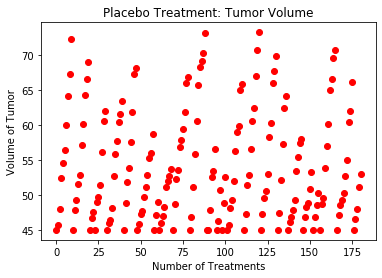

In [25]:
x_axis_p = np.arange(0, len(placebo_data_list_df))

tumor_p_data = []

tumor_p_data = placebo_data_list_df["Tumor Volume (mm3)"]
    
plt.title("Placebo Treatment: Tumor Volume")
plt.xlabel("Number of Treatments")
plt.ylabel("Volume of Tumor")

plt.scatter(x_axis_p, tumor_p_data, marker="o", color="red")
plt.show()

Survival Rate: Placebo

"Capomulin" Treatment List

In [26]:
capomulin_data_list = []
a = 0
b = 0
x = 0
y = 0
z = 0

for mouse_a in capomulin_list_df["Mouse ID"]:
    b = 0
    for mouse_b in clinical_data_file_df["Mouse ID"]:
        
        if mouse_a == mouse_b:
            
            z = clinical_data_file_df.iloc[b]
            print("match for x: " + str(x) + " " + mouse_a + " = " + mouse_b)
            x = x +1
            print(z)
            capomulin_data_list.append(z)
            b = b + 1 
        else:
            print ("no match")    
            print("next mouse_b: " + mouse_b + "  " + str(b))
            b = b + 1
    print("next mouse_a: " + str(a))
    a = a + 1
capomulin_data_list_df = pd.DataFrame(capomulin_data_list)
print("Capomulin data clinical data list")
capomulin_data_list_df

match for x: 0 b128 = b128
Mouse ID              b128
Timepoint                0
Tumor Volume (mm3)      45
Metastatic Sites         0
Name: 0, dtype: object
no match
next mouse_b: f932  1
no match
next mouse_b: g107  2
no match
next mouse_b: a457  3
no match
next mouse_b: c819  4
no match
next mouse_b: h246  5
no match
next mouse_b: p189  6
no match
next mouse_b: n923  7
no match
next mouse_b: q119  8
no match
next mouse_b: f993  9
no match
next mouse_b: z234  10
no match
next mouse_b: b559  11
no match
next mouse_b: y260  12
no match
next mouse_b: x930  13
no match
next mouse_b: o725  14
no match
next mouse_b: z969  15
no match
next mouse_b: v835  16
no match
next mouse_b: r604  17
no match
next mouse_b: n304  18
no match
next mouse_b: l700  19
no match
next mouse_b: x336  20
no match
next mouse_b: l725  21
no match
next mouse_b: m133  22
no match
next mouse_b: v295  23
no match
next mouse_b: a818  24
no match
next mouse_b: y601  25
no match
next mouse_b: t724  26
no match
next mouse

no match
next mouse_b: a366  1070
no match
next mouse_b: t724  1071
no match
next mouse_b: p387  1072
no match
next mouse_b: v289  1073
no match
next mouse_b: h246  1074
no match
next mouse_b: l725  1075
no match
next mouse_b: z969  1076
no match
next mouse_b: w540  1077
no match
next mouse_b: i334  1078
no match
next mouse_b: v835  1079
no match
next mouse_b: a444  1080
no match
next mouse_b: t451  1081
no match
next mouse_b: a492  1082
no match
next mouse_b: g288  1083
no match
next mouse_b: x402  1084
no match
next mouse_b: n923  1085
no match
next mouse_b: i738  1086
no match
next mouse_b: n364  1087
no match
next mouse_b: f234  1088
no match
next mouse_b: m601  1089
no match
next mouse_b: f993  1090
no match
next mouse_b: c458  1091
no match
next mouse_b: u196  1092
no match
next mouse_b: a411  1093
no match
next mouse_b: x930  1094
no match
next mouse_b: u327  1095
no match
next mouse_b: q610  1096
no match
next mouse_b: b559  1097
no match
next mouse_b: j913  1098
no match
next 

no match
next mouse_b: c402  1745
no match
next mouse_b: b559  1746
no match
next mouse_b: o926  1747
no match
next mouse_b: c139  1748
no match
next mouse_b: l897  1749
no match
next mouse_b: x822  1750
no match
next mouse_b: l700  1751
no match
next mouse_b: t451  1752
no match
next mouse_b: y163  1753
no match
next mouse_b: q511  1754
no match
next mouse_b: l733  1755
no match
next mouse_b: m269  1756
no match
next mouse_b: y769  1757
no match
next mouse_b: g288  1758
no match
next mouse_b: n923  1759
no match
next mouse_b: a963  1760
no match
next mouse_b: o331  1761
no match
next mouse_b: s337  1762
no match
next mouse_b: n364  1763
match for x: 9 b128 = b128
Mouse ID                 b128
Timepoint                  45
Tumor Volume (mm3)    38.9829
Metastatic Sites            2
Name: 1764, dtype: object
no match
next mouse_b: l661  1765
no match
next mouse_b: y865  1766
no match
next mouse_b: y769  1767
no match
next mouse_b: b559  1768
no match
next mouse_b: t565  1769
no match
ne

no match
next mouse_b: n671  473
no match
next mouse_b: g288  474
no match
next mouse_b: v603  475
no match
next mouse_b: i334  476
no match
next mouse_b: k403  477
no match
next mouse_b: p189  478
no match
next mouse_b: o809  479
no match
next mouse_b: g107  480
no match
next mouse_b: t718  481
no match
next mouse_b: i386  482
no match
next mouse_b: s121  483
no match
next mouse_b: z581  484
no match
next mouse_b: f278  485
no match
next mouse_b: j235  486
no match
next mouse_b: m957  487
no match
next mouse_b: e291  488
no match
next mouse_b: u946  489
no match
next mouse_b: g558  490
no match
next mouse_b: i386  491
no match
next mouse_b: e584  492
no match
next mouse_b: o523  493
no match
next mouse_b: i635  494
no match
next mouse_b: b879  495
no match
next mouse_b: u327  496
no match
next mouse_b: n678  497
no match
next mouse_b: r554  498
no match
next mouse_b: z435  499
no match
next mouse_b: s565  500
no match
next mouse_b: g497  501
no match
next mouse_b: s187  502
no match
n

no match
next mouse_b: h246  1253
no match
next mouse_b: k483  1254
no match
next mouse_b: z578  1255
no match
next mouse_b: c766  1256
no match
next mouse_b: a577  1257
no match
next mouse_b: c819  1258
no match
next mouse_b: q597  1259
no match
next mouse_b: c832  1260
no match
next mouse_b: i669  1261
no match
next mouse_b: a685  1262
no match
next mouse_b: a262  1263
no match
next mouse_b: m650  1264
no match
next mouse_b: y163  1265
no match
next mouse_b: n671  1266
no match
next mouse_b: v289  1267
no match
next mouse_b: b128  1268
no match
next mouse_b: m957  1269
no match
next mouse_b: o973  1270
no match
next mouse_b: n763  1271
no match
next mouse_b: o331  1272
no match
next mouse_b: j296  1273
no match
next mouse_b: q132  1274
no match
next mouse_b: w584  1275
no match
next mouse_b: j246  1276
no match
next mouse_b: e476  1277
no match
next mouse_b: c580  1278
no match
next mouse_b: u327  1279
no match
next mouse_b: i386  1280
no match
next mouse_b: s152  1281
no match
next 

next mouse_b: e662  79
no match
next mouse_b: z578  80
no match
next mouse_b: r921  81
no match
next mouse_b: a492  82
no match
next mouse_b: w540  83
no match
next mouse_b: v764  84
no match
next mouse_b: z795  85
no match
next mouse_b: e291  86
no match
next mouse_b: e584  87
no match
next mouse_b: e213  88
no match
next mouse_b: j755  89
no match
next mouse_b: s565  90
no match
next mouse_b: a366  91
no match
next mouse_b: p387  92
no match
next mouse_b: b879  93
no match
next mouse_b: i901  94
no match
next mouse_b: k862  95
no match
next mouse_b: g867  96
no match
next mouse_b: s619  97
no match
next mouse_b: w697  98
no match
next mouse_b: j984  99
no match
next mouse_b: c402  100
no match
next mouse_b: h333  101
no match
next mouse_b: k510  102
no match
next mouse_b: p981  103
no match
next mouse_b: t451  104
no match
next mouse_b: a963  105
no match
next mouse_b: m269  106
no match
next mouse_b: g989  107
no match
next mouse_b: z314  108
no match
next mouse_b: o848  109
no matc

next mouse_b: l509  982
no match
next mouse_b: w914  983
no match
next mouse_b: k894  984
no match
next mouse_b: e227  985
no match
next mouse_b: a275  986
no match
next mouse_b: x581  987
no match
next mouse_b: o562  988
no match
next mouse_b: c139  989
no match
next mouse_b: c282  990
no match
next mouse_b: v719  991
no match
next mouse_b: v991  992
no match
next mouse_b: s337  993
no match
next mouse_b: c927  994
no match
next mouse_b: t994  995
no match
next mouse_b: a788  996
no match
next mouse_b: c895  997
no match
next mouse_b: l897  998
no match
next mouse_b: f345  999
no match
next mouse_b: c559  1000
no match
next mouse_b: r944  1001
no match
next mouse_b: p438  1002
no match
next mouse_b: o795  1003
no match
next mouse_b: y865  1004
no match
next mouse_b: x773  1005
no match
next mouse_b: w193  1006
no match
next mouse_b: j365  1007
no match
next mouse_b: q483  1008
no match
next mouse_b: j119  1009
no match
next mouse_b: e476  1010
no match
next mouse_b: w167  1011
no matc

next mouse_b: i738  1738
no match
next mouse_b: c832  1739
no match
next mouse_b: c559  1740
no match
next mouse_b: x401  1741
no match
next mouse_b: n304  1742
no match
next mouse_b: w350  1743
no match
next mouse_b: m650  1744
no match
next mouse_b: c402  1745
no match
next mouse_b: b559  1746
no match
next mouse_b: o926  1747
no match
next mouse_b: c139  1748
no match
next mouse_b: l897  1749
no match
next mouse_b: x822  1750
no match
next mouse_b: l700  1751
no match
next mouse_b: t451  1752
no match
next mouse_b: y163  1753
no match
next mouse_b: q511  1754
no match
next mouse_b: l733  1755
no match
next mouse_b: m269  1756
no match
next mouse_b: y769  1757
no match
next mouse_b: g288  1758
no match
next mouse_b: n923  1759
no match
next mouse_b: a963  1760
no match
next mouse_b: o331  1761
no match
next mouse_b: s337  1762
no match
next mouse_b: n364  1763
no match
next mouse_b: b128  1764
no match
next mouse_b: l661  1765
no match
next mouse_b: y865  1766
no match
next mouse_b: 

next mouse_b: d251  641
no match
next mouse_b: b313  642
no match
next mouse_b: f545  643
no match
next mouse_b: a411  644
match for x: 32 w914 = w914
Mouse ID                w914
Timepoint                 10
Tumor Volume (mm3)    43.232
Metastatic Sites           0
Name: 645, dtype: object
no match
next mouse_b: c302  646
no match
next mouse_b: j989  647
no match
next mouse_b: k894  648
no match
next mouse_b: y449  649
no match
next mouse_b: w150  650
no match
next mouse_b: j913  651
no match
next mouse_b: a897  652
no match
next mouse_b: k754  653
no match
next mouse_b: k403  654
no match
next mouse_b: c757  655
no match
next mouse_b: g296  656
no match
next mouse_b: r921  657
no match
next mouse_b: q633  658
no match
next mouse_b: t565  659
no match
next mouse_b: r811  660
no match
next mouse_b: f234  661
no match
next mouse_b: x613  662
no match
next mouse_b: x402  663
no match
next mouse_b: o302  664
no match
next mouse_b: w575  665
no match
next mouse_b: c458  666
no match
next m

no match
next mouse_b: j984  1372
no match
next mouse_b: q597  1373
no match
next mouse_b: k403  1374
no match
next mouse_b: w350  1375
no match
next mouse_b: c832  1376
no match
next mouse_b: s185  1377
no match
next mouse_b: w584  1378
no match
next mouse_b: y163  1379
no match
next mouse_b: g989  1380
no match
next mouse_b: h333  1381
no match
next mouse_b: a262  1382
no match
next mouse_b: w697  1383
no match
next mouse_b: p981  1384
no match
next mouse_b: c302  1385
no match
next mouse_b: t451  1386
no match
next mouse_b: k483  1387
no match
next mouse_b: q511  1388
no match
next mouse_b: o973  1389
no match
next mouse_b: l897  1390
no match
next mouse_b: j989  1391
no match
next mouse_b: g288  1392
no match
next mouse_b: s337  1393
no match
next mouse_b: a963  1394
no match
next mouse_b: k804  1395
no match
next mouse_b: d474  1396
no match
next mouse_b: a788  1397
no match
next mouse_b: m269  1398
no match
next mouse_b: o926  1399
no match
next mouse_b: b128  1400
no match
next 

no match
next mouse_b: o523  202
no match
next mouse_b: i635  203
no match
next mouse_b: w746  204
no match
next mouse_b: r107  205
no match
next mouse_b: s187  206
no match
next mouse_b: g570  207
no match
next mouse_b: x209  208
no match
next mouse_b: x111  209
no match
next mouse_b: z435  210
no match
next mouse_b: n678  211
no match
next mouse_b: g558  212
no match
next mouse_b: u946  213
no match
next mouse_b: o562  214
no match
next mouse_b: v991  215
no match
next mouse_b: c927  216
no match
next mouse_b: x226  217
no match
next mouse_b: p438  218
no match
next mouse_b: b487  219
no match
next mouse_b: o287  220
no match
next mouse_b: q483  221
no match
next mouse_b: t573  222
no match
next mouse_b: f345  223
no match
next mouse_b: i334  224
no match
next mouse_b: l264  225
no match
next mouse_b: j246  226
no match
next mouse_b: r554  227
no match
next mouse_b: s185  228
no match
next mouse_b: b742  229
no match
next mouse_b: x401  230
no match
next mouse_b: l509  231
no match
n

no match
next mouse_b: g989  950
no match
next mouse_b: s141  951
no match
next mouse_b: q511  952
no match
next mouse_b: s121  953
no match
next mouse_b: t718  954
no match
next mouse_b: k210  955
no match
next mouse_b: u149  956
no match
next mouse_b: n671  957
no match
next mouse_b: o302  958
no match
next mouse_b: q633  959
no match
next mouse_b: x822  960
no match
next mouse_b: a685  961
no match
next mouse_b: m957  962
no match
next mouse_b: w575  963
no match
next mouse_b: l733  964
no match
next mouse_b: c757  965
no match
next mouse_b: w151  966
no match
next mouse_b: g296  967
no match
next mouse_b: s185  968
no match
next mouse_b: a897  969
no match
next mouse_b: c264  970
no match
next mouse_b: f545  971
no match
next mouse_b: y769  972
no match
next mouse_b: l471  973
no match
next mouse_b: l661  974
no match
next mouse_b: b313  975
no match
next mouse_b: a401  976
no match
next mouse_b: b759  977
no match
next mouse_b: k754  978
no match
next mouse_b: c302  979
no match
n

no match
next mouse_b: c139  1611
no match
next mouse_b: a262  1612
no match
next mouse_b: m957  1613
no match
next mouse_b: b742  1614
no match
next mouse_b: c758  1615
no match
next mouse_b: v923  1616
no match
next mouse_b: w697  1617
no match
next mouse_b: p981  1618
no match
next mouse_b: t198  1619
no match
next mouse_b: g791  1620
no match
next mouse_b: a262  1621
no match
next mouse_b: a644  1622
no match
next mouse_b: i334  1623
no match
next mouse_b: a520  1624
no match
next mouse_b: k894  1625
no match
next mouse_b: e662  1626
no match
next mouse_b: n364  1627
no match
next mouse_b: k403  1628
no match
next mouse_b: b128  1629
no match
next mouse_b: i177  1630
no match
next mouse_b: c302  1631
no match
next mouse_b: s508  1632
no match
next mouse_b: y478  1633
no match
next mouse_b: t718  1634
no match
next mouse_b: c282  1635
no match
next mouse_b: o795  1636
no match
next mouse_b: m546  1637
no match
next mouse_b: z578  1638
no match
next mouse_b: g791  1639
no match
next 

next mouse_b: k403  477
no match
next mouse_b: p189  478
no match
next mouse_b: o809  479
no match
next mouse_b: g107  480
no match
next mouse_b: t718  481
no match
next mouse_b: i386  482
no match
next mouse_b: s121  483
no match
next mouse_b: z581  484
no match
next mouse_b: f278  485
no match
next mouse_b: j235  486
no match
next mouse_b: m957  487
no match
next mouse_b: e291  488
no match
next mouse_b: u946  489
no match
next mouse_b: g558  490
no match
next mouse_b: i386  491
no match
next mouse_b: e584  492
no match
next mouse_b: o523  493
no match
next mouse_b: i635  494
no match
next mouse_b: b879  495
no match
next mouse_b: u327  496
no match
next mouse_b: n678  497
no match
next mouse_b: r554  498
no match
next mouse_b: z435  499
no match
next mouse_b: s565  500
no match
next mouse_b: g497  501
no match
next mouse_b: s187  502
no match
next mouse_b: o809  503
no match
next mouse_b: z581  504
no match
next mouse_b: r107  505
no match
next mouse_b: k804  506
no match
next mouse

next mouse_b: g791  1234
no match
next mouse_b: c282  1235
no match
next mouse_b: s121  1236
no match
next mouse_b: g107  1237
no match
next mouse_b: k804  1238
no match
next mouse_b: w151  1239
no match
next mouse_b: d474  1240
no match
next mouse_b: e227  1241
no match
next mouse_b: m550  1242
no match
next mouse_b: r554  1243
no match
next mouse_b: f345  1244
no match
next mouse_b: c139  1245
no match
next mouse_b: g288  1246
no match
next mouse_b: p189  1247
no match
next mouse_b: g497  1248
no match
next mouse_b: g316  1249
no match
next mouse_b: y260  1250
no match
next mouse_b: c895  1251
no match
next mouse_b: i334  1252
no match
next mouse_b: h246  1253
no match
next mouse_b: k483  1254
no match
next mouse_b: z578  1255
no match
next mouse_b: c766  1256
no match
next mouse_b: a577  1257
no match
next mouse_b: c819  1258
no match
next mouse_b: q597  1259
no match
next mouse_b: c832  1260
no match
next mouse_b: i669  1261
no match
next mouse_b: a685  1262
no match
next mouse_b: 

next mouse_b: t451  104
no match
next mouse_b: a963  105
no match
next mouse_b: m269  106
no match
next mouse_b: g989  107
no match
next mouse_b: z314  108
no match
next mouse_b: o848  109
no match
next mouse_b: v719  110
no match
next mouse_b: q597  111
no match
next mouse_b: c895  112
no match
next mouse_b: a203  113
no match
next mouse_b: f394  114
no match
next mouse_b: c264  115
no match
next mouse_b: n967  116
no match
next mouse_b: f545  117
no match
next mouse_b: k894  118
no match
next mouse_b: k754  119
no match
next mouse_b: g296  120
no match
next mouse_b: d164  121
no match
next mouse_b: w575  122
no match
next mouse_b: x613  123
no match
next mouse_b: q633  124
no match
next mouse_b: b313  125
no match
next mouse_b: f129  126
no match
next mouse_b: j365  127
no match
next mouse_b: p136  128
no match
next mouse_b: c559  129
no match
next mouse_b: a788  130
no match
next mouse_b: s337  131
no match
next mouse_b: q511  132
no match
next mouse_b: m331  133
no match
next mouse

next mouse_b: w350  824
no match
next mouse_b: q483  825
no match
next mouse_b: j365  826
no match
next mouse_b: j984  827
no match
next mouse_b: v295  828
no match
next mouse_b: s187  829
no match
next mouse_b: a401  830
no match
next mouse_b: x581  831
no match
next mouse_b: a492  832
no match
next mouse_b: e291  833
no match
next mouse_b: a275  834
no match
next mouse_b: f129  835
no match
next mouse_b: s565  836
no match
next mouse_b: x402  837
no match
next mouse_b: l725  838
no match
next mouse_b: b742  839
no match
next mouse_b: t724  840
no match
next mouse_b: k210  841
no match
next mouse_b: p136  842
no match
next mouse_b: m269  843
no match
next mouse_b: q511  844
no match
next mouse_b: u946  845
no match
next mouse_b: x401  846
no match
next mouse_b: g558  847
no match
next mouse_b: t451  848
no match
next mouse_b: z795  849
no match
next mouse_b: o562  850
no match
next mouse_b: s337  851
no match
next mouse_b: v991  852
no match
next mouse_b: a788  853
no match
next mouse

next mouse_b: b128  1629
no match
next mouse_b: i177  1630
no match
next mouse_b: c302  1631
no match
next mouse_b: s508  1632
no match
next mouse_b: y478  1633
no match
next mouse_b: t718  1634
no match
next mouse_b: c282  1635
no match
next mouse_b: o795  1636
no match
next mouse_b: m546  1637
no match
next mouse_b: z578  1638
no match
next mouse_b: g791  1639
no match
next mouse_b: c758  1640
no match
next mouse_b: d251  1641
no match
next mouse_b: c264  1642
no match
next mouse_b: u196  1643
no match
next mouse_b: c757  1644
no match
next mouse_b: r811  1645
no match
next mouse_b: c766  1646
no match
next mouse_b: e227  1647
no match
next mouse_b: n763  1648
no match
next mouse_b: f545  1649
no match
next mouse_b: r944  1650
no match
next mouse_b: x773  1651
no match
next mouse_b: s185  1652
no match
next mouse_b: a897  1653
no match
next mouse_b: q787  1654
no match
next mouse_b: a444  1655
no match
next mouse_b: m601  1656
no match
next mouse_b: t565  1657
no match
next mouse_b: 

no match
next mouse_b: a685  562
no match
next mouse_b: w193  563
no match
next mouse_b: x822  564
no match
next mouse_b: k382  565
no match
next mouse_b: v289  566
no match
next mouse_b: b487  567
no match
next mouse_b: c895  568
no match
next mouse_b: t724  569
no match
next mouse_b: j119  570
no match
next mouse_b: p438  571
no match
next mouse_b: r701  572
no match
next mouse_b: m650  573
no match
next mouse_b: i557  574
no match
next mouse_b: v719  575
no match
next mouse_b: c927  576
no match
next mouse_b: x264  577
no match
next mouse_b: v991  578
no match
next mouse_b: l264  579
no match
next mouse_b: o562  580
no match
next mouse_b: f345  581
no match
next mouse_b: a818  582
no match
next mouse_b: o287  583
no match
next mouse_b: m550  584
no match
next mouse_b: l700  585
no match
next mouse_b: g316  586
no match
next mouse_b: u149  587
no match
next mouse_b: e476  588
no match
next mouse_b: k210  589
no match
next mouse_b: l725  590
no match
next mouse_b: a275  591
no match
n

next mouse_b: y769  1233
no match
next mouse_b: g791  1234
no match
next mouse_b: c282  1235
no match
next mouse_b: s121  1236
no match
next mouse_b: g107  1237
no match
next mouse_b: k804  1238
no match
next mouse_b: w151  1239
no match
next mouse_b: d474  1240
no match
next mouse_b: e227  1241
no match
next mouse_b: m550  1242
no match
next mouse_b: r554  1243
no match
next mouse_b: f345  1244
no match
next mouse_b: c139  1245
no match
next mouse_b: g288  1246
no match
next mouse_b: p189  1247
no match
next mouse_b: g497  1248
no match
next mouse_b: g316  1249
no match
next mouse_b: y260  1250
no match
next mouse_b: c895  1251
no match
next mouse_b: i334  1252
no match
next mouse_b: h246  1253
no match
next mouse_b: k483  1254
no match
next mouse_b: z578  1255
no match
next mouse_b: c766  1256
no match
next mouse_b: a577  1257
no match
next mouse_b: c819  1258
no match
next mouse_b: q597  1259
no match
next mouse_b: c832  1260
no match
next mouse_b: i669  1261
no match
next mouse_b: 

no match
next mouse_b: g296  120
no match
next mouse_b: d164  121
no match
next mouse_b: w575  122
no match
next mouse_b: x613  123
no match
next mouse_b: q633  124
no match
next mouse_b: b313  125
no match
next mouse_b: f129  126
no match
next mouse_b: j365  127
no match
next mouse_b: p136  128
no match
next mouse_b: c559  129
no match
next mouse_b: a788  130
no match
next mouse_b: s337  131
no match
next mouse_b: q511  132
no match
next mouse_b: m331  133
no match
next mouse_b: o926  134
no match
next mouse_b: d133  135
no match
next mouse_b: n630  136
no match
next mouse_b: g989  137
no match
next mouse_b: a401  138
no match
next mouse_b: w350  139
no match
next mouse_b: c302  140
no match
next mouse_b: a897  141
no match
next mouse_b: j235  142
no match
next mouse_b: q787  143
no match
next mouse_b: a262  144
no match
next mouse_b: r850  145
no match
next mouse_b: i669  146
no match
next mouse_b: n763  147
no match
next mouse_b: s152  148
no match
next mouse_b: c766  149
no match
n

no match
next mouse_b: i635  938
no match
next mouse_b: r107  939
no match
next mouse_b: r554  940
no match
next mouse_b: w350  941
no match
next mouse_b: k603  942
no match
next mouse_b: a251  943
no match
next mouse_b: k483  944
no match
next mouse_b: a262  945
no match
next mouse_b: n763  946
no match
next mouse_b: q787  947
no match
next mouse_b: y163  948
no match
next mouse_b: g570  949
no match
next mouse_b: g989  950
no match
next mouse_b: s141  951
no match
next mouse_b: q511  952
no match
next mouse_b: s121  953
no match
next mouse_b: t718  954
no match
next mouse_b: k210  955
no match
next mouse_b: u149  956
no match
next mouse_b: n671  957
no match
next mouse_b: o302  958
no match
next mouse_b: q633  959
no match
next mouse_b: x822  960
no match
next mouse_b: a685  961
no match
next mouse_b: m957  962
no match
next mouse_b: w575  963
no match
next mouse_b: l733  964
no match
next mouse_b: c757  965
no match
next mouse_b: w151  966
no match
next mouse_b: g296  967
no match
n

no match
next mouse_b: o287  1686
no match
next mouse_b: v295  1687
no match
next mouse_b: e213  1688
no match
next mouse_b: w151  1689
no match
next mouse_b: p189  1690
no match
next mouse_b: t724  1691
no match
next mouse_b: q483  1692
no match
next mouse_b: r701  1693
no match
next mouse_b: p438  1694
no match
next mouse_b: a818  1695
no match
next mouse_b: x264  1696
no match
next mouse_b: c927  1697
no match
next mouse_b: a411  1698
no match
next mouse_b: j296  1699
no match
next mouse_b: a685  1700
no match
next mouse_b: z795  1701
no match
next mouse_b: v991  1702
no match
next mouse_b: h246  1703
no match
next mouse_b: u364  1704
no match
next mouse_b: o562  1705
no match
next mouse_b: m957  1706
no match
next mouse_b: c819  1707
no match
next mouse_b: x581  1708
no match
next mouse_b: e584  1709
no match
next mouse_b: g558  1710
no match
next mouse_b: y793  1711
no match
next mouse_b: i557  1712
no match
next mouse_b: j984  1713
no match
next mouse_b: l725  1714
no match
next 

next mouse_b: v295  597
no match
next mouse_b: a203  598
no match
next mouse_b: y793  599
no match
next mouse_b: q483  600
no match
next mouse_b: w584  601
no match
next mouse_b: f966  602
no match
next mouse_b: q132  603
no match
next mouse_b: m269  604
no match
next mouse_b: w167  605
no match
next mouse_b: m601  606
no match
next mouse_b: a492  607
no match
next mouse_b: x773  608
no match
next mouse_b: a401  609
no match
next mouse_b: i177  610
no match
next mouse_b: s166  611
no match
next mouse_b: q582  612
no match
next mouse_b: w540  613
no match
next mouse_b: j365  614
no match
next mouse_b: v764  615
no match
next mouse_b: g791  616
no match
next mouse_b: y478  617
no match
next mouse_b: l897  618
no match
next mouse_b: o795  619
no match
next mouse_b: g989  620
no match
next mouse_b: p136  621
no match
next mouse_b: t451  622
no match
next mouse_b: c282  623
no match
next mouse_b: s337  624
no match
next mouse_b: m546  625
no match
next mouse_b: v989  626
no match
next mouse

next mouse_b: k483  1472
no match
next mouse_b: x822  1473
no match
next mouse_b: a963  1474
no match
next mouse_b: l725  1475
no match
next mouse_b: l733  1476
no match
next mouse_b: m269  1477
no match
next mouse_b: y478  1478
no match
next mouse_b: s185  1479
no match
next mouse_b: s337  1480
no match
next mouse_b: o973  1481
no match
next mouse_b: d474  1482
no match
next mouse_b: h246  1483
no match
next mouse_b: j989  1484
no match
next mouse_b: k804  1485
no match
next mouse_b: e227  1486
no match
next mouse_b: w151  1487
no match
next mouse_b: q511  1488
no match
next mouse_b: l700  1489
no match
next mouse_b: t451  1490
no match
next mouse_b: e662  1491
no match
next mouse_b: z581  1492
no match
next mouse_b: c264  1493
no match
next mouse_b: w914  1494
no match
next mouse_b: l661  1495
no match
next mouse_b: v603  1496
no match
next mouse_b: j246  1497
no match
next mouse_b: q610  1498
match for x: 92 l509 = l509
Mouse ID                 l509
Timepoint                  35
Tum

no match
next mouse_b: x209  325
no match
next mouse_b: c402  326
no match
next mouse_b: b742  327
no match
next mouse_b: n630  328
no match
next mouse_b: g989  329
no match
next mouse_b: e213  330
no match
next mouse_b: a366  331
no match
next mouse_b: w746  332
no match
next mouse_b: s141  333
no match
next mouse_b: i901  334
no match
next mouse_b: t198  335
no match
next mouse_b: b879  336
no match
next mouse_b: k603  337
no match
next mouse_b: o523  338
no match
next mouse_b: v923  339
no match
next mouse_b: f966  340
no match
next mouse_b: p387  341
no match
next mouse_b: g867  342
no match
next mouse_b: i635  343
no match
next mouse_b: s619  344
no match
next mouse_b: a699  345
no match
next mouse_b: q132  346
no match
next mouse_b: k862  347
no match
next mouse_b: h333  348
no match
next mouse_b: x401  349
no match
next mouse_b: o926  350
no match
next mouse_b: c927  351
no match
next mouse_b: c559  352
no match
next mouse_b: r701  353
no match
next mouse_b: j119  354
no match
n

no match
next mouse_b: q483  1138
no match
next mouse_b: a275  1139
no match
next mouse_b: a818  1140
no match
next mouse_b: l733  1141
no match
next mouse_b: o287  1142
no match
next mouse_b: z969  1143
no match
next mouse_b: m133  1144
no match
next mouse_b: t565  1145
no match
next mouse_b: l509  1146
no match
next mouse_b: o795  1147
no match
next mouse_b: t724  1148
no match
next mouse_b: b759  1149
no match
next mouse_b: b487  1150
no match
next mouse_b: u196  1151
no match
next mouse_b: r701  1152
no match
next mouse_b: y478  1153
no match
next mouse_b: x773  1154
no match
next mouse_b: x822  1155
no match
next mouse_b: o809  1156
no match
next mouse_b: i557  1157
no match
next mouse_b: p136  1158
no match
next mouse_b: c559  1159
no match
next mouse_b: m269  1160
no match
next mouse_b: a788  1161
no match
next mouse_b: x401  1162
no match
next mouse_b: a963  1163
no match
next mouse_b: l897  1164
no match
next mouse_b: s337  1165
no match
next mouse_b: b313  1166
no match
next 

no match
next mouse_b: k483  34
no match
next mouse_b: k804  35
no match
next mouse_b: o809  36
no match
next mouse_b: z581  37
no match
next mouse_b: a251  38
no match
next mouse_b: i386  39
no match
next mouse_b: c580  40
no match
next mouse_b: q132  41
no match
next mouse_b: u327  42
no match
next mouse_b: v603  43
no match
next mouse_b: f278  44
no match
next mouse_b: g497  45
no match
next mouse_b: d474  46
no match
next mouse_b: o973  47
no match
next mouse_b: c832  48
no match
next mouse_b: o331  49
no match
next mouse_b: m650  50
no match
next mouse_b: v289  51
no match
next mouse_b: m550  52
no match
next mouse_b: h428  53
no match
next mouse_b: r701  54
no match
next mouse_b: v199  55
no match
next mouse_b: x264  56
no match
next mouse_b: f234  57
no match
next mouse_b: c458  58
no match
next mouse_b: q610  59
no match
next mouse_b: j913  60
no match
next mouse_b: a411  61
no match
next mouse_b: a444  62
no match
next mouse_b: d251  63
no match
next mouse_b: j989  64
no match

next mouse_b: o795  757
no match
next mouse_b: a203  758
no match
next mouse_b: a520  759
no match
next mouse_b: y163  760
no match
next mouse_b: r944  761
no match
next mouse_b: m550  762
no match
next mouse_b: f345  763
no match
next mouse_b: s152  764
no match
next mouse_b: t994  765
no match
next mouse_b: c895  766
no match
next mouse_b: y793  767
no match
next mouse_b: u196  768
no match
next mouse_b: c832  769
no match
next mouse_b: s508  770
no match
next mouse_b: m546  771
no match
next mouse_b: a577  772
no match
next mouse_b: m650  773
no match
next mouse_b: v719  774
no match
next mouse_b: c766  775
no match
next mouse_b: c282  776
no match
next mouse_b: j235  777
no match
next mouse_b: e227  778
no match
next mouse_b: c139  779
no match
next mouse_b: n364  780
no match
next mouse_b: v289  781
no match
next mouse_b: r921  782
no match
next mouse_b: y478  783
no match
next mouse_b: c580  784
no match
next mouse_b: t565  785
no match
next mouse_b: g497  786
no match
next mouse

next mouse_b: m601  1512
no match
next mouse_b: a444  1513
no match
next mouse_b: q633  1514
no match
next mouse_b: l471  1515
no match
next mouse_b: a251  1516
no match
next mouse_b: x401  1517
no match
next mouse_b: n304  1518
no match
next mouse_b: o795  1519
no match
next mouse_b: p136  1520
no match
next mouse_b: n923  1521
no match
next mouse_b: r604  1522
no match
next mouse_b: t565  1523
no match
next mouse_b: d251  1524
no match
next mouse_b: j365  1525
no match
next mouse_b: c559  1526
no match
next mouse_b: a492  1527
no match
next mouse_b: g497  1528
no match
next mouse_b: z969  1529
no match
next mouse_b: a401  1530
no match
next mouse_b: f545  1531
no match
next mouse_b: u196  1532
no match
next mouse_b: x402  1533
no match
next mouse_b: r554  1534
no match
next mouse_b: q787  1535
no match
next mouse_b: f234  1536
no match
next mouse_b: j296  1537
no match
next mouse_b: c302  1538
no match
next mouse_b: c832  1539
no match
next mouse_b: g288  1540
no match
next mouse_b: 

no match
next mouse_b: s619  344
no match
next mouse_b: a699  345
no match
next mouse_b: q132  346
no match
next mouse_b: k862  347
no match
next mouse_b: h333  348
no match
next mouse_b: x401  349
no match
next mouse_b: o926  350
no match
next mouse_b: c927  351
no match
next mouse_b: c559  352
no match
next mouse_b: r701  353
no match
next mouse_b: j119  354
no match
next mouse_b: p438  355
no match
next mouse_b: m269  356
no match
next mouse_b: a963  357
no match
next mouse_b: p136  358
no match
next mouse_b: t724  359
no match
next mouse_b: g989  360
no match
next mouse_b: z314  361
no match
next mouse_b: a818  362
no match
next mouse_b: v764  363
no match
next mouse_b: j365  364
no match
next mouse_b: i557  365
no match
next mouse_b: x264  366
no match
next mouse_b: v991  367
no match
next mouse_b: a788  368
no match
next mouse_b: x111  369
no match
next mouse_b: k510  370
no match
next mouse_b: z435  371
no match
next mouse_b: e584  372
no match
next mouse_b: m331  373
no match
n

next mouse_b: l471  1117
no match
next mouse_b: r944  1118
no match
next mouse_b: v295  1119
no match
next mouse_b: x930  1120
no match
next mouse_b: c927  1121
no match
next mouse_b: a520  1122
no match
next mouse_b: y865  1123
no match
next mouse_b: b559  1124
no match
next mouse_b: m546  1125
no match
next mouse_b: v991  1126
no match
next mouse_b: l700  1127
no match
next mouse_b: w167  1128
no match
next mouse_b: s710  1129
no match
next mouse_b: n304  1130
no match
next mouse_b: k210  1131
no match
next mouse_b: p438  1132
no match
next mouse_b: x581  1133
no match
next mouse_b: q582  1134
no match
next mouse_b: r604  1135
no match
next mouse_b: j119  1136
no match
next mouse_b: l490  1137
no match
next mouse_b: q483  1138
no match
next mouse_b: a275  1139
no match
next mouse_b: a818  1140
no match
next mouse_b: l733  1141
no match
next mouse_b: o287  1142
no match
next mouse_b: z969  1143
no match
next mouse_b: m133  1144
no match
next mouse_b: t565  1145
no match
next mouse_b: 

next mouse_b: a818  1809
no match
next mouse_b: l471  1810
no match
next mouse_b: s337  1811
no match
next mouse_b: a963  1812
no match
next mouse_b: q511  1813
no match
next mouse_b: k403  1814
no match
next mouse_b: t451  1815
no match
next mouse_b: o926  1816
no match
next mouse_b: l897  1817
no match
next mouse_b: c302  1818
no match
next mouse_b: w350  1819
no match
next mouse_b: c402  1820
no match
next mouse_b: v923  1821
no match
next mouse_b: c758  1822
no match
next mouse_b: j984  1823
no match
next mouse_b: a699  1824
no match
next mouse_b: a897  1825
no match
next mouse_b: t198  1826
no match
next mouse_b: k862  1827
no match
next mouse_b: j989  1828
no match
next mouse_b: b742  1829
no match
next mouse_b: m269  1830
no match
next mouse_b: c264  1831
no match
next mouse_b: g296  1832
no match
next mouse_b: j913  1833
no match
next mouse_b: w575  1834
no match
next mouse_b: k894  1835
no match
next mouse_b: a444  1836
no match
next mouse_b: q633  1837
no match
next mouse_b: 

no match
next mouse_b: m550  584
no match
next mouse_b: l700  585
no match
next mouse_b: g316  586
no match
next mouse_b: u149  587
no match
next mouse_b: e476  588
no match
next mouse_b: k210  589
no match
next mouse_b: l725  590
no match
next mouse_b: a275  591
no match
next mouse_b: z795  592
no match
next mouse_b: c580  593
no match
next mouse_b: m133  594
no match
next mouse_b: w422  595
no match
next mouse_b: x581  596
no match
next mouse_b: v295  597
no match
next mouse_b: a203  598
no match
next mouse_b: y793  599
no match
next mouse_b: q483  600
no match
next mouse_b: w584  601
no match
next mouse_b: f966  602
no match
next mouse_b: q132  603
no match
next mouse_b: m269  604
no match
next mouse_b: w167  605
no match
next mouse_b: m601  606
no match
next mouse_b: a492  607
no match
next mouse_b: x773  608
no match
next mouse_b: a401  609
no match
next mouse_b: i177  610
no match
next mouse_b: s166  611
no match
next mouse_b: q582  612
no match
next mouse_b: w540  613
no match
n

no match
next mouse_b: n671  1429
no match
next mouse_b: e227  1430
no match
next mouse_b: o795  1431
no match
next mouse_b: r604  1432
no match
next mouse_b: x581  1433
no match
next mouse_b: c819  1434
no match
next mouse_b: l490  1435
no match
next mouse_b: a818  1436
no match
next mouse_b: c766  1437
no match
next mouse_b: l725  1438
no match
next mouse_b: q483  1439
no match
next mouse_b: t565  1440
no match
next mouse_b: j119  1441
no match
next mouse_b: l661  1442
no match
next mouse_b: m546  1443
no match
next mouse_b: x822  1444
no match
next mouse_b: k210  1445
no match
next mouse_b: w167  1446
no match
next mouse_b: h246  1447
no match
next mouse_b: s710  1448
no match
next mouse_b: v991  1449
no match
next mouse_b: b559  1450
no match
next mouse_b: i738  1451
no match
next mouse_b: z795  1452
no match
next mouse_b: c282  1453
no match
next mouse_b: e476  1454
no match
next mouse_b: k382  1455
no match
next mouse_b: y769  1456
no match
next mouse_b: o562  1457
no match
next 

next mouse_b: g558  212
no match
next mouse_b: u946  213
no match
next mouse_b: o562  214
no match
next mouse_b: v991  215
no match
next mouse_b: c927  216
no match
next mouse_b: x226  217
no match
next mouse_b: p438  218
no match
next mouse_b: b487  219
no match
next mouse_b: o287  220
no match
next mouse_b: q483  221
no match
next mouse_b: t573  222
no match
next mouse_b: f345  223
no match
next mouse_b: i334  224
no match
next mouse_b: l264  225
no match
next mouse_b: j246  226
no match
next mouse_b: r554  227
no match
next mouse_b: s185  228
no match
next mouse_b: b742  229
no match
next mouse_b: x401  230
no match
next mouse_b: l509  231
no match
next mouse_b: s710  232
no match
next mouse_b: r157  233
no match
next mouse_b: u364  234
no match
next mouse_b: j119  235
no match
next mouse_b: v923  236
no match
next mouse_b: w914  237
no match
next mouse_b: i738  238
no match
next mouse_b: r944  239
match for x: 135 y793 = y793
Mouse ID              y793
Timepoint                0
Tu

next mouse_b: n304  916
no match
next mouse_b: i901  917
no match
next mouse_b: u364  918
no match
next mouse_b: o926  919
no match
next mouse_b: q132  920
no match
next mouse_b: a577  921
no match
next mouse_b: i386  922
no match
next mouse_b: t198  923
no match
next mouse_b: g558  924
no match
next mouse_b: c766  925
no match
next mouse_b: u946  926
no match
next mouse_b: p310  927
no match
next mouse_b: s152  928
no match
next mouse_b: z581  929
no match
next mouse_b: f966  930
no match
next mouse_b: o809  931
no match
next mouse_b: s187  932
no match
next mouse_b: b128  933
no match
next mouse_b: i669  934
no match
next mouse_b: b742  935
no match
next mouse_b: k804  936
no match
next mouse_b: a699  937
no match
next mouse_b: i635  938
no match
next mouse_b: r107  939
no match
next mouse_b: r554  940
no match
next mouse_b: w350  941
no match
next mouse_b: k603  942
no match
next mouse_b: a251  943
no match
next mouse_b: k483  944
no match
next mouse_b: a262  945
no match
next mouse

no match
next mouse_b: k210  1600
no match
next mouse_b: y163  1601
no match
next mouse_b: a275  1602
no match
next mouse_b: w350  1603
no match
next mouse_b: s508  1604
no match
next mouse_b: k403  1605
no match
next mouse_b: a699  1606
no match
next mouse_b: s710  1607
no match
next mouse_b: c402  1608
no match
next mouse_b: c819  1609
no match
next mouse_b: x581  1610
no match
next mouse_b: c139  1611
no match
next mouse_b: a262  1612
no match
next mouse_b: m957  1613
no match
next mouse_b: b742  1614
no match
next mouse_b: c758  1615
no match
next mouse_b: v923  1616
no match
next mouse_b: w697  1617
no match
next mouse_b: p981  1618
no match
next mouse_b: t198  1619
no match
next mouse_b: g791  1620
no match
next mouse_b: a262  1621
no match
next mouse_b: a644  1622
no match
next mouse_b: i334  1623
no match
next mouse_b: a520  1624
no match
next mouse_b: k894  1625
no match
next mouse_b: e662  1626
no match
next mouse_b: n364  1627
no match
next mouse_b: k403  1628
no match
next 

no match
next mouse_b: s185  447
match for x: 146 i738 = i738
Mouse ID                 i738
Timepoint                   5
Tumor Volume (mm3)    45.5957
Metastatic Sites            0
Name: 448, dtype: object
no match
next mouse_b: m756  449
no match
next mouse_b: o813  450
no match
next mouse_b: j246  451
no match
next mouse_b: a685  452
no match
next mouse_b: r811  453
no match
next mouse_b: h246  454
no match
next mouse_b: q597  455
no match
next mouse_b: a251  456
no match
next mouse_b: q787  457
no match
next mouse_b: c758  458
no match
next mouse_b: u327  459
no match
next mouse_b: t565  460
no match
next mouse_b: c819  461
no match
next mouse_b: o302  462
no match
next mouse_b: h531  463
no match
next mouse_b: i477  464
no match
next mouse_b: w151  465
no match
next mouse_b: y260  466
no match
next mouse_b: r921  467
no match
next mouse_b: a457  468
no match
next mouse_b: j296  469
no match
next mouse_b: w167  470
no match
next mouse_b: a262  471
no match
next mouse_b: b128  472
n

match for x: 150 i738 = i738
Mouse ID                 i738
Timepoint                  25
Tumor Volume (mm3)    34.9734
Metastatic Sites            0
Name: 1287, dtype: object
no match
next mouse_b: n923  1288
no match
next mouse_b: e662  1289
no match
next mouse_b: n364  1290
no match
next mouse_b: q787  1291
no match
next mouse_b: y793  1292
no match
next mouse_b: z581  1293
no match
next mouse_b: s508  1294
no match
next mouse_b: a203  1295
no match
next mouse_b: m650  1296
no match
next mouse_b: n763  1297
no match
next mouse_b: z578  1298
no match
next mouse_b: c758  1299
no match
next mouse_b: v923  1300
no match
next mouse_b: k862  1301
no match
next mouse_b: g570  1302
no match
next mouse_b: e584  1303
no match
next mouse_b: t198  1304
no match
next mouse_b: s141  1305
no match
next mouse_b: c139  1306
no match
next mouse_b: w422  1307
no match
next mouse_b: b742  1308
no match
next mouse_b: i557  1309
no match
next mouse_b: u364  1310
no match
next mouse_b: g316  1311
no match


no match
next mouse_b: y478  157
no match
next mouse_b: q582  158
no match
next mouse_b: s166  159
no match
next mouse_b: x773  160
no match
next mouse_b: w167  161
no match
next mouse_b: t718  162
no match
next mouse_b: o302  163
no match
next mouse_b: i477  164
no match
next mouse_b: c757  165
no match
next mouse_b: t994  166
no match
next mouse_b: p310  167
no match
next mouse_b: a699  168
no match
next mouse_b: k603  169
no match
next mouse_b: x822  170
no match
next mouse_b: l558  171
no match
next mouse_b: l733  172
no match
next mouse_b: f436  173
no match
next mouse_b: l490  174
no match
next mouse_b: b759  175
no match
next mouse_b: l471  176
no match
next mouse_b: y865  177
no match
next mouse_b: y769  178
no match
next mouse_b: l661  179
no match
next mouse_b: j296  180
no match
next mouse_b: u149  181
no match
next mouse_b: u153  182
no match
next mouse_b: w151  183
no match
next mouse_b: h531  184
no match
next mouse_b: a685  185
no match
next mouse_b: o813  186
no match
n

next mouse_b: g989  869
no match
next mouse_b: m601  870
no match
next mouse_b: m133  871
no match
next mouse_b: m331  872
no match
next mouse_b: w914  873
match for x: 158 s710 = s710
Mouse ID                 s710
Timepoint                  15
Tumor Volume (mm3)    41.8452
Metastatic Sites            0
Name: 874, dtype: object
no match
next mouse_b: a699  875
no match
next mouse_b: g296  876
no match
next mouse_b: a411  877
no match
next mouse_b: b879  878
no match
next mouse_b: p387  879
no match
next mouse_b: r604  880
no match
next mouse_b: l509  881
no match
next mouse_b: f436  882
no match
next mouse_b: u149  883
no match
next mouse_b: b759  884
no match
next mouse_b: g867  885
no match
next mouse_b: k603  886
no match
next mouse_b: i635  887
no match
next mouse_b: k862  888
no match
next mouse_b: k754  889
no match
next mouse_b: j913  890
no match
next mouse_b: v835  891
no match
next mouse_b: l490  892
no match
next mouse_b: k894  893
no match
next mouse_b: l733  894
no match
n

next mouse_b: a262  1612
no match
next mouse_b: m957  1613
no match
next mouse_b: b742  1614
no match
next mouse_b: c758  1615
no match
next mouse_b: v923  1616
no match
next mouse_b: w697  1617
no match
next mouse_b: p981  1618
no match
next mouse_b: t198  1619
no match
next mouse_b: g791  1620
no match
next mouse_b: a262  1621
no match
next mouse_b: a644  1622
no match
next mouse_b: i334  1623
no match
next mouse_b: a520  1624
no match
next mouse_b: k894  1625
no match
next mouse_b: e662  1626
no match
next mouse_b: n364  1627
no match
next mouse_b: k403  1628
no match
next mouse_b: b128  1629
no match
next mouse_b: i177  1630
no match
next mouse_b: c302  1631
no match
next mouse_b: s508  1632
no match
next mouse_b: y478  1633
no match
next mouse_b: t718  1634
no match
next mouse_b: c282  1635
no match
next mouse_b: o795  1636
no match
next mouse_b: m546  1637
no match
next mouse_b: z578  1638
no match
next mouse_b: g791  1639
no match
next mouse_b: c758  1640
no match
next mouse_b: 

next mouse_b: x209  512
no match
next mouse_b: u364  513
no match
next mouse_b: k483  514
no match
next mouse_b: o973  515
no match
next mouse_b: y163  516
no match
next mouse_b: e213  517
no match
next mouse_b: a251  518
no match
next mouse_b: p387  519
no match
next mouse_b: v923  520
no match
next mouse_b: x111  521
no match
next mouse_b: a577  522
no match
next mouse_b: g288  523
no match
next mouse_b: v603  524
no match
next mouse_b: c139  525
no match
next mouse_b: j296  526
no match
next mouse_b: o331  527
no match
next mouse_b: b759  528
no match
next mouse_b: l490  529
no match
next mouse_b: z969  530
no match
next mouse_b: n671  531
no match
next mouse_b: g107  532
no match
next mouse_b: v835  533
no match
next mouse_b: s710  534
no match
next mouse_b: s121  535
no match
next mouse_b: f436  536
no match
next mouse_b: r604  537
no match
next mouse_b: l733  538
no match
next mouse_b: l509  539
no match
next mouse_b: y260  540
no match
next mouse_b: v766  541
no match
next mouse

no match
next mouse_b: b879  1231
no match
next mouse_b: v923  1232
no match
next mouse_b: y769  1233
no match
next mouse_b: g791  1234
no match
next mouse_b: c282  1235
no match
next mouse_b: s121  1236
no match
next mouse_b: g107  1237
no match
next mouse_b: k804  1238
no match
next mouse_b: w151  1239
no match
next mouse_b: d474  1240
no match
next mouse_b: e227  1241
no match
next mouse_b: m550  1242
no match
next mouse_b: r554  1243
no match
next mouse_b: f345  1244
no match
next mouse_b: c139  1245
no match
next mouse_b: g288  1246
no match
next mouse_b: p189  1247
no match
next mouse_b: g497  1248
no match
next mouse_b: g316  1249
no match
next mouse_b: y260  1250
no match
next mouse_b: c895  1251
no match
next mouse_b: i334  1252
no match
next mouse_b: h246  1253
no match
next mouse_b: k483  1254
no match
next mouse_b: z578  1255
no match
next mouse_b: c766  1256
no match
next mouse_b: a577  1257
no match
next mouse_b: c819  1258
no match
next mouse_b: q597  1259
no match
next 

next mouse_b: o562  214
no match
next mouse_b: v991  215
no match
next mouse_b: c927  216
no match
next mouse_b: x226  217
no match
next mouse_b: p438  218
no match
next mouse_b: b487  219
no match
next mouse_b: o287  220
no match
next mouse_b: q483  221
no match
next mouse_b: t573  222
no match
next mouse_b: f345  223
no match
next mouse_b: i334  224
no match
next mouse_b: l264  225
no match
next mouse_b: j246  226
no match
next mouse_b: r554  227
no match
next mouse_b: s185  228
no match
next mouse_b: b742  229
no match
next mouse_b: x401  230
no match
next mouse_b: l509  231
no match
next mouse_b: s710  232
no match
next mouse_b: r157  233
no match
next mouse_b: u364  234
no match
next mouse_b: j119  235
match for x: 175 v923 = v923
Mouse ID              v923
Timepoint                0
Tumor Volume (mm3)      45
Metastatic Sites         0
Name: 236, dtype: object
no match
next mouse_b: w914  237
no match
next mouse_b: i738  238
no match
next mouse_b: r944  239
no match
next mouse_b:

no match
next mouse_b: k210  955
no match
next mouse_b: u149  956
no match
next mouse_b: n671  957
no match
next mouse_b: o302  958
no match
next mouse_b: q633  959
no match
next mouse_b: x822  960
no match
next mouse_b: a685  961
no match
next mouse_b: m957  962
no match
next mouse_b: w575  963
no match
next mouse_b: l733  964
no match
next mouse_b: c757  965
no match
next mouse_b: w151  966
no match
next mouse_b: g296  967
no match
next mouse_b: s185  968
no match
next mouse_b: a897  969
no match
next mouse_b: c264  970
no match
next mouse_b: f545  971
no match
next mouse_b: y769  972
no match
next mouse_b: l471  973
no match
next mouse_b: l661  974
no match
next mouse_b: b313  975
no match
next mouse_b: a401  976
no match
next mouse_b: b759  977
no match
next mouse_b: k754  978
no match
next mouse_b: c302  979
no match
next mouse_b: j296  980
no match
next mouse_b: l490  981
no match
next mouse_b: l509  982
no match
next mouse_b: w914  983
no match
next mouse_b: k894  984
no match
n

no match
next mouse_b: a401  1725
no match
next mouse_b: g497  1726
no match
next mouse_b: x402  1727
no match
next mouse_b: y865  1728
no match
next mouse_b: q633  1729
no match
next mouse_b: z969  1730
no match
next mouse_b: a251  1731
no match
next mouse_b: w914  1732
no match
next mouse_b: w575  1733
no match
next mouse_b: r554  1734
no match
next mouse_b: i386  1735
no match
next mouse_b: j913  1736
no match
next mouse_b: g296  1737
no match
next mouse_b: i738  1738
no match
next mouse_b: c832  1739
no match
next mouse_b: c559  1740
no match
next mouse_b: x401  1741
no match
next mouse_b: n304  1742
no match
next mouse_b: w350  1743
no match
next mouse_b: m650  1744
no match
next mouse_b: c402  1745
no match
next mouse_b: b559  1746
no match
next mouse_b: o926  1747
no match
next mouse_b: c139  1748
no match
next mouse_b: l897  1749
no match
next mouse_b: x822  1750
no match
next mouse_b: l700  1751
no match
next mouse_b: t451  1752
no match
next mouse_b: y163  1753
no match
next 

next mouse_b: a444  635
no match
next mouse_b: u196  636
no match
next mouse_b: e227  637
no match
next mouse_b: f129  638
no match
next mouse_b: t718  639
no match
next mouse_b: n967  640
no match
next mouse_b: d251  641
no match
next mouse_b: b313  642
no match
next mouse_b: f545  643
no match
next mouse_b: a411  644
no match
next mouse_b: w914  645
no match
next mouse_b: c302  646
no match
next mouse_b: j989  647
no match
next mouse_b: k894  648
no match
next mouse_b: y449  649
no match
next mouse_b: w150  650
no match
next mouse_b: j913  651
no match
next mouse_b: a897  652
no match
next mouse_b: k754  653
no match
next mouse_b: k403  654
no match
next mouse_b: c757  655
no match
next mouse_b: g296  656
no match
next mouse_b: r921  657
no match
next mouse_b: q633  658
no match
next mouse_b: t565  659
no match
next mouse_b: r811  660
no match
next mouse_b: f234  661
no match
next mouse_b: x613  662
no match
next mouse_b: x402  663
no match
next mouse_b: o302  664
no match
next mouse

next mouse_b: t198  1304
no match
next mouse_b: s141  1305
no match
next mouse_b: c139  1306
no match
next mouse_b: w422  1307
no match
next mouse_b: b742  1308
no match
next mouse_b: i557  1309
no match
next mouse_b: u364  1310
no match
next mouse_b: g316  1311
no match
next mouse_b: r921  1312
no match
next mouse_b: m550  1313
no match
next mouse_b: e213  1314
no match
next mouse_b: a203  1315
no match
next mouse_b: a644  1316
no match
next mouse_b: j755  1317
no match
next mouse_b: r107  1318
no match
next mouse_b: p387  1319
no match
next mouse_b: c895  1320
no match
next mouse_b: r811  1321
no match
next mouse_b: c580  1322
no match
next mouse_b: f345  1323
no match
next mouse_b: o302  1324
no match
next mouse_b: e662  1325
no match
next mouse_b: b879  1326
no match
next mouse_b: s565  1327
no match
next mouse_b: t718  1328
no match
next mouse_b: g558  1329
no match
next mouse_b: c757  1330
no match
next mouse_b: i901  1331
no match
next mouse_b: i635  1332
no match
next mouse_b: 

no match
next mouse_b: c757  165
no match
next mouse_b: t994  166
no match
next mouse_b: p310  167
no match
next mouse_b: a699  168
no match
next mouse_b: k603  169
no match
next mouse_b: x822  170
no match
next mouse_b: l558  171
no match
next mouse_b: l733  172
no match
next mouse_b: f436  173
no match
next mouse_b: l490  174
no match
next mouse_b: b759  175
no match
next mouse_b: l471  176
no match
next mouse_b: y865  177
no match
next mouse_b: y769  178
no match
next mouse_b: l661  179
no match
next mouse_b: j296  180
no match
next mouse_b: u149  181
no match
next mouse_b: u153  182
no match
next mouse_b: w151  183
no match
next mouse_b: h531  184
no match
next mouse_b: a685  185
no match
next mouse_b: o813  186
no match
next mouse_b: m756  187
no match
next mouse_b: n671  188
no match
next mouse_b: s121  189
no match
next mouse_b: v766  190
no match
next mouse_b: w193  191
no match
next mouse_b: e476  192
no match
next mouse_b: w584  193
no match
next mouse_b: b447  194
no match
n

no match
next mouse_b: f545  896
no match
next mouse_b: o725  897
no match
next mouse_b: p310  898
no match
next mouse_b: r107  899
no match
next mouse_b: q633  900
no match
next mouse_b: x930  901
no match
next mouse_b: f234  902
no match
next mouse_b: l700  903
no match
next mouse_b: a444  904
no match
next mouse_b: a366  905
no match
next mouse_b: x822  906
no match
next mouse_b: x613  907
no match
next mouse_b: l471  908
no match
next mouse_b: z969  909
no match
next mouse_b: c458  910
no match
next mouse_b: q610  911
no match
next mouse_b: w697  912
no match
next mouse_b: v923  913
no match
next mouse_b: w575  914
no match
next mouse_b: t198  915
no match
next mouse_b: n304  916
no match
next mouse_b: i901  917
no match
next mouse_b: u364  918
no match
next mouse_b: o926  919
no match
next mouse_b: q132  920
no match
next mouse_b: a577  921
no match
next mouse_b: i386  922
no match
next mouse_b: t198  923
no match
next mouse_b: g558  924
no match
next mouse_b: c766  925
no match
n

no match
next mouse_b: o331  1593
no match
next mouse_b: q597  1594
no match
next mouse_b: j984  1595
no match
next mouse_b: v295  1596
no match
next mouse_b: q582  1597
no match
next mouse_b: k862  1598
no match
next mouse_b: j119  1599
no match
next mouse_b: k210  1600
no match
next mouse_b: y163  1601
no match
next mouse_b: a275  1602
no match
next mouse_b: w350  1603
no match
next mouse_b: s508  1604
no match
next mouse_b: k403  1605
no match
next mouse_b: a699  1606
no match
next mouse_b: s710  1607
no match
next mouse_b: c402  1608
no match
next mouse_b: c819  1609
no match
next mouse_b: x581  1610
no match
next mouse_b: c139  1611
no match
next mouse_b: a262  1612
no match
next mouse_b: m957  1613
no match
next mouse_b: b742  1614
no match
next mouse_b: c758  1615
no match
next mouse_b: v923  1616
no match
next mouse_b: w697  1617
no match
next mouse_b: p981  1618
no match
next mouse_b: t198  1619
no match
next mouse_b: g791  1620
no match
next mouse_b: a262  1621
no match
next 

no match
next mouse_b: l264  418
no match
next mouse_b: e227  419
no match
next mouse_b: c326  420
no match
next mouse_b: r157  421
no match
next mouse_b: c766  422
no match
next mouse_b: v719  423
no match
next mouse_b: w678  424
no match
next mouse_b: c139  425
no match
next mouse_b: m546  426
no match
next mouse_b: v339  427
no match
next mouse_b: s152  428
no match
next mouse_b: m650  429
no match
next mouse_b: c282  430
no match
next mouse_b: v989  431
no match
next mouse_b: r944  432
no match
next mouse_b: r554  433
no match
next mouse_b: c895  434
no match
next mouse_b: v409  435
no match
next mouse_b: u196  436
no match
next mouse_b: c832  437
no match
next mouse_b: v289  438
no match
next mouse_b: a897  439
no match
next mouse_b: f345  440
no match
next mouse_b: s508  441
no match
next mouse_b: a577  442
no match
next mouse_b: z578  443
no match
next mouse_b: i177  444
no match
next mouse_b: a644  445
no match
next mouse_b: c757  446
no match
next mouse_b: s185  447
no match
n

next mouse_b: l897  1164
no match
next mouse_b: s337  1165
no match
next mouse_b: b313  1166
no match
next mouse_b: j989  1167
no match
next mouse_b: q511  1168
no match
next mouse_b: t451  1169
no match
next mouse_b: c302  1170
no match
next mouse_b: o926  1171
no match
next mouse_b: p981  1172
no match
next mouse_b: c264  1173
no match
next mouse_b: d251  1174
no match
next mouse_b: w540  1175
no match
next mouse_b: j365  1176
no match
next mouse_b: j913  1177
no match
next mouse_b: a411  1178
no match
next mouse_b: k894  1179
no match
next mouse_b: g296  1180
no match
next mouse_b: w914  1181
no match
next mouse_b: q610  1182
no match
next mouse_b: w575  1183
no match
next mouse_b: h333  1184
no match
next mouse_b: m601  1185
no match
next mouse_b: q633  1186
no match
next mouse_b: f234  1187
no match
next mouse_b: f545  1188
no match
next mouse_b: x402  1189
no match
next mouse_b: a401  1190
no match
next mouse_b: a492  1191
no match
next mouse_b: a444  1192
no match
next mouse_b: 

next mouse_b: s619  97
no match
next mouse_b: w697  98
no match
next mouse_b: j984  99
no match
next mouse_b: c402  100
no match
next mouse_b: h333  101
no match
next mouse_b: k510  102
no match
next mouse_b: p981  103
no match
next mouse_b: t451  104
no match
next mouse_b: a963  105
no match
next mouse_b: m269  106
no match
next mouse_b: g989  107
no match
next mouse_b: z314  108
no match
next mouse_b: o848  109
no match
next mouse_b: v719  110
no match
next mouse_b: q597  111
no match
next mouse_b: c895  112
no match
next mouse_b: a203  113
no match
next mouse_b: f394  114
no match
next mouse_b: c264  115
no match
next mouse_b: n967  116
no match
next mouse_b: f545  117
no match
next mouse_b: k894  118
no match
next mouse_b: k754  119
no match
next mouse_b: g296  120
no match
next mouse_b: d164  121
no match
next mouse_b: w575  122
no match
next mouse_b: x613  123
no match
next mouse_b: q633  124
no match
next mouse_b: b313  125
no match
next mouse_b: f129  126
no match
next mouse_b:

Name: 785, dtype: object
no match
next mouse_b: g497  786
no match
next mouse_b: t718  787
no match
next mouse_b: g107  788
no match
next mouse_b: s121  789
no match
next mouse_b: z578  790
no match
next mouse_b: j246  791
no match
next mouse_b: k804  792
no match
next mouse_b: w167  793
no match
next mouse_b: d474  794
no match
next mouse_b: y260  795
no match
next mouse_b: v766  796
no match
next mouse_b: w584  797
no match
next mouse_b: x773  798
no match
next mouse_b: i669  799
no match
next mouse_b: i177  800
no match
next mouse_b: r157  801
no match
next mouse_b: k382  802
no match
next mouse_b: k483  803
no match
next mouse_b: q582  804
no match
next mouse_b: e476  805
no match
next mouse_b: g791  806
no match
next mouse_b: g316  807
no match
next mouse_b: r554  808
no match
next mouse_b: o973  809
no match
next mouse_b: e662  810
no match
next mouse_b: w193  811
no match
next mouse_b: s141  812
no match
next mouse_b: n967  813
no match
next mouse_b: p438  814
no match
next mous

no match
next mouse_b: z969  1529
no match
next mouse_b: a401  1530
no match
next mouse_b: f545  1531
no match
next mouse_b: u196  1532
no match
next mouse_b: x402  1533
no match
next mouse_b: r554  1534
no match
next mouse_b: q787  1535
no match
next mouse_b: f234  1536
no match
next mouse_b: j296  1537
no match
next mouse_b: c302  1538
no match
next mouse_b: c832  1539
no match
next mouse_b: g288  1540
no match
next mouse_b: f345  1541
no match
next mouse_b: g107  1542
no match
next mouse_b: b559  1543
no match
next mouse_b: r701  1544
no match
next mouse_b: m550  1545
no match
next mouse_b: x773  1546
no match
next mouse_b: b128  1547
no match
next mouse_b: p387  1548
no match
next mouse_b: t724  1549
no match
next mouse_b: s565  1550
no match
next mouse_b: r811  1551
no match
next mouse_b: i635  1552
no match
next mouse_b: o287  1553
no match
next mouse_b: c766  1554
no match
next mouse_b: o926  1555
no match
next mouse_b: r944  1556
no match
next mouse_b: i901  1557
no match
next 

Name: 421, dtype: object
no match
next mouse_b: c766  422
no match
next mouse_b: v719  423
no match
next mouse_b: w678  424
no match
next mouse_b: c139  425
no match
next mouse_b: m546  426
no match
next mouse_b: v339  427
no match
next mouse_b: s152  428
no match
next mouse_b: m650  429
no match
next mouse_b: c282  430
no match
next mouse_b: v989  431
no match
next mouse_b: r944  432
no match
next mouse_b: r554  433
no match
next mouse_b: c895  434
no match
next mouse_b: v409  435
no match
next mouse_b: u196  436
no match
next mouse_b: c832  437
no match
next mouse_b: v289  438
no match
next mouse_b: a897  439
no match
next mouse_b: f345  440
no match
next mouse_b: s508  441
no match
next mouse_b: a577  442
no match
next mouse_b: z578  443
no match
next mouse_b: i177  444
no match
next mouse_b: a644  445
no match
next mouse_b: c757  446
no match
next mouse_b: s185  447
no match
next mouse_b: i738  448
no match
next mouse_b: m756  449
no match
next mouse_b: o813  450
no match
next mous

next mouse_b: c264  1173
no match
next mouse_b: d251  1174
no match
next mouse_b: w540  1175
no match
next mouse_b: j365  1176
no match
next mouse_b: j913  1177
no match
next mouse_b: a411  1178
no match
next mouse_b: k894  1179
no match
next mouse_b: g296  1180
no match
next mouse_b: w914  1181
no match
next mouse_b: q610  1182
no match
next mouse_b: w575  1183
no match
next mouse_b: h333  1184
no match
next mouse_b: m601  1185
no match
next mouse_b: q633  1186
no match
next mouse_b: f234  1187
no match
next mouse_b: f545  1188
no match
next mouse_b: x402  1189
no match
next mouse_b: a401  1190
no match
next mouse_b: a492  1191
no match
next mouse_b: a444  1192
no match
next mouse_b: c458  1193
no match
next mouse_b: z795  1194
no match
next mouse_b: g989  1195
no match
next mouse_b: s185  1196
no match
next mouse_b: a366  1197
no match
next mouse_b: s187  1198
no match
next mouse_b: s565  1199
no match
next mouse_b: r921  1200
no match
next mouse_b: o302  1201
no match
next mouse_b: 

no match
next mouse_b: f278  44
no match
next mouse_b: g497  45
no match
next mouse_b: d474  46
no match
next mouse_b: o973  47
no match
next mouse_b: c832  48
no match
next mouse_b: o331  49
no match
next mouse_b: m650  50
no match
next mouse_b: v289  51
no match
next mouse_b: m550  52
no match
next mouse_b: h428  53
no match
next mouse_b: r701  54
no match
next mouse_b: v199  55
no match
next mouse_b: x264  56
no match
next mouse_b: f234  57
no match
next mouse_b: c458  58
no match
next mouse_b: q610  59
no match
next mouse_b: j913  60
no match
next mouse_b: a411  61
no match
next mouse_b: a444  62
no match
next mouse_b: d251  63
no match
next mouse_b: j989  64
no match
next mouse_b: y449  65
no match
next mouse_b: k403  66
no match
next mouse_b: c758  67
no match
next mouse_b: x402  68
no match
next mouse_b: r811  69
no match
next mouse_b: a644  70
no match
next mouse_b: i177  71
no match
next mouse_b: g791  72
no match
next mouse_b: a520  73
no match
next mouse_b: u196  74
no match

next mouse_b: c758  740
no match
next mouse_b: c302  741
no match
next mouse_b: q132  742
no match
next mouse_b: n671  743
no match
next mouse_b: a897  744
no match
next mouse_b: k403  745
no match
next mouse_b: b313  746
no match
next mouse_b: p189  747
no match
next mouse_b: m957  748
no match
next mouse_b: w151  749
no match
next mouse_b: v603  750
no match
next mouse_b: j296  751
no match
next mouse_b: o331  752
no match
next mouse_b: a644  753
no match
next mouse_b: o809  754
no match
next mouse_b: n763  755
no match
next mouse_b: w422  756
no match
next mouse_b: o795  757
no match
next mouse_b: a203  758
no match
next mouse_b: a520  759
no match
next mouse_b: y163  760
no match
next mouse_b: r944  761
no match
next mouse_b: m550  762
no match
next mouse_b: f345  763
no match
next mouse_b: s152  764
no match
next mouse_b: t994  765
no match
next mouse_b: c895  766
no match
next mouse_b: y793  767
no match
next mouse_b: u196  768
no match
next mouse_b: c832  769
no match
next mouse

next mouse_b: i738  1505
no match
next mouse_b: k894  1506
no match
next mouse_b: c282  1507
no match
next mouse_b: g296  1508
no match
next mouse_b: u327  1509
no match
next mouse_b: j913  1510
no match
next mouse_b: y769  1511
no match
next mouse_b: m601  1512
no match
next mouse_b: a444  1513
no match
next mouse_b: q633  1514
no match
next mouse_b: l471  1515
no match
next mouse_b: a251  1516
no match
next mouse_b: x401  1517
no match
next mouse_b: n304  1518
no match
next mouse_b: o795  1519
no match
next mouse_b: p136  1520
no match
next mouse_b: n923  1521
no match
next mouse_b: r604  1522
no match
next mouse_b: t565  1523
no match
next mouse_b: d251  1524
no match
next mouse_b: j365  1525
no match
next mouse_b: c559  1526
no match
next mouse_b: a492  1527
no match
next mouse_b: g497  1528
no match
next mouse_b: z969  1529
no match
next mouse_b: a401  1530
no match
next mouse_b: f545  1531
no match
next mouse_b: u196  1532
no match
next mouse_b: x402  1533
no match
next mouse_b: 

,Mouse ID,Timepoint,Tumor Volume (mm3),Metastatic Sites
0,b128,0,45.000000,0
472,b128,5,45.651331,0
679,b128,10,43.270852,0
719,b128,15,43.784893,0
933,b128,20,42.731552,0
...,...,...,...,...
791,j246,15,43.312654,0
1020,j246,20,44.020370,0
1276,j246,25,44.555226,0
1354,j246,30,38.044082,1


In [27]:
capomulin_data_list_df["Tumor Volume (mm3)"]

0       45.000000
472     45.651331
679     43.270852
719     43.784893
933     42.731552
          ...    
791     43.312654
1020    44.020370
1276    44.555226
1354    38.044082
1497    38.753265
Name: Tumor Volume (mm3), Length: 230, dtype: float64

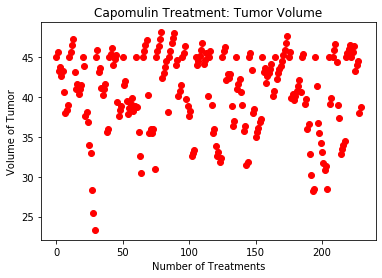

In [28]:
x_axis_c = np.arange(0, len(capomulin_data_list_df))

tumor_c_data = []

tumor_c_data = capomulin_data_list_df["Tumor Volume (mm3)"]
    
plt.title("Capomulin Treatment: Tumor Volume")
plt.xlabel("Number of Treatments")
plt.ylabel("Volume of Tumor")

plt.scatter(x_axis_c, tumor_c_data, marker="o", color="red")
plt.show()

"Infubinol" Treatment List

In [29]:
infubinol_data_list = []
a = 0
b = 0
x = 0
y = 0
z = 0

for mouse_a in infubinol_list_df["Mouse ID"]:
    b = 0
    for mouse_b in clinical_data_file_df["Mouse ID"]:
        
        if mouse_a == mouse_b:
            
            z = clinical_data_file_df.iloc[b]
            print("match for x: " + str(x) + " " + mouse_a + " = " + mouse_b)
            x = x +1
            print(z)
            infubinol_data_list.append(z)
            b = b + 1 
        else:
            print ("no match")    
            print("next mouse_b: " + mouse_b + "  " + str(b))
            b = b + 1
    print("next mouse_a: " + str(a))
    a = a + 1
infubinol_data_list_df = pd.DataFrame(infubinol_data_list)
print("Infubinol data clinical data list")
infubinol_data_list_df

no match
next mouse_b: b128  0
no match
next mouse_b: f932  1
no match
next mouse_b: g107  2
no match
next mouse_b: a457  3
no match
next mouse_b: c819  4
no match
next mouse_b: h246  5
no match
next mouse_b: p189  6
no match
next mouse_b: n923  7
no match
next mouse_b: q119  8
no match
next mouse_b: f993  9
no match
next mouse_b: z234  10
no match
next mouse_b: b559  11
no match
next mouse_b: y260  12
no match
next mouse_b: x930  13
no match
next mouse_b: o725  14
no match
next mouse_b: z969  15
no match
next mouse_b: v835  16
no match
next mouse_b: r604  17
no match
next mouse_b: n304  18
no match
next mouse_b: l700  19
no match
next mouse_b: x336  20
no match
next mouse_b: l725  21
no match
next mouse_b: m133  22
no match
next mouse_b: v295  23
no match
next mouse_b: a818  24
no match
next mouse_b: y601  25
no match
next mouse_b: t724  26
no match
next mouse_b: k382  27
no match
next mouse_b: w422  28
no match
next mouse_b: c326  29
no match
next mouse_b: c139  30
no match
next mous

next mouse_b: g316  1017
no match
next mouse_b: a203  1018
no match
next mouse_b: o287  1019
no match
next mouse_b: j246  1020
no match
next mouse_b: j235  1021
no match
next mouse_b: m550  1022
no match
next mouse_b: a818  1023
no match
next mouse_b: i901  1024
no match
next mouse_b: v923  1025
no match
next mouse_b: c758  1026
no match
next mouse_b: v295  1027
no match
next mouse_b: k862  1028
no match
next mouse_b: z578  1029
no match
next mouse_b: o331  1030
no match
next mouse_b: g791  1031
no match
next mouse_b: w697  1032
no match
next mouse_b: c819  1033
no match
next mouse_b: k403  1034
no match
next mouse_b: m133  1035
no match
next mouse_b: j984  1036
no match
next mouse_b: c832  1037
no match
next mouse_b: q597  1038
no match
next mouse_b: t565  1039
no match
next mouse_b: c402  1040
no match
next mouse_b: h333  1041
no match
next mouse_b: k510  1042
no match
next mouse_b: o973  1043
no match
next mouse_b: l700  1044
no match
next mouse_b: p981  1045
no match
next mouse_b: 

no match
next mouse_b: w151  1689
no match
next mouse_b: p189  1690
no match
next mouse_b: t724  1691
no match
next mouse_b: q483  1692
no match
next mouse_b: r701  1693
no match
next mouse_b: p438  1694
no match
next mouse_b: a818  1695
no match
next mouse_b: x264  1696
no match
next mouse_b: c927  1697
no match
next mouse_b: a411  1698
no match
next mouse_b: j296  1699
no match
next mouse_b: a685  1700
no match
next mouse_b: z795  1701
no match
next mouse_b: v991  1702
no match
next mouse_b: h246  1703
no match
next mouse_b: u364  1704
no match
next mouse_b: o562  1705
no match
next mouse_b: m957  1706
no match
next mouse_b: c819  1707
no match
next mouse_b: x581  1708
no match
next mouse_b: e584  1709
no match
next mouse_b: g558  1710
no match
next mouse_b: y793  1711
no match
next mouse_b: i557  1712
no match
next mouse_b: j984  1713
no match
next mouse_b: l725  1714
no match
next mouse_b: g316  1715
no match
next mouse_b: p136  1716
no match
next mouse_b: r604  1717
no match
next 

no match
next mouse_b: t565  460
no match
next mouse_b: c819  461
no match
next mouse_b: o302  462
no match
next mouse_b: h531  463
no match
next mouse_b: i477  464
no match
next mouse_b: w151  465
no match
next mouse_b: y260  466
no match
next mouse_b: r921  467
no match
next mouse_b: a457  468
no match
next mouse_b: j296  469
no match
next mouse_b: w167  470
no match
next mouse_b: a262  471
no match
next mouse_b: b128  472
no match
next mouse_b: n671  473
no match
next mouse_b: g288  474
no match
next mouse_b: v603  475
no match
next mouse_b: i334  476
no match
next mouse_b: k403  477
no match
next mouse_b: p189  478
no match
next mouse_b: o809  479
no match
next mouse_b: g107  480
no match
next mouse_b: t718  481
match for x: 8 i386 = i386
Mouse ID                 i386
Timepoint                   5
Tumor Volume (mm3)    46.8537
Metastatic Sites            1
Name: 482, dtype: object
no match
next mouse_b: s121  483
no match
next mouse_b: z581  484
no match
next mouse_b: f278  485
no 

next mouse_b: g497  1100
no match
next mouse_b: z795  1101
no match
next mouse_b: a520  1102
no match
next mouse_b: d474  1103
no match
next mouse_b: d251  1104
no match
next mouse_b: s710  1105
no match
next mouse_b: r604  1106
no match
next mouse_b: x401  1107
no match
next mouse_b: m269  1108
no match
next mouse_b: a963  1109
no match
next mouse_b: p189  1110
no match
next mouse_b: g989  1111
no match
next mouse_b: n304  1112
no match
next mouse_b: u149  1113
no match
next mouse_b: x264  1114
no match
next mouse_b: l725  1115
no match
next mouse_b: i177  1116
no match
next mouse_b: l471  1117
no match
next mouse_b: r944  1118
no match
next mouse_b: v295  1119
no match
next mouse_b: x930  1120
no match
next mouse_b: c927  1121
no match
next mouse_b: a520  1122
no match
next mouse_b: y865  1123
no match
next mouse_b: b559  1124
no match
next mouse_b: m546  1125
no match
next mouse_b: v991  1126
no match
next mouse_b: l700  1127
no match
next mouse_b: w167  1128
no match
next mouse_b: 

no match
next mouse_b: o287  1872
no match
next mouse_b: r701  1873
no match
next mouse_b: r811  1874
no match
next mouse_b: u327  1875
no match
next mouse_b: s565  1876
no match
next mouse_b: g570  1877
no match
next mouse_b: i557  1878
no match
next mouse_b: a644  1879
no match
next mouse_b: j755  1880
no match
next mouse_b: e213  1881
no match
next mouse_b: e584  1882
no match
next mouse_b: t718  1883
no match
next mouse_b: o562  1884
no match
next mouse_b: i177  1885
no match
next mouse_b: v991  1886
no match
next mouse_b: z795  1887
no match
next mouse_b: r944  1888
no match
next mouse_b: u364  1889
no match
next mouse_b: p438  1890
no match
next mouse_b: x773  1891
no match
next mouse_b: b879  1892
next mouse_a: 1
no match
next mouse_b: b128  0
no match
next mouse_b: f932  1
no match
next mouse_b: g107  2
no match
next mouse_b: a457  3
no match
next mouse_b: c819  4
no match
next mouse_b: h246  5
no match
next mouse_b: p189  6
no match
next mouse_b: n923  7
no match
next mouse_b:

no match
next mouse_b: a685  717
no match
next mouse_b: a262  718
no match
next mouse_b: b128  719
no match
next mouse_b: r811  720
no match
next mouse_b: z581  721
no match
next mouse_b: c819  722
no match
next mouse_b: r850  723
no match
next mouse_b: b559  724
no match
next mouse_b: c264  725
no match
next mouse_b: o302  726
no match
next mouse_b: g288  727
no match
next mouse_b: h246  728
match for x: 19 a251 = a251
Mouse ID                 a251
Timepoint                  15
Tumor Volume (mm3)    50.5345
Metastatic Sites            1
Name: 729, dtype: object
no match
next mouse_b: c757  730
no match
next mouse_b: j989  731
no match
next mouse_b: i334  732
no match
next mouse_b: f993  733
no match
next mouse_b: y449  734
no match
next mouse_b: i738  735
no match
next mouse_b: i386  736
no match
next mouse_b: u327  737
no match
next mouse_b: q787  738
no match
next mouse_b: n923  739
no match
next mouse_b: c758  740
no match
next mouse_b: c302  741
no match
next mouse_b: q132  742
no

no match
next mouse_b: m601  1512
no match
next mouse_b: a444  1513
no match
next mouse_b: q633  1514
no match
next mouse_b: l471  1515
match for x: 23 a251 = a251
Mouse ID                 a251
Timepoint                  35
Tumor Volume (mm3)    60.9039
Metastatic Sites            1
Name: 1516, dtype: object
no match
next mouse_b: x401  1517
no match
next mouse_b: n304  1518
no match
next mouse_b: o795  1519
no match
next mouse_b: p136  1520
no match
next mouse_b: n923  1521
no match
next mouse_b: r604  1522
no match
next mouse_b: t565  1523
no match
next mouse_b: d251  1524
no match
next mouse_b: j365  1525
no match
next mouse_b: c559  1526
no match
next mouse_b: a492  1527
no match
next mouse_b: g497  1528
no match
next mouse_b: z969  1529
no match
next mouse_b: a401  1530
no match
next mouse_b: f545  1531
no match
next mouse_b: u196  1532
no match
next mouse_b: x402  1533
no match
next mouse_b: r554  1534
no match
next mouse_b: q787  1535
no match
next mouse_b: f234  1536
no match
n

no match
next mouse_b: z314  361
no match
next mouse_b: a818  362
no match
next mouse_b: v764  363
no match
next mouse_b: j365  364
no match
next mouse_b: i557  365
no match
next mouse_b: x264  366
no match
next mouse_b: v991  367
no match
next mouse_b: a788  368
no match
next mouse_b: x111  369
no match
next mouse_b: k510  370
no match
next mouse_b: z435  371
no match
next mouse_b: e584  372
no match
next mouse_b: m331  373
no match
next mouse_b: n678  374
no match
next mouse_b: p981  375
no match
next mouse_b: g558  376
no match
next mouse_b: e291  377
no match
next mouse_b: q511  378
no match
next mouse_b: u946  379
no match
next mouse_b: z795  380
no match
next mouse_b: t451  381
no match
next mouse_b: s337  382
no match
next mouse_b: o562  383
no match
next mouse_b: w540  384
no match
next mouse_b: w140  385
no match
next mouse_b: l215  386
no match
next mouse_b: y793  387
no match
next mouse_b: n763  388
no match
next mouse_b: a203  389
no match
next mouse_b: w584  390
no match
n

no match
next mouse_b: k382  1055
no match
next mouse_b: w422  1056
no match
next mouse_b: s508  1057
no match
next mouse_b: e584  1058
no match
next mouse_b: x264  1059
no match
next mouse_b: e213  1060
no match
next mouse_b: r921  1061
no match
next mouse_b: j755  1062
no match
next mouse_b: e662  1063
no match
next mouse_b: r701  1064
no match
next mouse_b: y260  1065
no match
next mouse_b: i177  1066
no match
next mouse_b: r811  1067
no match
next mouse_b: s565  1068
no match
next mouse_b: m546  1069
no match
next mouse_b: a366  1070
no match
next mouse_b: t724  1071
no match
next mouse_b: p387  1072
no match
next mouse_b: v289  1073
no match
next mouse_b: h246  1074
no match
next mouse_b: l725  1075
no match
next mouse_b: z969  1076
no match
next mouse_b: w540  1077
no match
next mouse_b: i334  1078
no match
next mouse_b: v835  1079
no match
next mouse_b: a444  1080
no match
next mouse_b: t451  1081
no match
next mouse_b: a492  1082
no match
next mouse_b: g288  1083
no match
next 

no match
next mouse_b: n923  1759
no match
next mouse_b: a963  1760
no match
next mouse_b: o331  1761
no match
next mouse_b: s337  1762
no match
next mouse_b: n364  1763
no match
next mouse_b: b128  1764
no match
next mouse_b: l661  1765
no match
next mouse_b: y865  1766
no match
next mouse_b: y769  1767
no match
next mouse_b: b559  1768
no match
next mouse_b: t565  1769
no match
next mouse_b: c282  1770
no match
next mouse_b: l509  1771
no match
next mouse_b: j296  1772
no match
next mouse_b: a411  1773
no match
next mouse_b: p189  1774
no match
next mouse_b: m650  1775
no match
next mouse_b: q597  1776
no match
next mouse_b: g288  1777
no match
next mouse_b: o331  1778
no match
next mouse_b: y163  1779
no match
next mouse_b: i334  1780
no match
next mouse_b: c139  1781
no match
next mouse_b: c832  1782
no match
next mouse_b: a262  1783
match for x: 35 z581 = z581
Mouse ID                 z581
Timepoint                  45
Tumor Volume (mm3)    62.7545
Metastatic Sites            3
Na

no match
next mouse_b: o302  726
no match
next mouse_b: g288  727
no match
next mouse_b: h246  728
no match
next mouse_b: a251  729
no match
next mouse_b: c757  730
no match
next mouse_b: j989  731
no match
next mouse_b: i334  732
no match
next mouse_b: f993  733
no match
next mouse_b: y449  734
no match
next mouse_b: i738  735
no match
next mouse_b: i386  736
no match
next mouse_b: u327  737
no match
next mouse_b: q787  738
no match
next mouse_b: n923  739
no match
next mouse_b: c758  740
no match
next mouse_b: c302  741
no match
next mouse_b: q132  742
no match
next mouse_b: n671  743
no match
next mouse_b: a897  744
no match
next mouse_b: k403  745
no match
next mouse_b: b313  746
no match
next mouse_b: p189  747
no match
next mouse_b: m957  748
no match
next mouse_b: w151  749
no match
next mouse_b: v603  750
no match
next mouse_b: j296  751
no match
next mouse_b: o331  752
no match
next mouse_b: a644  753
match for x: 39 o809 = o809
Mouse ID                 o809
Timepoint         

next mouse_b: a262  1382
no match
next mouse_b: w697  1383
no match
next mouse_b: p981  1384
no match
next mouse_b: c302  1385
no match
next mouse_b: t451  1386
no match
next mouse_b: k483  1387
no match
next mouse_b: q511  1388
no match
next mouse_b: o973  1389
no match
next mouse_b: l897  1390
no match
next mouse_b: j989  1391
no match
next mouse_b: g288  1392
no match
next mouse_b: s337  1393
no match
next mouse_b: a963  1394
no match
next mouse_b: k804  1395
no match
next mouse_b: d474  1396
no match
next mouse_b: a788  1397
no match
next mouse_b: m269  1398
no match
next mouse_b: o926  1399
no match
next mouse_b: b128  1400
no match
next mouse_b: a366  1401
no match
next mouse_b: r701  1402
no match
next mouse_b: m957  1403
no match
next mouse_b: v295  1404
no match
next mouse_b: b759  1405
no match
next mouse_b: n364  1406
no match
next mouse_b: z969  1407
no match
next mouse_b: w151  1408
no match
next mouse_b: l700  1409
no match
next mouse_b: o287  1410
no match
next mouse_b: 

next mouse_b: l725  271
no match
next mouse_b: q633  272
no match
next mouse_b: f129  273
no match
next mouse_b: q483  274
no match
next mouse_b: a444  275
no match
next mouse_b: v835  276
no match
next mouse_b: r604  277
no match
next mouse_b: f394  278
no match
next mouse_b: y865  279
no match
next mouse_b: d251  280
no match
next mouse_b: b313  281
no match
next mouse_b: y769  282
no match
next mouse_b: z234  283
no match
next mouse_b: b559  284
no match
next mouse_b: f993  285
no match
next mouse_b: q119  286
no match
next mouse_b: j989  287
no match
next mouse_b: w150  288
no match
next mouse_b: n923  289
no match
next mouse_b: y449  290
no match
next mouse_b: l661  291
no match
next mouse_b: c302  292
no match
next mouse_b: c264  293
no match
next mouse_b: l471  294
no match
next mouse_b: x930  295
no match
next mouse_b: k754  296
no match
next mouse_b: f436  297
no match
next mouse_b: v295  298
no match
next mouse_b: j913  299
no match
next mouse_b: s710  300
no match
next mouse

next mouse_b: a818  1023
no match
next mouse_b: i901  1024
no match
next mouse_b: v923  1025
no match
next mouse_b: c758  1026
no match
next mouse_b: v295  1027
no match
next mouse_b: k862  1028
no match
next mouse_b: z578  1029
no match
next mouse_b: o331  1030
no match
next mouse_b: g791  1031
no match
next mouse_b: w697  1032
no match
next mouse_b: c819  1033
no match
next mouse_b: k403  1034
no match
next mouse_b: m133  1035
no match
next mouse_b: j984  1036
no match
next mouse_b: c832  1037
no match
next mouse_b: q597  1038
no match
next mouse_b: t565  1039
no match
next mouse_b: c402  1040
no match
next mouse_b: h333  1041
no match
next mouse_b: k510  1042
no match
next mouse_b: o973  1043
no match
next mouse_b: l700  1044
no match
next mouse_b: p981  1045
no match
next mouse_b: m650  1046
no match
next mouse_b: j989  1047
no match
next mouse_b: b879  1048
no match
next mouse_b: g107  1049
no match
next mouse_b: a644  1050
no match
next mouse_b: y793  1051
no match
next mouse_b: 

no match
next mouse_b: y163  1753
no match
next mouse_b: q511  1754
no match
next mouse_b: l733  1755
no match
next mouse_b: m269  1756
no match
next mouse_b: y769  1757
no match
next mouse_b: g288  1758
no match
next mouse_b: n923  1759
no match
next mouse_b: a963  1760
no match
next mouse_b: o331  1761
no match
next mouse_b: s337  1762
no match
next mouse_b: n364  1763
no match
next mouse_b: b128  1764
no match
next mouse_b: l661  1765
no match
next mouse_b: y865  1766
no match
next mouse_b: y769  1767
no match
next mouse_b: b559  1768
no match
next mouse_b: t565  1769
no match
next mouse_b: c282  1770
no match
next mouse_b: l509  1771
no match
next mouse_b: j296  1772
no match
next mouse_b: a411  1773
no match
next mouse_b: p189  1774
no match
next mouse_b: m650  1775
no match
next mouse_b: q597  1776
no match
next mouse_b: g288  1777
no match
next mouse_b: o331  1778
no match
next mouse_b: y163  1779
no match
next mouse_b: i334  1780
no match
next mouse_b: c139  1781
no match
next 

next mouse_b: m601  606
no match
next mouse_b: a492  607
no match
next mouse_b: x773  608
no match
next mouse_b: a401  609
no match
next mouse_b: i177  610
no match
next mouse_b: s166  611
no match
next mouse_b: q582  612
no match
next mouse_b: w540  613
no match
next mouse_b: j365  614
no match
next mouse_b: v764  615
no match
next mouse_b: g791  616
no match
next mouse_b: y478  617
no match
next mouse_b: l897  618
no match
next mouse_b: o795  619
no match
next mouse_b: g989  620
no match
next mouse_b: p136  621
no match
next mouse_b: t451  622
no match
next mouse_b: c282  623
no match
next mouse_b: s337  624
no match
next mouse_b: m546  625
no match
next mouse_b: v989  626
no match
next mouse_b: a788  627
no match
next mouse_b: a644  628
no match
next mouse_b: v409  629
no match
next mouse_b: r944  630
no match
next mouse_b: a963  631
no match
next mouse_b: t994  632
no match
next mouse_b: c559  633
no match
next mouse_b: a520  634
no match
next mouse_b: a444  635
no match
next mouse

next mouse_b: h246  1447
no match
next mouse_b: s710  1448
no match
next mouse_b: v991  1449
no match
next mouse_b: b559  1450
no match
next mouse_b: i738  1451
no match
next mouse_b: z795  1452
no match
next mouse_b: c282  1453
no match
next mouse_b: e476  1454
no match
next mouse_b: k382  1455
no match
next mouse_b: y769  1456
no match
next mouse_b: o562  1457
no match
next mouse_b: i177  1458
no match
next mouse_b: y478  1459
no match
next mouse_b: y865  1460
no match
next mouse_b: a520  1461
no match
next mouse_b: x264  1462
no match
next mouse_b: a685  1463
no match
next mouse_b: y793  1464
no match
next mouse_b: y260  1465
no match
next mouse_b: c927  1466
no match
next mouse_b: i334  1467
no match
next mouse_b: l897  1468
no match
next mouse_b: o809  1469
no match
next mouse_b: a520  1470
no match
next mouse_b: p189  1471
match for x: 59 k483 = k483
Mouse ID                 k483
Timepoint                  35
Tumor Volume (mm3)    60.5416
Metastatic Sites            2
Name: 1472,

next mouse_b: b742  327
no match
next mouse_b: n630  328
no match
next mouse_b: g989  329
no match
next mouse_b: e213  330
no match
next mouse_b: a366  331
no match
next mouse_b: w746  332
no match
next mouse_b: s141  333
no match
next mouse_b: i901  334
no match
next mouse_b: t198  335
no match
next mouse_b: b879  336
no match
next mouse_b: k603  337
no match
next mouse_b: o523  338
no match
next mouse_b: v923  339
no match
next mouse_b: f966  340
no match
next mouse_b: p387  341
no match
next mouse_b: g867  342
no match
next mouse_b: i635  343
no match
next mouse_b: s619  344
no match
next mouse_b: a699  345
no match
next mouse_b: q132  346
no match
next mouse_b: k862  347
no match
next mouse_b: h333  348
no match
next mouse_b: x401  349
no match
next mouse_b: o926  350
no match
next mouse_b: c927  351
no match
next mouse_b: c559  352
no match
next mouse_b: r701  353
no match
next mouse_b: j119  354
no match
next mouse_b: p438  355
no match
next mouse_b: m269  356
no match
next mouse

no match
next mouse_b: b559  1124
no match
next mouse_b: m546  1125
no match
next mouse_b: v991  1126
no match
next mouse_b: l700  1127
no match
next mouse_b: w167  1128
no match
next mouse_b: s710  1129
no match
next mouse_b: n304  1130
no match
next mouse_b: k210  1131
no match
next mouse_b: p438  1132
no match
next mouse_b: x581  1133
no match
next mouse_b: q582  1134
no match
next mouse_b: r604  1135
no match
next mouse_b: j119  1136
no match
next mouse_b: l490  1137
no match
next mouse_b: q483  1138
no match
next mouse_b: a275  1139
no match
next mouse_b: a818  1140
no match
next mouse_b: l733  1141
no match
next mouse_b: o287  1142
no match
next mouse_b: z969  1143
no match
next mouse_b: m133  1144
no match
next mouse_b: t565  1145
no match
next mouse_b: l509  1146
no match
next mouse_b: o795  1147
no match
next mouse_b: t724  1148
no match
next mouse_b: b759  1149
no match
next mouse_b: b487  1150
no match
next mouse_b: u196  1151
no match
next mouse_b: r701  1152
no match
next 

next mouse_b: m546  1808
no match
next mouse_b: a818  1809
no match
next mouse_b: l471  1810
no match
next mouse_b: s337  1811
no match
next mouse_b: a963  1812
no match
next mouse_b: q511  1813
no match
next mouse_b: k403  1814
no match
next mouse_b: t451  1815
no match
next mouse_b: o926  1816
no match
next mouse_b: l897  1817
no match
next mouse_b: c302  1818
no match
next mouse_b: w350  1819
no match
next mouse_b: c402  1820
no match
next mouse_b: v923  1821
no match
next mouse_b: c758  1822
no match
next mouse_b: j984  1823
no match
next mouse_b: a699  1824
no match
next mouse_b: a897  1825
no match
next mouse_b: t198  1826
no match
next mouse_b: k862  1827
no match
next mouse_b: j989  1828
no match
next mouse_b: b742  1829
no match
next mouse_b: m269  1830
no match
next mouse_b: c264  1831
no match
next mouse_b: g296  1832
no match
next mouse_b: j913  1833
no match
next mouse_b: w575  1834
no match
next mouse_b: k894  1835
no match
next mouse_b: a444  1836
no match
next mouse_b: 

no match
next mouse_b: c757  655
no match
next mouse_b: g296  656
no match
next mouse_b: r921  657
no match
next mouse_b: q633  658
no match
next mouse_b: t565  659
no match
next mouse_b: r811  660
no match
next mouse_b: f234  661
no match
next mouse_b: x613  662
no match
next mouse_b: x402  663
no match
next mouse_b: o302  664
no match
next mouse_b: w575  665
no match
next mouse_b: c458  666
no match
next mouse_b: i477  667
no match
next mouse_b: c758  668
no match
next mouse_b: d164  669
no match
next mouse_b: q610  670
no match
next mouse_b: s185  671
no match
next mouse_b: q511  672
no match
next mouse_b: c264  673
no match
next mouse_b: k862  674
no match
next mouse_b: n763  675
no match
next mouse_b: h333  676
no match
next mouse_b: c402  677
no match
next mouse_b: q787  678
no match
next mouse_b: b128  679
no match
next mouse_b: g867  680
no match
next mouse_b: g989  681
no match
next mouse_b: b742  682
no match
next mouse_b: e662  683
no match
next mouse_b: i669  684
no match
n

match for x: 78 a577 = a577
Mouse ID                 a577
Timepoint                  30
Tumor Volume (mm3)    57.0319
Metastatic Sites            2
Name: 1371, dtype: object
no match
next mouse_b: j984  1372
no match
next mouse_b: q597  1373
no match
next mouse_b: k403  1374
no match
next mouse_b: w350  1375
no match
next mouse_b: c832  1376
no match
next mouse_b: s185  1377
no match
next mouse_b: w584  1378
no match
next mouse_b: y163  1379
no match
next mouse_b: g989  1380
no match
next mouse_b: h333  1381
no match
next mouse_b: a262  1382
no match
next mouse_b: w697  1383
no match
next mouse_b: p981  1384
no match
next mouse_b: c302  1385
no match
next mouse_b: t451  1386
no match
next mouse_b: k483  1387
no match
next mouse_b: q511  1388
no match
next mouse_b: o973  1389
no match
next mouse_b: l897  1390
no match
next mouse_b: j989  1391
no match
next mouse_b: g288  1392
no match
next mouse_b: s337  1393
no match
next mouse_b: a963  1394
no match
next mouse_b: k804  1395
no match
n

next mouse_b: g558  212
no match
next mouse_b: u946  213
no match
next mouse_b: o562  214
no match
next mouse_b: v991  215
no match
next mouse_b: c927  216
no match
next mouse_b: x226  217
no match
next mouse_b: p438  218
no match
next mouse_b: b487  219
no match
next mouse_b: o287  220
no match
next mouse_b: q483  221
no match
next mouse_b: t573  222
no match
next mouse_b: f345  223
no match
next mouse_b: i334  224
no match
next mouse_b: l264  225
no match
next mouse_b: j246  226
no match
next mouse_b: r554  227
no match
next mouse_b: s185  228
no match
next mouse_b: b742  229
no match
next mouse_b: x401  230
no match
next mouse_b: l509  231
no match
next mouse_b: s710  232
no match
next mouse_b: r157  233
no match
next mouse_b: u364  234
no match
next mouse_b: j119  235
no match
next mouse_b: v923  236
no match
next mouse_b: w914  237
no match
next mouse_b: i738  238
no match
next mouse_b: r944  239
no match
next mouse_b: y793  240
no match
next mouse_b: g316  241
no match
next mouse

next mouse_b: r554  940
no match
next mouse_b: w350  941
no match
next mouse_b: k603  942
no match
next mouse_b: a251  943
no match
next mouse_b: k483  944
no match
next mouse_b: a262  945
no match
next mouse_b: n763  946
no match
next mouse_b: q787  947
no match
next mouse_b: y163  948
no match
next mouse_b: g570  949
no match
next mouse_b: g989  950
no match
next mouse_b: s141  951
no match
next mouse_b: q511  952
no match
next mouse_b: s121  953
no match
next mouse_b: t718  954
no match
next mouse_b: k210  955
no match
next mouse_b: u149  956
no match
next mouse_b: n671  957
no match
next mouse_b: o302  958
no match
next mouse_b: q633  959
no match
next mouse_b: x822  960
no match
next mouse_b: a685  961
no match
next mouse_b: m957  962
no match
next mouse_b: w575  963
no match
next mouse_b: l733  964
no match
next mouse_b: c757  965
no match
next mouse_b: w151  966
no match
next mouse_b: g296  967
no match
next mouse_b: s185  968
no match
next mouse_b: a897  969
no match
next mouse

no match
next mouse_b: b742  1676
no match
next mouse_b: w422  1677
no match
next mouse_b: k862  1678
no match
next mouse_b: t198  1679
no match
next mouse_b: k210  1680
no match
next mouse_b: a699  1681
no match
next mouse_b: f345  1682
no match
next mouse_b: v923  1683
no match
next mouse_b: m550  1684
no match
next mouse_b: l661  1685
no match
next mouse_b: o287  1686
no match
next mouse_b: v295  1687
no match
next mouse_b: e213  1688
no match
next mouse_b: w151  1689
no match
next mouse_b: p189  1690
no match
next mouse_b: t724  1691
no match
next mouse_b: q483  1692
no match
next mouse_b: r701  1693
no match
next mouse_b: p438  1694
no match
next mouse_b: a818  1695
no match
next mouse_b: x264  1696
no match
next mouse_b: c927  1697
no match
next mouse_b: a411  1698
no match
next mouse_b: j296  1699
no match
next mouse_b: a685  1700
no match
next mouse_b: z795  1701
no match
next mouse_b: v991  1702
no match
next mouse_b: h246  1703
no match
next mouse_b: u364  1704
no match
next 

next mouse_b: w151  555
no match
next mouse_b: y769  556
no match
next mouse_b: y865  557
no match
next mouse_b: b559  558
no match
next mouse_b: s141  559
no match
next mouse_b: l471  560
no match
next mouse_b: x930  561
no match
next mouse_b: a685  562
no match
next mouse_b: w193  563
no match
next mouse_b: x822  564
no match
next mouse_b: k382  565
no match
next mouse_b: v289  566
no match
next mouse_b: b487  567
no match
next mouse_b: c895  568
no match
next mouse_b: t724  569
no match
next mouse_b: j119  570
no match
next mouse_b: p438  571
no match
next mouse_b: r701  572
no match
next mouse_b: m650  573
no match
next mouse_b: i557  574
no match
next mouse_b: v719  575
no match
next mouse_b: c927  576
no match
next mouse_b: x264  577
no match
next mouse_b: v991  578
no match
next mouse_b: l264  579
no match
next mouse_b: o562  580
no match
next mouse_b: f345  581
no match
next mouse_b: a818  582
no match
next mouse_b: o287  583
no match
next mouse_b: m550  584
no match
next mouse

no match
next mouse_b: g107  1237
no match
next mouse_b: k804  1238
no match
next mouse_b: w151  1239
no match
next mouse_b: d474  1240
no match
next mouse_b: e227  1241
no match
next mouse_b: m550  1242
no match
next mouse_b: r554  1243
no match
next mouse_b: f345  1244
match for x: 86 c139 = c139
Mouse ID                c139
Timepoint                 25
Tumor Volume (mm3)    61.462
Metastatic Sites           0
Name: 1245, dtype: object
no match
next mouse_b: g288  1246
no match
next mouse_b: p189  1247
no match
next mouse_b: g497  1248
no match
next mouse_b: g316  1249
no match
next mouse_b: y260  1250
no match
next mouse_b: c895  1251
no match
next mouse_b: i334  1252
no match
next mouse_b: h246  1253
no match
next mouse_b: k483  1254
no match
next mouse_b: z578  1255
no match
next mouse_b: c766  1256
no match
next mouse_b: a577  1257
no match
next mouse_b: c819  1258
no match
next mouse_b: q597  1259
no match
next mouse_b: c832  1260
no match
next mouse_b: i669  1261
no match
next 

next mouse_b: g791  72
no match
next mouse_b: a520  73
no match
next mouse_b: u196  74
no match
next mouse_b: m546  75
no match
next mouse_b: w678  76
no match
next mouse_b: n364  77
no match
next mouse_b: s508  78
no match
next mouse_b: e662  79
no match
next mouse_b: z578  80
no match
next mouse_b: r921  81
no match
next mouse_b: a492  82
no match
next mouse_b: w540  83
no match
next mouse_b: v764  84
no match
next mouse_b: z795  85
no match
next mouse_b: e291  86
no match
next mouse_b: e584  87
no match
next mouse_b: e213  88
no match
next mouse_b: j755  89
no match
next mouse_b: s565  90
no match
next mouse_b: a366  91
no match
next mouse_b: p387  92
no match
next mouse_b: b879  93
no match
next mouse_b: i901  94
no match
next mouse_b: k862  95
no match
next mouse_b: g867  96
no match
next mouse_b: s619  97
no match
next mouse_b: w697  98
no match
next mouse_b: j984  99
no match
next mouse_b: c402  100
no match
next mouse_b: h333  101
no match
next mouse_b: k510  102
no match
next 

next mouse_b: s337  851
no match
next mouse_b: v991  852
no match
next mouse_b: a788  853
no match
next mouse_b: a963  854
no match
next mouse_b: x264  855
no match
next mouse_b: e584  856
no match
next mouse_b: c927  857
no match
next mouse_b: p981  858
no match
next mouse_b: o926  859
no match
next mouse_b: i557  860
no match
next mouse_b: c559  861
no match
next mouse_b: u364  862
no match
next mouse_b: r701  863
no match
next mouse_b: l897  864
no match
next mouse_b: k510  865
no match
next mouse_b: e213  866
no match
next mouse_b: h333  867
no match
next mouse_b: c402  868
no match
next mouse_b: g989  869
no match
next mouse_b: m601  870
no match
next mouse_b: m133  871
no match
next mouse_b: m331  872
no match
next mouse_b: w914  873
no match
next mouse_b: s710  874
no match
next mouse_b: a699  875
no match
next mouse_b: g296  876
no match
next mouse_b: a411  877
no match
next mouse_b: b879  878
no match
next mouse_b: p387  879
no match
next mouse_b: r604  880
no match
next mouse

next mouse_b: y865  1728
no match
next mouse_b: q633  1729
no match
next mouse_b: z969  1730
no match
next mouse_b: a251  1731
no match
next mouse_b: w914  1732
no match
next mouse_b: w575  1733
no match
next mouse_b: r554  1734
no match
next mouse_b: i386  1735
no match
next mouse_b: j913  1736
no match
next mouse_b: g296  1737
no match
next mouse_b: i738  1738
no match
next mouse_b: c832  1739
no match
next mouse_b: c559  1740
no match
next mouse_b: x401  1741
no match
next mouse_b: n304  1742
no match
next mouse_b: w350  1743
no match
next mouse_b: m650  1744
no match
next mouse_b: c402  1745
no match
next mouse_b: b559  1746
no match
next mouse_b: o926  1747
no match
next mouse_b: c139  1748
no match
next mouse_b: l897  1749
no match
next mouse_b: x822  1750
no match
next mouse_b: l700  1751
no match
next mouse_b: t451  1752
no match
next mouse_b: y163  1753
no match
next mouse_b: q511  1754
no match
next mouse_b: l733  1755
no match
next mouse_b: m269  1756
no match
next mouse_b: 

next mouse_b: m546  625
no match
next mouse_b: v989  626
no match
next mouse_b: a788  627
no match
next mouse_b: a644  628
no match
next mouse_b: v409  629
no match
next mouse_b: r944  630
no match
next mouse_b: a963  631
no match
next mouse_b: t994  632
no match
next mouse_b: c559  633
no match
next mouse_b: a520  634
no match
next mouse_b: a444  635
no match
next mouse_b: u196  636
no match
next mouse_b: e227  637
no match
next mouse_b: f129  638
no match
next mouse_b: t718  639
no match
next mouse_b: n967  640
no match
next mouse_b: d251  641
no match
next mouse_b: b313  642
no match
next mouse_b: f545  643
no match
next mouse_b: a411  644
no match
next mouse_b: w914  645
no match
next mouse_b: c302  646
no match
next mouse_b: j989  647
no match
next mouse_b: k894  648
no match
next mouse_b: y449  649
no match
next mouse_b: w150  650
no match
next mouse_b: j913  651
no match
next mouse_b: a897  652
no match
next mouse_b: k754  653
no match
next mouse_b: k403  654
no match
next mouse

no match
next mouse_b: q787  1345
no match
next mouse_b: a401  1346
no match
next mouse_b: f545  1347
no match
next mouse_b: x402  1348
no match
next mouse_b: f234  1349
no match
next mouse_b: a251  1350
no match
next mouse_b: q633  1351
no match
next mouse_b: c458  1352
no match
next mouse_b: v603  1353
no match
next mouse_b: j246  1354
no match
next mouse_b: w575  1355
no match
next mouse_b: w914  1356
no match
next mouse_b: q610  1357
no match
next mouse_b: i386  1358
no match
next mouse_b: m601  1359
no match
next mouse_b: k894  1360
no match
next mouse_b: u327  1361
no match
next mouse_b: g296  1362
no match
next mouse_b: j913  1363
no match
next mouse_b: q132  1364
no match
next mouse_b: i334  1365
no match
next mouse_b: x401  1366
no match
next mouse_b: o809  1367
no match
next mouse_b: c559  1368
no match
next mouse_b: o331  1369
no match
next mouse_b: a897  1370
no match
next mouse_b: a577  1371
no match
next mouse_b: j984  1372
no match
next mouse_b: q597  1373
no match
next 

no match
next mouse_b: g316  241
no match
next mouse_b: g288  242
no match
next mouse_b: l897  243
no match
next mouse_b: w150  244
no match
next mouse_b: t565  245
no match
next mouse_b: i557  246
no match
next mouse_b: m957  247
no match
next mouse_b: f966  248
no match
next mouse_b: m601  249
no match
next mouse_b: a275  250
no match
next mouse_b: w575  251
no match
next mouse_b: x822  252
no match
next mouse_b: l509  253
no match
next mouse_b: n304  254
no match
next mouse_b: d164  255
no match
next mouse_b: l897  256
no match
next mouse_b: l558  257
no match
next mouse_b: g296  258
no match
next mouse_b: c458  259
no match
next mouse_b: a401  260
no match
next mouse_b: l700  261
no match
next mouse_b: f234  262
no match
next mouse_b: x613  263
no match
next mouse_b: u149  264
no match
next mouse_b: k210  265
no match
next mouse_b: x402  266
no match
next mouse_b: q610  267
no match
next mouse_b: x581  268
no match
next mouse_b: a492  269
no match
next mouse_b: m133  270
no match
n

next mouse_b: c302  979
no match
next mouse_b: j296  980
no match
next mouse_b: l490  981
no match
next mouse_b: l509  982
no match
next mouse_b: w914  983
no match
next mouse_b: k894  984
no match
next mouse_b: e227  985
no match
next mouse_b: a275  986
no match
next mouse_b: x581  987
no match
next mouse_b: o562  988
no match
next mouse_b: c139  989
no match
next mouse_b: c282  990
no match
next mouse_b: v719  991
no match
next mouse_b: v991  992
no match
next mouse_b: s337  993
no match
next mouse_b: c927  994
no match
next mouse_b: t994  995
no match
next mouse_b: a788  996
match for x: 102 c895 = c895
Mouse ID                 c895
Timepoint                  20
Tumor Volume (mm3)    53.6768
Metastatic Sites            2
Name: 997, dtype: object
no match
next mouse_b: l897  998
no match
next mouse_b: f345  999
no match
next mouse_b: c559  1000
no match
next mouse_b: r944  1001
no match
next mouse_b: p438  1002
no match
next mouse_b: o795  1003
no match
next mouse_b: y865  1004
no ma

next mouse_b: m550  1684
no match
next mouse_b: l661  1685
no match
next mouse_b: o287  1686
no match
next mouse_b: v295  1687
no match
next mouse_b: e213  1688
no match
next mouse_b: w151  1689
no match
next mouse_b: p189  1690
no match
next mouse_b: t724  1691
no match
next mouse_b: q483  1692
no match
next mouse_b: r701  1693
no match
next mouse_b: p438  1694
no match
next mouse_b: a818  1695
no match
next mouse_b: x264  1696
no match
next mouse_b: c927  1697
no match
next mouse_b: a411  1698
no match
next mouse_b: j296  1699
no match
next mouse_b: a685  1700
no match
next mouse_b: z795  1701
no match
next mouse_b: v991  1702
no match
next mouse_b: h246  1703
no match
next mouse_b: u364  1704
no match
next mouse_b: o562  1705
no match
next mouse_b: m957  1706
no match
next mouse_b: c819  1707
no match
next mouse_b: x581  1708
no match
next mouse_b: e584  1709
no match
next mouse_b: g558  1710
no match
next mouse_b: y793  1711
no match
next mouse_b: i557  1712
no match
next mouse_b: 

no match
next mouse_b: w151  465
no match
next mouse_b: y260  466
no match
next mouse_b: r921  467
no match
next mouse_b: a457  468
no match
next mouse_b: j296  469
no match
next mouse_b: w167  470
no match
next mouse_b: a262  471
no match
next mouse_b: b128  472
no match
next mouse_b: n671  473
no match
next mouse_b: g288  474
no match
next mouse_b: v603  475
no match
next mouse_b: i334  476
no match
next mouse_b: k403  477
no match
next mouse_b: p189  478
no match
next mouse_b: o809  479
no match
next mouse_b: g107  480
no match
next mouse_b: t718  481
no match
next mouse_b: i386  482
no match
next mouse_b: s121  483
no match
next mouse_b: z581  484
no match
next mouse_b: f278  485
no match
next mouse_b: j235  486
no match
next mouse_b: m957  487
no match
next mouse_b: e291  488
no match
next mouse_b: u946  489
no match
next mouse_b: g558  490
no match
next mouse_b: i386  491
no match
next mouse_b: e584  492
no match
next mouse_b: o523  493
no match
next mouse_b: i635  494
no match
n

next mouse_b: o287  1142
no match
next mouse_b: z969  1143
no match
next mouse_b: m133  1144
no match
next mouse_b: t565  1145
no match
next mouse_b: l509  1146
no match
next mouse_b: o795  1147
no match
next mouse_b: t724  1148
no match
next mouse_b: b759  1149
no match
next mouse_b: b487  1150
no match
next mouse_b: u196  1151
no match
next mouse_b: r701  1152
no match
next mouse_b: y478  1153
no match
next mouse_b: x773  1154
no match
next mouse_b: x822  1155
no match
next mouse_b: o809  1156
no match
next mouse_b: i557  1157
no match
next mouse_b: p136  1158
no match
next mouse_b: c559  1159
no match
next mouse_b: m269  1160
no match
next mouse_b: a788  1161
no match
next mouse_b: x401  1162
no match
next mouse_b: a963  1163
no match
next mouse_b: l897  1164
no match
next mouse_b: s337  1165
no match
next mouse_b: b313  1166
no match
next mouse_b: j989  1167
no match
next mouse_b: q511  1168
no match
next mouse_b: t451  1169
no match
next mouse_b: c302  1170
no match
next mouse_b: 

next mouse_b: t451  1815
no match
next mouse_b: o926  1816
no match
next mouse_b: l897  1817
no match
next mouse_b: c302  1818
no match
next mouse_b: w350  1819
no match
next mouse_b: c402  1820
no match
next mouse_b: v923  1821
no match
next mouse_b: c758  1822
no match
next mouse_b: j984  1823
no match
next mouse_b: a699  1824
no match
next mouse_b: a897  1825
no match
next mouse_b: t198  1826
no match
next mouse_b: k862  1827
no match
next mouse_b: j989  1828
no match
next mouse_b: b742  1829
no match
next mouse_b: m269  1830
no match
next mouse_b: c264  1831
no match
next mouse_b: g296  1832
no match
next mouse_b: j913  1833
no match
next mouse_b: w575  1834
no match
next mouse_b: k894  1835
no match
next mouse_b: a444  1836
no match
next mouse_b: q633  1837
no match
next mouse_b: w914  1838
no match
next mouse_b: a401  1839
no match
next mouse_b: f545  1840
no match
next mouse_b: x402  1841
no match
next mouse_b: j365  1842
no match
next mouse_b: m601  1843
no match
next mouse_b: 

no match
next mouse_b: c282  623
no match
next mouse_b: s337  624
no match
next mouse_b: m546  625
no match
next mouse_b: v989  626
no match
next mouse_b: a788  627
no match
next mouse_b: a644  628
no match
next mouse_b: v409  629
no match
next mouse_b: r944  630
no match
next mouse_b: a963  631
no match
next mouse_b: t994  632
no match
next mouse_b: c559  633
no match
next mouse_b: a520  634
no match
next mouse_b: a444  635
no match
next mouse_b: u196  636
no match
next mouse_b: e227  637
no match
next mouse_b: f129  638
no match
next mouse_b: t718  639
no match
next mouse_b: n967  640
no match
next mouse_b: d251  641
no match
next mouse_b: b313  642
no match
next mouse_b: f545  643
no match
next mouse_b: a411  644
no match
next mouse_b: w914  645
no match
next mouse_b: c302  646
no match
next mouse_b: j989  647
no match
next mouse_b: k894  648
no match
next mouse_b: y449  649
no match
next mouse_b: w150  650
no match
next mouse_b: j913  651
no match
next mouse_b: a897  652
no match
n

next mouse_b: q582  1427
no match
next mouse_b: g791  1428
no match
next mouse_b: n671  1429
no match
next mouse_b: e227  1430
no match
next mouse_b: o795  1431
no match
next mouse_b: r604  1432
no match
next mouse_b: x581  1433
no match
next mouse_b: c819  1434
no match
next mouse_b: l490  1435
no match
next mouse_b: a818  1436
no match
next mouse_b: c766  1437
no match
next mouse_b: l725  1438
no match
next mouse_b: q483  1439
no match
next mouse_b: t565  1440
no match
next mouse_b: j119  1441
no match
next mouse_b: l661  1442
no match
next mouse_b: m546  1443
no match
next mouse_b: x822  1444
no match
next mouse_b: k210  1445
no match
next mouse_b: w167  1446
no match
next mouse_b: h246  1447
no match
next mouse_b: s710  1448
no match
next mouse_b: v991  1449
no match
next mouse_b: b559  1450
no match
next mouse_b: i738  1451
no match
next mouse_b: z795  1452
no match
next mouse_b: c282  1453
no match
next mouse_b: e476  1454
no match
next mouse_b: k382  1455
no match
next mouse_b: 

no match
next mouse_b: l700  261
no match
next mouse_b: f234  262
no match
next mouse_b: x613  263
no match
next mouse_b: u149  264
no match
next mouse_b: k210  265
no match
next mouse_b: x402  266
no match
next mouse_b: q610  267
no match
next mouse_b: x581  268
no match
next mouse_b: a492  269
no match
next mouse_b: m133  270
no match
next mouse_b: l725  271
no match
next mouse_b: q633  272
no match
next mouse_b: f129  273
no match
next mouse_b: q483  274
no match
next mouse_b: a444  275
no match
next mouse_b: v835  276
no match
next mouse_b: r604  277
no match
next mouse_b: f394  278
no match
next mouse_b: y865  279
no match
next mouse_b: d251  280
no match
next mouse_b: b313  281
no match
next mouse_b: y769  282
no match
next mouse_b: z234  283
no match
next mouse_b: b559  284
no match
next mouse_b: f993  285
no match
next mouse_b: q119  286
no match
next mouse_b: j989  287
no match
next mouse_b: w150  288
no match
next mouse_b: n923  289
no match
next mouse_b: y449  290
no match
n

no match
next mouse_b: w151  1239
no match
next mouse_b: d474  1240
no match
next mouse_b: e227  1241
no match
next mouse_b: m550  1242
no match
next mouse_b: r554  1243
no match
next mouse_b: f345  1244
no match
next mouse_b: c139  1245
no match
next mouse_b: g288  1246
no match
next mouse_b: p189  1247
no match
next mouse_b: g497  1248
no match
next mouse_b: g316  1249
no match
next mouse_b: y260  1250
no match
next mouse_b: c895  1251
no match
next mouse_b: i334  1252
no match
next mouse_b: h246  1253
no match
next mouse_b: k483  1254
no match
next mouse_b: z578  1255
no match
next mouse_b: c766  1256
no match
next mouse_b: a577  1257
no match
next mouse_b: c819  1258
no match
next mouse_b: q597  1259
no match
next mouse_b: c832  1260
no match
next mouse_b: i669  1261
no match
next mouse_b: a685  1262
no match
next mouse_b: a262  1263
no match
next mouse_b: m650  1264
no match
next mouse_b: y163  1265
no match
next mouse_b: n671  1266
no match
next mouse_b: v289  1267
no match
next 

no match
next mouse_b: s565  90
no match
next mouse_b: a366  91
no match
next mouse_b: p387  92
no match
next mouse_b: b879  93
no match
next mouse_b: i901  94
no match
next mouse_b: k862  95
no match
next mouse_b: g867  96
no match
next mouse_b: s619  97
no match
next mouse_b: w697  98
no match
next mouse_b: j984  99
no match
next mouse_b: c402  100
no match
next mouse_b: h333  101
no match
next mouse_b: k510  102
no match
next mouse_b: p981  103
no match
next mouse_b: t451  104
no match
next mouse_b: a963  105
no match
next mouse_b: m269  106
no match
next mouse_b: g989  107
no match
next mouse_b: z314  108
no match
next mouse_b: o848  109
no match
next mouse_b: v719  110
no match
next mouse_b: q597  111
no match
next mouse_b: c895  112
no match
next mouse_b: a203  113
no match
next mouse_b: f394  114
no match
next mouse_b: c264  115
no match
next mouse_b: n967  116
no match
next mouse_b: f545  117
no match
next mouse_b: k894  118
no match
next mouse_b: k754  119
no match
next mouse_

next mouse_b: c580  784
no match
next mouse_b: t565  785
no match
next mouse_b: g497  786
no match
next mouse_b: t718  787
no match
next mouse_b: g107  788
no match
next mouse_b: s121  789
no match
next mouse_b: z578  790
no match
next mouse_b: j246  791
no match
next mouse_b: k804  792
no match
next mouse_b: w167  793
no match
next mouse_b: d474  794
no match
next mouse_b: y260  795
no match
next mouse_b: v766  796
no match
next mouse_b: w584  797
no match
next mouse_b: x773  798
no match
next mouse_b: i669  799
no match
next mouse_b: i177  800
no match
next mouse_b: r157  801
no match
next mouse_b: k382  802
no match
next mouse_b: k483  803
no match
next mouse_b: q582  804
match for x: 135 e476 = e476
Mouse ID                 e476
Timepoint                  15
Tumor Volume (mm3)    54.0462
Metastatic Sites            0
Name: 805, dtype: object
no match
next mouse_b: g791  806
no match
next mouse_b: g316  807
no match
next mouse_b: r554  808
no match
next mouse_b: o973  809
no match
n

no match
next mouse_b: u327  1509
no match
next mouse_b: j913  1510
no match
next mouse_b: y769  1511
no match
next mouse_b: m601  1512
no match
next mouse_b: a444  1513
no match
next mouse_b: q633  1514
no match
next mouse_b: l471  1515
no match
next mouse_b: a251  1516
no match
next mouse_b: x401  1517
no match
next mouse_b: n304  1518
no match
next mouse_b: o795  1519
no match
next mouse_b: p136  1520
no match
next mouse_b: n923  1521
no match
next mouse_b: r604  1522
no match
next mouse_b: t565  1523
no match
next mouse_b: d251  1524
no match
next mouse_b: j365  1525
no match
next mouse_b: c559  1526
no match
next mouse_b: a492  1527
no match
next mouse_b: g497  1528
no match
next mouse_b: z969  1529
no match
next mouse_b: a401  1530
no match
next mouse_b: f545  1531
no match
next mouse_b: u196  1532
no match
next mouse_b: x402  1533
no match
next mouse_b: r554  1534
no match
next mouse_b: q787  1535
no match
next mouse_b: f234  1536
no match
next mouse_b: j296  1537
no match
next 

next mouse_b: o287  314
no match
next mouse_b: p310  315
no match
next mouse_b: r107  316
no match
next mouse_b: s565  317
no match
next mouse_b: w350  318
no match
next mouse_b: s187  319
no match
next mouse_b: j984  320
no match
next mouse_b: w697  321
no match
next mouse_b: j755  322
no match
next mouse_b: g570  323
no match
next mouse_b: u364  324
no match
next mouse_b: x209  325
no match
next mouse_b: c402  326
no match
next mouse_b: b742  327
no match
next mouse_b: n630  328
no match
next mouse_b: g989  329
no match
next mouse_b: e213  330
no match
next mouse_b: a366  331
no match
next mouse_b: w746  332
no match
next mouse_b: s141  333
no match
next mouse_b: i901  334
no match
next mouse_b: t198  335
no match
next mouse_b: b879  336
no match
next mouse_b: k603  337
no match
next mouse_b: o523  338
no match
next mouse_b: v923  339
no match
next mouse_b: f966  340
no match
next mouse_b: p387  341
no match
next mouse_b: g867  342
no match
next mouse_b: i635  343
no match
next mouse

next mouse_b: v603  1099
no match
next mouse_b: g497  1100
no match
next mouse_b: z795  1101
no match
next mouse_b: a520  1102
no match
next mouse_b: d474  1103
no match
next mouse_b: d251  1104
no match
next mouse_b: s710  1105
no match
next mouse_b: r604  1106
no match
next mouse_b: x401  1107
no match
next mouse_b: m269  1108
no match
next mouse_b: a963  1109
no match
next mouse_b: p189  1110
no match
next mouse_b: g989  1111
no match
next mouse_b: n304  1112
no match
next mouse_b: u149  1113
no match
next mouse_b: x264  1114
no match
next mouse_b: l725  1115
no match
next mouse_b: i177  1116
no match
next mouse_b: l471  1117
no match
next mouse_b: r944  1118
no match
next mouse_b: v295  1119
no match
next mouse_b: x930  1120
no match
next mouse_b: c927  1121
no match
next mouse_b: a520  1122
no match
next mouse_b: y865  1123
no match
next mouse_b: b559  1124
no match
next mouse_b: m546  1125
no match
next mouse_b: v991  1126
no match
next mouse_b: l700  1127
no match
next mouse_b: 

no match
next mouse_b: g791  1870
no match
next mouse_b: i635  1871
no match
next mouse_b: o287  1872
no match
next mouse_b: r701  1873
no match
next mouse_b: r811  1874
no match
next mouse_b: u327  1875
no match
next mouse_b: s565  1876
no match
next mouse_b: g570  1877
no match
next mouse_b: i557  1878
no match
next mouse_b: a644  1879
no match
next mouse_b: j755  1880
no match
next mouse_b: e213  1881
no match
next mouse_b: e584  1882
no match
next mouse_b: t718  1883
no match
next mouse_b: o562  1884
no match
next mouse_b: i177  1885
no match
next mouse_b: v991  1886
no match
next mouse_b: z795  1887
no match
next mouse_b: r944  1888
no match
next mouse_b: u364  1889
no match
next mouse_b: p438  1890
no match
next mouse_b: x773  1891
no match
next mouse_b: b879  1892
next mouse_a: 18
no match
next mouse_b: b128  0
no match
next mouse_b: f932  1
no match
next mouse_b: g107  2
no match
next mouse_b: a457  3
no match
next mouse_b: c819  4
no match
next mouse_b: h246  5
no match
next m

no match
next mouse_b: u327  737
no match
next mouse_b: q787  738
no match
next mouse_b: n923  739
no match
next mouse_b: c758  740
no match
next mouse_b: c302  741
no match
next mouse_b: q132  742
no match
next mouse_b: n671  743
no match
next mouse_b: a897  744
no match
next mouse_b: k403  745
no match
next mouse_b: b313  746
no match
next mouse_b: p189  747
no match
next mouse_b: m957  748
no match
next mouse_b: w151  749
no match
next mouse_b: v603  750
no match
next mouse_b: j296  751
no match
next mouse_b: o331  752
no match
next mouse_b: a644  753
no match
next mouse_b: o809  754
no match
next mouse_b: n763  755
no match
next mouse_b: w422  756
no match
next mouse_b: o795  757
no match
next mouse_b: a203  758
no match
next mouse_b: a520  759
no match
next mouse_b: y163  760
no match
next mouse_b: r944  761
no match
next mouse_b: m550  762
no match
next mouse_b: f345  763
no match
next mouse_b: s152  764
no match
next mouse_b: t994  765
no match
next mouse_b: c895  766
no match
n

next mouse_b: y478  1478
no match
next mouse_b: s185  1479
no match
next mouse_b: s337  1480
no match
next mouse_b: o973  1481
no match
next mouse_b: d474  1482
no match
next mouse_b: h246  1483
no match
next mouse_b: j989  1484
no match
next mouse_b: k804  1485
no match
next mouse_b: e227  1486
no match
next mouse_b: w151  1487
no match
next mouse_b: q511  1488
no match
next mouse_b: l700  1489
no match
next mouse_b: t451  1490
no match
next mouse_b: e662  1491
no match
next mouse_b: z581  1492
no match
next mouse_b: c264  1493
no match
next mouse_b: w914  1494
no match
next mouse_b: l661  1495
no match
next mouse_b: v603  1496
no match
next mouse_b: j246  1497
no match
next mouse_b: q610  1498
no match
next mouse_b: l509  1499
no match
next mouse_b: m546  1500
no match
next mouse_b: w575  1501
no match
next mouse_b: i386  1502
no match
next mouse_b: y865  1503
no match
next mouse_b: n364  1504
no match
next mouse_b: i738  1505
no match
next mouse_b: k894  1506
no match
next mouse_b: 

no match
next mouse_b: j755  322
no match
next mouse_b: g570  323
no match
next mouse_b: u364  324
no match
next mouse_b: x209  325
no match
next mouse_b: c402  326
no match
next mouse_b: b742  327
no match
next mouse_b: n630  328
no match
next mouse_b: g989  329
no match
next mouse_b: e213  330
no match
next mouse_b: a366  331
no match
next mouse_b: w746  332
no match
next mouse_b: s141  333
no match
next mouse_b: i901  334
no match
next mouse_b: t198  335
no match
next mouse_b: b879  336
no match
next mouse_b: k603  337
no match
next mouse_b: o523  338
no match
next mouse_b: v923  339
no match
next mouse_b: f966  340
no match
next mouse_b: p387  341
no match
next mouse_b: g867  342
no match
next mouse_b: i635  343
no match
next mouse_b: s619  344
no match
next mouse_b: a699  345
no match
next mouse_b: q132  346
no match
next mouse_b: k862  347
no match
next mouse_b: h333  348
no match
next mouse_b: x401  349
no match
next mouse_b: o926  350
no match
next mouse_b: c927  351
no match
n

no match
next mouse_b: x581  987
no match
next mouse_b: o562  988
no match
next mouse_b: c139  989
no match
next mouse_b: c282  990
no match
next mouse_b: v719  991
no match
next mouse_b: v991  992
no match
next mouse_b: s337  993
no match
next mouse_b: c927  994
no match
next mouse_b: t994  995
no match
next mouse_b: a788  996
no match
next mouse_b: c895  997
no match
next mouse_b: l897  998
no match
next mouse_b: f345  999
no match
next mouse_b: c559  1000
no match
next mouse_b: r944  1001
no match
next mouse_b: p438  1002
no match
next mouse_b: o795  1003
no match
next mouse_b: y865  1004
no match
next mouse_b: x773  1005
no match
next mouse_b: w193  1006
no match
next mouse_b: j365  1007
no match
next mouse_b: q483  1008
no match
next mouse_b: j119  1009
no match
next mouse_b: e476  1010
no match
next mouse_b: w167  1011
no match
next mouse_b: q582  1012
no match
next mouse_b: p136  1013
no match
next mouse_b: w584  1014
no match
next mouse_b: b487  1015
no match
next mouse_b: y478

no match
next mouse_b: p438  1694
no match
next mouse_b: a818  1695
no match
next mouse_b: x264  1696
no match
next mouse_b: c927  1697
no match
next mouse_b: a411  1698
no match
next mouse_b: j296  1699
no match
next mouse_b: a685  1700
no match
next mouse_b: z795  1701
no match
next mouse_b: v991  1702
no match
next mouse_b: h246  1703
no match
next mouse_b: u364  1704
no match
next mouse_b: o562  1705
no match
next mouse_b: m957  1706
no match
next mouse_b: c819  1707
no match
next mouse_b: x581  1708
no match
next mouse_b: e584  1709
no match
next mouse_b: g558  1710
no match
next mouse_b: y793  1711
no match
next mouse_b: i557  1712
no match
next mouse_b: j984  1713
no match
next mouse_b: l725  1714
no match
next mouse_b: g316  1715
no match
next mouse_b: p136  1716
no match
next mouse_b: r604  1717
no match
next mouse_b: a492  1718
no match
next mouse_b: k483  1719
no match
next mouse_b: o973  1720
no match
next mouse_b: j365  1721
no match
next mouse_b: d474  1722
no match
next 

next mouse_b: c139  525
no match
next mouse_b: j296  526
no match
next mouse_b: o331  527
no match
next mouse_b: b759  528
no match
next mouse_b: l490  529
no match
next mouse_b: z969  530
match for x: 159 n671 = n671
Mouse ID                 n671
Timepoint                  10
Tumor Volume (mm3)    51.0394
Metastatic Sites            0
Name: 531, dtype: object
no match
next mouse_b: g107  532
no match
next mouse_b: v835  533
no match
next mouse_b: s710  534
no match
next mouse_b: s121  535
no match
next mouse_b: f436  536
no match
next mouse_b: r604  537
no match
next mouse_b: l733  538
no match
next mouse_b: l509  539
no match
next mouse_b: y260  540
no match
next mouse_b: v766  541
no match
next mouse_b: n304  542
no match
next mouse_b: a457  543
no match
next mouse_b: l558  544
no match
next mouse_b: o725  545
no match
next mouse_b: c819  546
no match
next mouse_b: i738  547
no match
next mouse_b: n923  548
no match
next mouse_b: p189  549
no match
next mouse_b: q119  550
no match
n

no match
next mouse_b: a262  1263
no match
next mouse_b: m650  1264
no match
next mouse_b: y163  1265
match for x: 162 n671 = n671
Mouse ID                 n671
Timepoint                  25
Tumor Volume (mm3)    56.1745
Metastatic Sites            0
Name: 1266, dtype: object
no match
next mouse_b: v289  1267
no match
next mouse_b: b128  1268
no match
next mouse_b: m957  1269
no match
next mouse_b: o973  1270
no match
next mouse_b: n763  1271
no match
next mouse_b: o331  1272
no match
next mouse_b: j296  1273
no match
next mouse_b: q132  1274
no match
next mouse_b: w584  1275
no match
next mouse_b: j246  1276
no match
next mouse_b: e476  1277
no match
next mouse_b: c580  1278
no match
next mouse_b: u327  1279
no match
next mouse_b: i386  1280
no match
next mouse_b: s152  1281
no match
next mouse_b: w422  1282
no match
next mouse_b: v603  1283
no match
next mouse_b: a251  1284
no match
next mouse_b: l661  1285
no match
next mouse_b: k382  1286
no match
next mouse_b: i738  1287
no match


no match
next mouse_b: s337  131
no match
next mouse_b: q511  132
no match
next mouse_b: m331  133
no match
next mouse_b: o926  134
no match
next mouse_b: d133  135
no match
next mouse_b: n630  136
no match
next mouse_b: g989  137
no match
next mouse_b: a401  138
no match
next mouse_b: w350  139
no match
next mouse_b: c302  140
no match
next mouse_b: a897  141
no match
next mouse_b: j235  142
no match
next mouse_b: q787  143
no match
next mouse_b: a262  144
no match
next mouse_b: r850  145
no match
next mouse_b: i669  146
no match
next mouse_b: n763  147
no match
next mouse_b: s152  148
no match
next mouse_b: c766  149
no match
next mouse_b: e227  150
no match
next mouse_b: c282  151
no match
next mouse_b: v989  152
no match
next mouse_b: w140  153
no match
next mouse_b: v409  154
no match
next mouse_b: l872  155
no match
next mouse_b: o795  156
no match
next mouse_b: y478  157
no match
next mouse_b: q582  158
no match
next mouse_b: s166  159
no match
next mouse_b: x773  160
no match
n

no match
next mouse_b: l897  864
no match
next mouse_b: k510  865
no match
next mouse_b: e213  866
no match
next mouse_b: h333  867
no match
next mouse_b: c402  868
no match
next mouse_b: g989  869
no match
next mouse_b: m601  870
no match
next mouse_b: m133  871
no match
next mouse_b: m331  872
no match
next mouse_b: w914  873
no match
next mouse_b: s710  874
no match
next mouse_b: a699  875
no match
next mouse_b: g296  876
no match
next mouse_b: a411  877
no match
next mouse_b: b879  878
no match
next mouse_b: p387  879
no match
next mouse_b: r604  880
no match
next mouse_b: l509  881
no match
next mouse_b: f436  882
no match
next mouse_b: u149  883
no match
next mouse_b: b759  884
no match
next mouse_b: g867  885
no match
next mouse_b: k603  886
no match
next mouse_b: i635  887
no match
next mouse_b: k862  888
no match
next mouse_b: k754  889
no match
next mouse_b: j913  890
no match
next mouse_b: v835  891
no match
next mouse_b: l490  892
no match
next mouse_b: k894  893
no match
n

no match
next mouse_b: x402  1727
no match
next mouse_b: y865  1728
no match
next mouse_b: q633  1729
no match
next mouse_b: z969  1730
no match
next mouse_b: a251  1731
no match
next mouse_b: w914  1732
no match
next mouse_b: w575  1733
no match
next mouse_b: r554  1734
no match
next mouse_b: i386  1735
no match
next mouse_b: j913  1736
no match
next mouse_b: g296  1737
no match
next mouse_b: i738  1738
no match
next mouse_b: c832  1739
no match
next mouse_b: c559  1740
no match
next mouse_b: x401  1741
no match
next mouse_b: n304  1742
no match
next mouse_b: w350  1743
no match
next mouse_b: m650  1744
no match
next mouse_b: c402  1745
no match
next mouse_b: b559  1746
no match
next mouse_b: o926  1747
no match
next mouse_b: c139  1748
no match
next mouse_b: l897  1749
no match
next mouse_b: x822  1750
no match
next mouse_b: l700  1751
no match
next mouse_b: t451  1752
no match
next mouse_b: y163  1753
no match
next mouse_b: q511  1754
no match
next mouse_b: l733  1755
no match
next 

no match
next mouse_b: p387  519
no match
next mouse_b: v923  520
no match
next mouse_b: x111  521
no match
next mouse_b: a577  522
no match
next mouse_b: g288  523
no match
next mouse_b: v603  524
no match
next mouse_b: c139  525
no match
next mouse_b: j296  526
no match
next mouse_b: o331  527
no match
next mouse_b: b759  528
no match
next mouse_b: l490  529
no match
next mouse_b: z969  530
no match
next mouse_b: n671  531
no match
next mouse_b: g107  532
no match
next mouse_b: v835  533
no match
next mouse_b: s710  534
no match
next mouse_b: s121  535
no match
next mouse_b: f436  536
no match
next mouse_b: r604  537
no match
next mouse_b: l733  538
no match
next mouse_b: l509  539
no match
next mouse_b: y260  540
no match
next mouse_b: v766  541
no match
next mouse_b: n304  542
no match
next mouse_b: a457  543
no match
next mouse_b: l558  544
no match
next mouse_b: o725  545
no match
next mouse_b: c819  546
no match
next mouse_b: i738  547
no match
next mouse_b: n923  548
no match
n

no match
next mouse_b: o973  1270
no match
next mouse_b: n763  1271
no match
next mouse_b: o331  1272
no match
next mouse_b: j296  1273
no match
next mouse_b: q132  1274
no match
next mouse_b: w584  1275
no match
next mouse_b: j246  1276
no match
next mouse_b: e476  1277
no match
next mouse_b: c580  1278
no match
next mouse_b: u327  1279
no match
next mouse_b: i386  1280
no match
next mouse_b: s152  1281
no match
next mouse_b: w422  1282
no match
next mouse_b: v603  1283
no match
next mouse_b: a251  1284
no match
next mouse_b: l661  1285
no match
next mouse_b: k382  1286
no match
next mouse_b: i738  1287
no match
next mouse_b: n923  1288
no match
next mouse_b: e662  1289
no match
next mouse_b: n364  1290
no match
next mouse_b: q787  1291
no match
next mouse_b: y793  1292
no match
next mouse_b: z581  1293
no match
next mouse_b: s508  1294
no match
next mouse_b: a203  1295
no match
next mouse_b: m650  1296
no match
next mouse_b: n763  1297
no match
next mouse_b: z578  1298
no match
next 

next mouse_b: v719  110
no match
next mouse_b: q597  111
no match
next mouse_b: c895  112
no match
next mouse_b: a203  113
no match
next mouse_b: f394  114
no match
next mouse_b: c264  115
no match
next mouse_b: n967  116
no match
next mouse_b: f545  117
no match
next mouse_b: k894  118
no match
next mouse_b: k754  119
no match
next mouse_b: g296  120
no match
next mouse_b: d164  121
no match
next mouse_b: w575  122
no match
next mouse_b: x613  123
no match
next mouse_b: q633  124
no match
next mouse_b: b313  125
no match
next mouse_b: f129  126
no match
next mouse_b: j365  127
no match
next mouse_b: p136  128
no match
next mouse_b: c559  129
no match
next mouse_b: a788  130
no match
next mouse_b: s337  131
no match
next mouse_b: q511  132
no match
next mouse_b: m331  133
no match
next mouse_b: o926  134
no match
next mouse_b: d133  135
no match
next mouse_b: n630  136
no match
next mouse_b: g989  137
no match
next mouse_b: a401  138
no match
next mouse_b: w350  139
no match
next mouse

no match
next mouse_b: y260  795
no match
next mouse_b: v766  796
no match
next mouse_b: w584  797
no match
next mouse_b: x773  798
no match
next mouse_b: i669  799
no match
next mouse_b: i177  800
no match
next mouse_b: r157  801
no match
next mouse_b: k382  802
no match
next mouse_b: k483  803
no match
next mouse_b: q582  804
no match
next mouse_b: e476  805
no match
next mouse_b: g791  806
no match
next mouse_b: g316  807
no match
next mouse_b: r554  808
no match
next mouse_b: o973  809
no match
next mouse_b: e662  810
no match
next mouse_b: w193  811
no match
next mouse_b: s141  812
no match
next mouse_b: n967  813
no match
next mouse_b: p438  814
no match
next mouse_b: g989  815
no match
next mouse_b: b487  816
no match
next mouse_b: g570  817
no match
next mouse_b: j119  818
no match
next mouse_b: j755  819
no match
next mouse_b: v764  820
no match
next mouse_b: a818  821
no match
next mouse_b: o287  822
no match
next mouse_b: w540  823
no match
next mouse_b: w350  824
no match
n

no match
next mouse_b: i177  1458
no match
next mouse_b: y478  1459
no match
next mouse_b: y865  1460
no match
next mouse_b: a520  1461
no match
next mouse_b: x264  1462
match for x: 174 a685 = a685
Mouse ID                 a685
Timepoint                  30
Tumor Volume (mm3)    55.4539
Metastatic Sites            1
Name: 1463, dtype: object
no match
next mouse_b: y793  1464
no match
next mouse_b: y260  1465
no match
next mouse_b: c927  1466
no match
next mouse_b: i334  1467
no match
next mouse_b: l897  1468
no match
next mouse_b: o809  1469
no match
next mouse_b: a520  1470
no match
next mouse_b: p189  1471
no match
next mouse_b: k483  1472
no match
next mouse_b: x822  1473
no match
next mouse_b: a963  1474
no match
next mouse_b: l725  1475
no match
next mouse_b: l733  1476
no match
next mouse_b: m269  1477
no match
next mouse_b: y478  1478
no match
next mouse_b: s185  1479
no match
next mouse_b: s337  1480
no match
next mouse_b: o973  1481
no match
next mouse_b: d474  1482
no match


,Mouse ID,Timepoint,Tumor Volume (mm3),Metastatic Sites
41,q132,0,45.000000,0
346,q132,5,46.716399,1
603,q132,10,47.953844,2
742,q132,15,49.159749,3
920,q132,20,51.909025,4
...,...,...,...,...
1262,a685,25,51.939951,0
1463,a685,30,55.453855,1
1590,a685,35,58.092629,1
1700,a685,40,60.567904,2


In [30]:
infubinol_data_list_df["Tumor Volume (mm3)"]

41      45.000000
346     46.716399
603     47.953844
742     49.159749
920     51.909025
          ...    
1262    51.939951
1463    55.453855
1590    58.092629
1700    60.567904
1794    66.083066
Name: Tumor Volume (mm3), Length: 178, dtype: float64

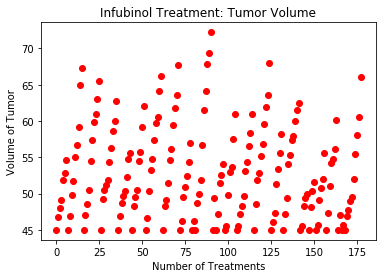

In [31]:
x_axis_i = np.arange(0, len(infubinol_data_list_df))

tumor_i_data = []

tumor_i_data = infubinol_data_list_df["Tumor Volume (mm3)"]
    
plt.title("Infubinol Treatment: Tumor Volume")
plt.xlabel("Number of Treatments")
plt.ylabel("Volume of Tumor")

plt.scatter(x_axis_i, tumor_i_data, marker="o", color="red")
plt.show()

"Ketapril" Treatment List

In [32]:
ketapril_data_list = []
a = 0
b = 0
x = 0
y = 0
z = 0

for mouse_a in ketapril_list_df["Mouse ID"]:
    b = 0
    for mouse_b in clinical_data_file_df["Mouse ID"]:
        
        if mouse_a == mouse_b:
            
            z = clinical_data_file_df.iloc[b]
            print("match for x: " + str(x) + " " + mouse_a + " = " + mouse_b)
            x = x +1
            print(z)
            ketapril_data_list.append(z)
            b = b + 1 
        else:
            print ("no match")    
            print("next mouse_b: " + mouse_b + "  " + str(b))
            b = b + 1
    print("next mouse_a: " + str(a))
    a = a + 1
ketapril_data_list_df = pd.DataFrame(ketapril_data_list)
print("Placebo data clinical data list")
ketapril_data_list_df

no match
next mouse_b: b128  0
no match
next mouse_b: f932  1
no match
next mouse_b: g107  2
no match
next mouse_b: a457  3
no match
next mouse_b: c819  4
no match
next mouse_b: h246  5
no match
next mouse_b: p189  6
no match
next mouse_b: n923  7
match for x: 0 q119 = q119
Mouse ID              q119
Timepoint                0
Tumor Volume (mm3)      45
Metastatic Sites         0
Name: 8, dtype: object
no match
next mouse_b: f993  9
no match
next mouse_b: z234  10
no match
next mouse_b: b559  11
no match
next mouse_b: y260  12
no match
next mouse_b: x930  13
no match
next mouse_b: o725  14
no match
next mouse_b: z969  15
no match
next mouse_b: v835  16
no match
next mouse_b: r604  17
no match
next mouse_b: n304  18
no match
next mouse_b: l700  19
no match
next mouse_b: x336  20
no match
next mouse_b: l725  21
no match
next mouse_b: m133  22
no match
next mouse_b: v295  23
no match
next mouse_b: a818  24
no match
next mouse_b: y601  25
no match
next mouse_b: t724  26
no match
next mouse

no match
next mouse_b: a444  1080
no match
next mouse_b: t451  1081
no match
next mouse_b: a492  1082
no match
next mouse_b: g288  1083
no match
next mouse_b: x402  1084
no match
next mouse_b: n923  1085
no match
next mouse_b: i738  1086
no match
next mouse_b: n364  1087
no match
next mouse_b: f234  1088
no match
next mouse_b: m601  1089
no match
next mouse_b: f993  1090
no match
next mouse_b: c458  1091
no match
next mouse_b: u196  1092
no match
next mouse_b: a411  1093
no match
next mouse_b: x930  1094
no match
next mouse_b: u327  1095
no match
next mouse_b: q610  1096
no match
next mouse_b: b559  1097
no match
next mouse_b: j913  1098
no match
next mouse_b: v603  1099
no match
next mouse_b: g497  1100
no match
next mouse_b: z795  1101
no match
next mouse_b: a520  1102
no match
next mouse_b: d474  1103
no match
next mouse_b: d251  1104
no match
next mouse_b: s710  1105
no match
next mouse_b: r604  1106
no match
next mouse_b: x401  1107
no match
next mouse_b: m269  1108
no match
next 

no match
next mouse_b: j296  180
no match
next mouse_b: u149  181
no match
next mouse_b: u153  182
no match
next mouse_b: w151  183
no match
next mouse_b: h531  184
no match
next mouse_b: a685  185
no match
next mouse_b: o813  186
no match
next mouse_b: m756  187
no match
next mouse_b: n671  188
no match
next mouse_b: s121  189
no match
next mouse_b: v766  190
no match
next mouse_b: w193  191
no match
next mouse_b: e476  192
no match
next mouse_b: w584  193
no match
next mouse_b: b447  194
no match
next mouse_b: k210  195
no match
next mouse_b: a275  196
no match
next mouse_b: x581  197
no match
next mouse_b: n482  198
no match
next mouse_b: t198  199
no match
next mouse_b: l215  200
no match
next mouse_b: s141  201
no match
next mouse_b: o523  202
no match
next mouse_b: i635  203
no match
next mouse_b: w746  204
no match
next mouse_b: r107  205
no match
next mouse_b: s187  206
no match
next mouse_b: g570  207
no match
next mouse_b: x209  208
no match
next mouse_b: x111  209
no match
n

next mouse_b: c139  1245
no match
next mouse_b: g288  1246
no match
next mouse_b: p189  1247
no match
next mouse_b: g497  1248
no match
next mouse_b: g316  1249
no match
next mouse_b: y260  1250
no match
next mouse_b: c895  1251
no match
next mouse_b: i334  1252
no match
next mouse_b: h246  1253
no match
next mouse_b: k483  1254
no match
next mouse_b: z578  1255
no match
next mouse_b: c766  1256
no match
next mouse_b: a577  1257
no match
next mouse_b: c819  1258
no match
next mouse_b: q597  1259
no match
next mouse_b: c832  1260
no match
next mouse_b: i669  1261
no match
next mouse_b: a685  1262
no match
next mouse_b: a262  1263
no match
next mouse_b: m650  1264
no match
next mouse_b: y163  1265
no match
next mouse_b: n671  1266
no match
next mouse_b: v289  1267
no match
next mouse_b: b128  1268
no match
next mouse_b: m957  1269
no match
next mouse_b: o973  1270
no match
next mouse_b: n763  1271
no match
next mouse_b: o331  1272
no match
next mouse_b: j296  1273
no match
next mouse_b: 

next mouse_b: a520  1857
no match
next mouse_b: k210  1858
no match
next mouse_b: j119  1859
no match
next mouse_b: y478  1860
no match
next mouse_b: l725  1861
no match
next mouse_b: x822  1862
no match
next mouse_b: l700  1863
no match
next mouse_b: l733  1864
no match
next mouse_b: n304  1865
no match
next mouse_b: o795  1866
no match
next mouse_b: u196  1867
no match
next mouse_b: r604  1868
no match
next mouse_b: z969  1869
no match
next mouse_b: g791  1870
no match
next mouse_b: i635  1871
no match
next mouse_b: o287  1872
no match
next mouse_b: r701  1873
no match
next mouse_b: r811  1874
no match
next mouse_b: u327  1875
no match
next mouse_b: s565  1876
no match
next mouse_b: g570  1877
no match
next mouse_b: i557  1878
no match
next mouse_b: a644  1879
no match
next mouse_b: j755  1880
no match
next mouse_b: e213  1881
no match
next mouse_b: e584  1882
no match
next mouse_b: t718  1883
no match
next mouse_b: o562  1884
no match
next mouse_b: i177  1885
no match
next mouse_b: 

no match
next mouse_b: j989  647
no match
next mouse_b: k894  648
no match
next mouse_b: y449  649
no match
next mouse_b: w150  650
no match
next mouse_b: j913  651
no match
next mouse_b: a897  652
no match
next mouse_b: k754  653
no match
next mouse_b: k403  654
no match
next mouse_b: c757  655
no match
next mouse_b: g296  656
no match
next mouse_b: r921  657
no match
next mouse_b: q633  658
no match
next mouse_b: t565  659
no match
next mouse_b: r811  660
no match
next mouse_b: f234  661
no match
next mouse_b: x613  662
no match
next mouse_b: x402  663
no match
next mouse_b: o302  664
no match
next mouse_b: w575  665
no match
next mouse_b: c458  666
no match
next mouse_b: i477  667
no match
next mouse_b: c758  668
no match
next mouse_b: d164  669
no match
next mouse_b: q610  670
no match
next mouse_b: s185  671
no match
next mouse_b: q511  672
no match
next mouse_b: c264  673
no match
next mouse_b: k862  674
no match
next mouse_b: n763  675
no match
next mouse_b: h333  676
no match
n

no match
next mouse_b: w914  1356
no match
next mouse_b: q610  1357
no match
next mouse_b: i386  1358
no match
next mouse_b: m601  1359
no match
next mouse_b: k894  1360
no match
next mouse_b: u327  1361
no match
next mouse_b: g296  1362
no match
next mouse_b: j913  1363
no match
next mouse_b: q132  1364
no match
next mouse_b: i334  1365
no match
next mouse_b: x401  1366
no match
next mouse_b: o809  1367
no match
next mouse_b: c559  1368
no match
next mouse_b: o331  1369
no match
next mouse_b: a897  1370
no match
next mouse_b: a577  1371
no match
next mouse_b: j984  1372
no match
next mouse_b: q597  1373
no match
next mouse_b: k403  1374
no match
next mouse_b: w350  1375
no match
next mouse_b: c832  1376
no match
next mouse_b: s185  1377
no match
next mouse_b: w584  1378
no match
next mouse_b: y163  1379
no match
next mouse_b: g989  1380
no match
next mouse_b: h333  1381
no match
next mouse_b: a262  1382
no match
next mouse_b: w697  1383
no match
next mouse_b: p981  1384
no match
next 

no match
next mouse_b: k894  118
no match
next mouse_b: k754  119
no match
next mouse_b: g296  120
no match
next mouse_b: d164  121
no match
next mouse_b: w575  122
no match
next mouse_b: x613  123
no match
next mouse_b: q633  124
no match
next mouse_b: b313  125
no match
next mouse_b: f129  126
no match
next mouse_b: j365  127
no match
next mouse_b: p136  128
no match
next mouse_b: c559  129
no match
next mouse_b: a788  130
no match
next mouse_b: s337  131
no match
next mouse_b: q511  132
no match
next mouse_b: m331  133
no match
next mouse_b: o926  134
no match
next mouse_b: d133  135
no match
next mouse_b: n630  136
no match
next mouse_b: g989  137
no match
next mouse_b: a401  138
no match
next mouse_b: w350  139
no match
next mouse_b: c302  140
no match
next mouse_b: a897  141
no match
next mouse_b: j235  142
no match
next mouse_b: q787  143
no match
next mouse_b: a262  144
no match
next mouse_b: r850  145
no match
next mouse_b: i669  146
no match
next mouse_b: n763  147
no match
n

no match
next mouse_b: b759  884
no match
next mouse_b: g867  885
no match
next mouse_b: k603  886
no match
next mouse_b: i635  887
no match
next mouse_b: k862  888
no match
next mouse_b: k754  889
no match
next mouse_b: j913  890
no match
next mouse_b: v835  891
no match
next mouse_b: l490  892
no match
next mouse_b: k894  893
no match
next mouse_b: l733  894
no match
next mouse_b: f966  895
no match
next mouse_b: f545  896
no match
next mouse_b: o725  897
no match
next mouse_b: p310  898
no match
next mouse_b: r107  899
no match
next mouse_b: q633  900
no match
next mouse_b: x930  901
no match
next mouse_b: f234  902
no match
next mouse_b: l700  903
no match
next mouse_b: a444  904
no match
next mouse_b: a366  905
no match
next mouse_b: x822  906
no match
next mouse_b: x613  907
no match
next mouse_b: l471  908
no match
next mouse_b: z969  909
no match
next mouse_b: c458  910
no match
next mouse_b: q610  911
no match
next mouse_b: w697  912
no match
next mouse_b: v923  913
no match
n

no match
next mouse_b: c927  1579
no match
next mouse_b: j755  1580
no match
next mouse_b: y260  1581
no match
next mouse_b: w422  1582
no match
next mouse_b: x264  1583
no match
next mouse_b: g570  1584
no match
next mouse_b: e213  1585
no match
next mouse_b: q483  1586
no match
next mouse_b: c757  1587
no match
next mouse_b: a411  1588
no match
next mouse_b: o562  1589
no match
next mouse_b: a685  1590
no match
next mouse_b: a897  1591
no match
next mouse_b: g989  1592
no match
next mouse_b: o331  1593
no match
next mouse_b: q597  1594
no match
next mouse_b: j984  1595
no match
next mouse_b: v295  1596
no match
next mouse_b: q582  1597
no match
next mouse_b: k862  1598
no match
next mouse_b: j119  1599
no match
next mouse_b: k210  1600
no match
next mouse_b: y163  1601
no match
next mouse_b: a275  1602
no match
next mouse_b: w350  1603
no match
next mouse_b: s508  1604
no match
next mouse_b: k403  1605
no match
next mouse_b: a699  1606
no match
next mouse_b: s710  1607
no match
next 

no match
next mouse_b: w167  470
no match
next mouse_b: a262  471
no match
next mouse_b: b128  472
no match
next mouse_b: n671  473
no match
next mouse_b: g288  474
no match
next mouse_b: v603  475
no match
next mouse_b: i334  476
no match
next mouse_b: k403  477
no match
next mouse_b: p189  478
no match
next mouse_b: o809  479
no match
next mouse_b: g107  480
no match
next mouse_b: t718  481
no match
next mouse_b: i386  482
no match
next mouse_b: s121  483
no match
next mouse_b: z581  484
no match
next mouse_b: f278  485
no match
next mouse_b: j235  486
no match
next mouse_b: m957  487
no match
next mouse_b: e291  488
no match
next mouse_b: u946  489
no match
next mouse_b: g558  490
no match
next mouse_b: i386  491
no match
next mouse_b: e584  492
no match
next mouse_b: o523  493
no match
next mouse_b: i635  494
no match
next mouse_b: b879  495
no match
next mouse_b: u327  496
no match
next mouse_b: n678  497
no match
next mouse_b: r554  498
no match
next mouse_b: z435  499
no match
n

no match
next mouse_b: c757  1228
no match
next mouse_b: s141  1229
no match
next mouse_b: i901  1230
no match
next mouse_b: b879  1231
no match
next mouse_b: v923  1232
no match
next mouse_b: y769  1233
no match
next mouse_b: g791  1234
no match
next mouse_b: c282  1235
no match
next mouse_b: s121  1236
no match
next mouse_b: g107  1237
no match
next mouse_b: k804  1238
no match
next mouse_b: w151  1239
no match
next mouse_b: d474  1240
no match
next mouse_b: e227  1241
no match
next mouse_b: m550  1242
no match
next mouse_b: r554  1243
no match
next mouse_b: f345  1244
no match
next mouse_b: c139  1245
no match
next mouse_b: g288  1246
no match
next mouse_b: p189  1247
no match
next mouse_b: g497  1248
no match
next mouse_b: g316  1249
no match
next mouse_b: y260  1250
no match
next mouse_b: c895  1251
no match
next mouse_b: i334  1252
no match
next mouse_b: h246  1253
no match
next mouse_b: k483  1254
no match
next mouse_b: z578  1255
no match
next mouse_b: c766  1256
no match
next 

no match
next mouse_b: a492  82
no match
next mouse_b: w540  83
no match
next mouse_b: v764  84
no match
next mouse_b: z795  85
no match
next mouse_b: e291  86
no match
next mouse_b: e584  87
no match
next mouse_b: e213  88
no match
next mouse_b: j755  89
no match
next mouse_b: s565  90
no match
next mouse_b: a366  91
no match
next mouse_b: p387  92
no match
next mouse_b: b879  93
no match
next mouse_b: i901  94
no match
next mouse_b: k862  95
no match
next mouse_b: g867  96
no match
next mouse_b: s619  97
no match
next mouse_b: w697  98
no match
next mouse_b: j984  99
no match
next mouse_b: c402  100
no match
next mouse_b: h333  101
no match
next mouse_b: k510  102
no match
next mouse_b: p981  103
no match
next mouse_b: t451  104
no match
next mouse_b: a963  105
no match
next mouse_b: m269  106
no match
next mouse_b: g989  107
no match
next mouse_b: z314  108
no match
next mouse_b: o848  109
no match
next mouse_b: v719  110
no match
next mouse_b: q597  111
no match
next mouse_b: c895 

no match
next mouse_b: t198  923
no match
next mouse_b: g558  924
no match
next mouse_b: c766  925
no match
next mouse_b: u946  926
no match
next mouse_b: p310  927
no match
next mouse_b: s152  928
no match
next mouse_b: z581  929
no match
next mouse_b: f966  930
no match
next mouse_b: o809  931
no match
next mouse_b: s187  932
no match
next mouse_b: b128  933
no match
next mouse_b: i669  934
no match
next mouse_b: b742  935
no match
next mouse_b: k804  936
no match
next mouse_b: a699  937
no match
next mouse_b: i635  938
no match
next mouse_b: r107  939
no match
next mouse_b: r554  940
no match
next mouse_b: w350  941
no match
next mouse_b: k603  942
no match
next mouse_b: a251  943
no match
next mouse_b: k483  944
no match
next mouse_b: a262  945
no match
next mouse_b: n763  946
no match
next mouse_b: q787  947
no match
next mouse_b: y163  948
no match
next mouse_b: g570  949
no match
next mouse_b: g989  950
no match
next mouse_b: s141  951
no match
next mouse_b: q511  952
no match
n

no match
next mouse_b: e227  1793
no match
next mouse_b: a685  1794
no match
next mouse_b: s508  1795
no match
next mouse_b: h246  1796
no match
next mouse_b: y793  1797
no match
next mouse_b: c766  1798
no match
next mouse_b: z578  1799
no match
next mouse_b: m957  1800
no match
next mouse_b: e662  1801
no match
next mouse_b: e476  1802
no match
next mouse_b: k382  1803
no match
next mouse_b: a203  1804
no match
next mouse_b: w422  1805
no match
next mouse_b: f345  1806
no match
next mouse_b: y260  1807
no match
next mouse_b: m546  1808
no match
next mouse_b: a818  1809
no match
next mouse_b: l471  1810
no match
next mouse_b: s337  1811
no match
next mouse_b: a963  1812
no match
next mouse_b: q511  1813
no match
next mouse_b: k403  1814
no match
next mouse_b: t451  1815
no match
next mouse_b: o926  1816
no match
next mouse_b: l897  1817
no match
next mouse_b: c302  1818
no match
next mouse_b: w350  1819
no match
next mouse_b: c402  1820
no match
next mouse_b: v923  1821
no match
next 

next mouse_b: z581  721
no match
next mouse_b: c819  722
no match
next mouse_b: r850  723
no match
next mouse_b: b559  724
no match
next mouse_b: c264  725
no match
next mouse_b: o302  726
no match
next mouse_b: g288  727
no match
next mouse_b: h246  728
no match
next mouse_b: a251  729
no match
next mouse_b: c757  730
no match
next mouse_b: j989  731
no match
next mouse_b: i334  732
no match
next mouse_b: f993  733
no match
next mouse_b: y449  734
no match
next mouse_b: i738  735
no match
next mouse_b: i386  736
no match
next mouse_b: u327  737
no match
next mouse_b: q787  738
no match
next mouse_b: n923  739
no match
next mouse_b: c758  740
no match
next mouse_b: c302  741
no match
next mouse_b: q132  742
no match
next mouse_b: n671  743
no match
next mouse_b: a897  744
no match
next mouse_b: k403  745
no match
next mouse_b: b313  746
no match
next mouse_b: p189  747
no match
next mouse_b: m957  748
no match
next mouse_b: w151  749
no match
next mouse_b: v603  750
no match
next mouse

no match
next mouse_b: s337  1480
no match
next mouse_b: o973  1481
no match
next mouse_b: d474  1482
no match
next mouse_b: h246  1483
no match
next mouse_b: j989  1484
no match
next mouse_b: k804  1485
no match
next mouse_b: e227  1486
no match
next mouse_b: w151  1487
no match
next mouse_b: q511  1488
no match
next mouse_b: l700  1489
no match
next mouse_b: t451  1490
no match
next mouse_b: e662  1491
no match
next mouse_b: z581  1492
no match
next mouse_b: c264  1493
no match
next mouse_b: w914  1494
no match
next mouse_b: l661  1495
no match
next mouse_b: v603  1496
no match
next mouse_b: j246  1497
no match
next mouse_b: q610  1498
no match
next mouse_b: l509  1499
no match
next mouse_b: m546  1500
no match
next mouse_b: w575  1501
no match
next mouse_b: i386  1502
no match
next mouse_b: y865  1503
no match
next mouse_b: n364  1504
no match
next mouse_b: i738  1505
no match
next mouse_b: k894  1506
no match
next mouse_b: c282  1507
no match
next mouse_b: g296  1508
no match
next 

next mouse_b: r811  453
no match
next mouse_b: h246  454
no match
next mouse_b: q597  455
no match
next mouse_b: a251  456
no match
next mouse_b: q787  457
no match
next mouse_b: c758  458
no match
next mouse_b: u327  459
no match
next mouse_b: t565  460
no match
next mouse_b: c819  461
no match
next mouse_b: o302  462
no match
next mouse_b: h531  463
no match
next mouse_b: i477  464
no match
next mouse_b: w151  465
no match
next mouse_b: y260  466
no match
next mouse_b: r921  467
no match
next mouse_b: a457  468
no match
next mouse_b: j296  469
no match
next mouse_b: w167  470
no match
next mouse_b: a262  471
no match
next mouse_b: b128  472
no match
next mouse_b: n671  473
no match
next mouse_b: g288  474
no match
next mouse_b: v603  475
no match
next mouse_b: i334  476
no match
next mouse_b: k403  477
no match
next mouse_b: p189  478
no match
next mouse_b: o809  479
no match
next mouse_b: g107  480
no match
next mouse_b: t718  481
no match
next mouse_b: i386  482
no match
next mouse

next mouse_b: g296  1180
no match
next mouse_b: w914  1181
no match
next mouse_b: q610  1182
no match
next mouse_b: w575  1183
no match
next mouse_b: h333  1184
no match
next mouse_b: m601  1185
no match
next mouse_b: q633  1186
no match
next mouse_b: f234  1187
no match
next mouse_b: f545  1188
no match
next mouse_b: x402  1189
no match
next mouse_b: a401  1190
no match
next mouse_b: a492  1191
no match
next mouse_b: a444  1192
no match
next mouse_b: c458  1193
no match
next mouse_b: z795  1194
no match
next mouse_b: g989  1195
no match
next mouse_b: s185  1196
no match
next mouse_b: a366  1197
no match
next mouse_b: s187  1198
no match
next mouse_b: s565  1199
no match
next mouse_b: r921  1200
no match
next mouse_b: o302  1201
no match
next mouse_b: g570  1202
no match
next mouse_b: j755  1203
no match
next mouse_b: e213  1204
no match
next mouse_b: t718  1205
no match
next mouse_b: u364  1206
no match
next mouse_b: g558  1207
no match
next mouse_b: e584  1208
no match
next mouse_b: 

Name: 12, dtype: object
no match
next mouse_b: x930  13
no match
next mouse_b: o725  14
no match
next mouse_b: z969  15
no match
next mouse_b: v835  16
no match
next mouse_b: r604  17
no match
next mouse_b: n304  18
no match
next mouse_b: l700  19
no match
next mouse_b: x336  20
no match
next mouse_b: l725  21
no match
next mouse_b: m133  22
no match
next mouse_b: v295  23
no match
next mouse_b: a818  24
no match
next mouse_b: y601  25
no match
next mouse_b: t724  26
no match
next mouse_b: k382  27
no match
next mouse_b: w422  28
no match
next mouse_b: c326  29
no match
next mouse_b: c139  30
no match
next mouse_b: v339  31
no match
next mouse_b: a577  32
no match
next mouse_b: y163  33
no match
next mouse_b: k483  34
no match
next mouse_b: k804  35
no match
next mouse_b: o809  36
no match
next mouse_b: z581  37
no match
next mouse_b: a251  38
no match
next mouse_b: i386  39
no match
next mouse_b: c580  40
no match
next mouse_b: q132  41
no match
next mouse_b: u327  42
no match
next mo

next mouse_b: y449  734
no match
next mouse_b: i738  735
no match
next mouse_b: i386  736
no match
next mouse_b: u327  737
no match
next mouse_b: q787  738
no match
next mouse_b: n923  739
no match
next mouse_b: c758  740
no match
next mouse_b: c302  741
no match
next mouse_b: q132  742
no match
next mouse_b: n671  743
no match
next mouse_b: a897  744
no match
next mouse_b: k403  745
no match
next mouse_b: b313  746
no match
next mouse_b: p189  747
no match
next mouse_b: m957  748
no match
next mouse_b: w151  749
no match
next mouse_b: v603  750
no match
next mouse_b: j296  751
no match
next mouse_b: o331  752
no match
next mouse_b: a644  753
no match
next mouse_b: o809  754
no match
next mouse_b: n763  755
no match
next mouse_b: w422  756
no match
next mouse_b: o795  757
no match
next mouse_b: a203  758
no match
next mouse_b: a520  759
no match
next mouse_b: y163  760
no match
next mouse_b: r944  761
no match
next mouse_b: m550  762
no match
next mouse_b: f345  763
no match
next mouse

next mouse_b: n364  1406
no match
next mouse_b: z969  1407
no match
next mouse_b: w151  1408
no match
next mouse_b: l700  1409
no match
next mouse_b: o287  1410
no match
next mouse_b: t724  1411
no match
next mouse_b: r944  1412
no match
next mouse_b: x773  1413
no match
next mouse_b: l509  1414
no match
next mouse_b: a275  1415
no match
next mouse_b: g107  1416
no match
next mouse_b: s508  1417
no match
next mouse_b: l471  1418
no match
next mouse_b: u196  1419
no match
next mouse_b: p438  1420
no match
next mouse_b: j296  1421
no match
next mouse_b: n923  1422
no match
next mouse_b: a411  1423
no match
next mouse_b: l733  1424
no match
next mouse_b: p189  1425
no match
next mouse_b: n304  1426
no match
next mouse_b: q582  1427
no match
next mouse_b: g791  1428
no match
next mouse_b: n671  1429
no match
next mouse_b: e227  1430
no match
next mouse_b: o795  1431
no match
next mouse_b: r604  1432
no match
next mouse_b: x581  1433
no match
next mouse_b: c819  1434
no match
next mouse_b: 

next mouse_b: s121  189
no match
next mouse_b: v766  190
no match
next mouse_b: w193  191
no match
next mouse_b: e476  192
no match
next mouse_b: w584  193
no match
next mouse_b: b447  194
no match
next mouse_b: k210  195
no match
next mouse_b: a275  196
no match
next mouse_b: x581  197
no match
next mouse_b: n482  198
no match
next mouse_b: t198  199
no match
next mouse_b: l215  200
no match
next mouse_b: s141  201
no match
next mouse_b: o523  202
no match
next mouse_b: i635  203
no match
next mouse_b: w746  204
no match
next mouse_b: r107  205
no match
next mouse_b: s187  206
no match
next mouse_b: g570  207
no match
next mouse_b: x209  208
no match
next mouse_b: x111  209
no match
next mouse_b: z435  210
no match
next mouse_b: n678  211
no match
next mouse_b: g558  212
no match
next mouse_b: u946  213
no match
next mouse_b: o562  214
no match
next mouse_b: v991  215
no match
next mouse_b: c927  216
no match
next mouse_b: x226  217
no match
next mouse_b: p438  218
no match
next mouse

no match
next mouse_b: y163  948
no match
next mouse_b: g570  949
no match
next mouse_b: g989  950
no match
next mouse_b: s141  951
no match
next mouse_b: q511  952
no match
next mouse_b: s121  953
no match
next mouse_b: t718  954
no match
next mouse_b: k210  955
no match
next mouse_b: u149  956
no match
next mouse_b: n671  957
no match
next mouse_b: o302  958
no match
next mouse_b: q633  959
no match
next mouse_b: x822  960
no match
next mouse_b: a685  961
no match
next mouse_b: m957  962
no match
next mouse_b: w575  963
no match
next mouse_b: l733  964
no match
next mouse_b: c757  965
no match
next mouse_b: w151  966
no match
next mouse_b: g296  967
no match
next mouse_b: s185  968
no match
next mouse_b: a897  969
no match
next mouse_b: c264  970
no match
next mouse_b: f545  971
no match
next mouse_b: y769  972
no match
next mouse_b: l471  973
no match
next mouse_b: l661  974
no match
next mouse_b: b313  975
no match
next mouse_b: a401  976
no match
next mouse_b: b759  977
no match
n

no match
next mouse_b: g791  1639
no match
next mouse_b: c758  1640
no match
next mouse_b: d251  1641
no match
next mouse_b: c264  1642
no match
next mouse_b: u196  1643
no match
next mouse_b: c757  1644
no match
next mouse_b: r811  1645
no match
next mouse_b: c766  1646
no match
next mouse_b: e227  1647
no match
next mouse_b: n763  1648
no match
next mouse_b: f545  1649
no match
next mouse_b: r944  1650
no match
next mouse_b: x773  1651
no match
next mouse_b: s185  1652
no match
next mouse_b: a897  1653
no match
next mouse_b: q787  1654
no match
next mouse_b: a444  1655
no match
next mouse_b: m601  1656
no match
next mouse_b: t565  1657
no match
next mouse_b: q597  1658
no match
next mouse_b: j989  1659
no match
next mouse_b: u327  1660
no match
next mouse_b: b879  1661
no match
next mouse_b: j755  1662
no match
next mouse_b: y260  1663
no match
next mouse_b: g570  1664
no match
next mouse_b: a275  1665
no match
next mouse_b: s710  1666
no match
next mouse_b: s565  1667
no match
next 

next mouse_b: s152  428
no match
next mouse_b: m650  429
no match
next mouse_b: c282  430
no match
next mouse_b: v989  431
no match
next mouse_b: r944  432
no match
next mouse_b: r554  433
no match
next mouse_b: c895  434
no match
next mouse_b: v409  435
no match
next mouse_b: u196  436
no match
next mouse_b: c832  437
no match
next mouse_b: v289  438
no match
next mouse_b: a897  439
no match
next mouse_b: f345  440
no match
next mouse_b: s508  441
no match
next mouse_b: a577  442
no match
next mouse_b: z578  443
no match
next mouse_b: i177  444
no match
next mouse_b: a644  445
no match
next mouse_b: c757  446
no match
next mouse_b: s185  447
no match
next mouse_b: i738  448
no match
next mouse_b: m756  449
no match
next mouse_b: o813  450
no match
next mouse_b: j246  451
no match
next mouse_b: a685  452
no match
next mouse_b: r811  453
no match
next mouse_b: h246  454
no match
next mouse_b: q597  455
no match
next mouse_b: a251  456
no match
next mouse_b: q787  457
no match
next mouse

next mouse_b: p387  1072
no match
next mouse_b: v289  1073
no match
next mouse_b: h246  1074
no match
next mouse_b: l725  1075
no match
next mouse_b: z969  1076
no match
next mouse_b: w540  1077
no match
next mouse_b: i334  1078
no match
next mouse_b: v835  1079
no match
next mouse_b: a444  1080
no match
next mouse_b: t451  1081
no match
next mouse_b: a492  1082
no match
next mouse_b: g288  1083
no match
next mouse_b: x402  1084
no match
next mouse_b: n923  1085
no match
next mouse_b: i738  1086
no match
next mouse_b: n364  1087
no match
next mouse_b: f234  1088
no match
next mouse_b: m601  1089
no match
next mouse_b: f993  1090
no match
next mouse_b: c458  1091
no match
next mouse_b: u196  1092
no match
next mouse_b: a411  1093
no match
next mouse_b: x930  1094
no match
next mouse_b: u327  1095
no match
next mouse_b: q610  1096
no match
next mouse_b: b559  1097
no match
next mouse_b: j913  1098
no match
next mouse_b: v603  1099
no match
next mouse_b: g497  1100
no match
next mouse_b: 

no match
next mouse_b: a963  1760
no match
next mouse_b: o331  1761
no match
next mouse_b: s337  1762
no match
next mouse_b: n364  1763
no match
next mouse_b: b128  1764
no match
next mouse_b: l661  1765
no match
next mouse_b: y865  1766
no match
next mouse_b: y769  1767
no match
next mouse_b: b559  1768
no match
next mouse_b: t565  1769
no match
next mouse_b: c282  1770
no match
next mouse_b: l509  1771
no match
next mouse_b: j296  1772
no match
next mouse_b: a411  1773
no match
next mouse_b: p189  1774
no match
next mouse_b: m650  1775
no match
next mouse_b: q597  1776
no match
next mouse_b: g288  1777
no match
next mouse_b: o331  1778
no match
next mouse_b: y163  1779
no match
next mouse_b: i334  1780
no match
next mouse_b: c139  1781
no match
next mouse_b: c832  1782
no match
next mouse_b: a262  1783
no match
next mouse_b: z581  1784
no match
next mouse_b: g497  1785
no match
next mouse_b: a251  1786
no match
next mouse_b: q787  1787
no match
next mouse_b: r554  1788
no match
next 

next mouse_b: y260  540
no match
next mouse_b: v766  541
no match
next mouse_b: n304  542
no match
next mouse_b: a457  543
no match
next mouse_b: l558  544
no match
next mouse_b: o725  545
no match
next mouse_b: c819  546
no match
next mouse_b: i738  547
no match
next mouse_b: n923  548
no match
next mouse_b: p189  549
no match
next mouse_b: q119  550
no match
next mouse_b: l661  551
no match
next mouse_b: f993  552
no match
next mouse_b: m957  553
no match
next mouse_b: h246  554
no match
next mouse_b: w151  555
no match
next mouse_b: y769  556
no match
next mouse_b: y865  557
no match
next mouse_b: b559  558
no match
next mouse_b: s141  559
no match
next mouse_b: l471  560
no match
next mouse_b: x930  561
no match
next mouse_b: a685  562
no match
next mouse_b: w193  563
no match
next mouse_b: x822  564
no match
next mouse_b: k382  565
no match
next mouse_b: v289  566
no match
next mouse_b: b487  567
no match
next mouse_b: c895  568
no match
next mouse_b: t724  569
no match
next mouse

next mouse_b: m601  1185
no match
next mouse_b: q633  1186
no match
next mouse_b: f234  1187
no match
next mouse_b: f545  1188
no match
next mouse_b: x402  1189
no match
next mouse_b: a401  1190
no match
next mouse_b: a492  1191
no match
next mouse_b: a444  1192
no match
next mouse_b: c458  1193
no match
next mouse_b: z795  1194
no match
next mouse_b: g989  1195
no match
next mouse_b: s185  1196
no match
next mouse_b: a366  1197
no match
next mouse_b: s187  1198
no match
next mouse_b: s565  1199
no match
next mouse_b: r921  1200
no match
next mouse_b: o302  1201
no match
next mouse_b: g570  1202
no match
next mouse_b: j755  1203
no match
next mouse_b: e213  1204
no match
next mouse_b: t718  1205
no match
next mouse_b: u364  1206
no match
next mouse_b: g558  1207
no match
next mouse_b: e584  1208
no match
next mouse_b: e291  1209
no match
next mouse_b: a644  1210
no match
next mouse_b: o562  1211
no match
next mouse_b: r811  1212
no match
next mouse_b: r107  1213
no match
next mouse_b: 

no match
next mouse_b: n923  1759
no match
next mouse_b: a963  1760
no match
next mouse_b: o331  1761
no match
next mouse_b: s337  1762
no match
next mouse_b: n364  1763
no match
next mouse_b: b128  1764
no match
next mouse_b: l661  1765
no match
next mouse_b: y865  1766
no match
next mouse_b: y769  1767
no match
next mouse_b: b559  1768
no match
next mouse_b: t565  1769
no match
next mouse_b: c282  1770
no match
next mouse_b: l509  1771
no match
next mouse_b: j296  1772
no match
next mouse_b: a411  1773
no match
next mouse_b: p189  1774
no match
next mouse_b: m650  1775
no match
next mouse_b: q597  1776
no match
next mouse_b: g288  1777
no match
next mouse_b: o331  1778
no match
next mouse_b: y163  1779
no match
next mouse_b: i334  1780
no match
next mouse_b: c139  1781
no match
next mouse_b: c832  1782
no match
next mouse_b: a262  1783
no match
next mouse_b: z581  1784
no match
next mouse_b: g497  1785
no match
next mouse_b: a251  1786
no match
next mouse_b: q787  1787
no match
next 

next mouse_b: v295  597
no match
next mouse_b: a203  598
no match
next mouse_b: y793  599
no match
next mouse_b: q483  600
no match
next mouse_b: w584  601
no match
next mouse_b: f966  602
no match
next mouse_b: q132  603
no match
next mouse_b: m269  604
no match
next mouse_b: w167  605
no match
next mouse_b: m601  606
no match
next mouse_b: a492  607
no match
next mouse_b: x773  608
no match
next mouse_b: a401  609
no match
next mouse_b: i177  610
no match
next mouse_b: s166  611
no match
next mouse_b: q582  612
no match
next mouse_b: w540  613
no match
next mouse_b: j365  614
no match
next mouse_b: v764  615
no match
next mouse_b: g791  616
no match
next mouse_b: y478  617
no match
next mouse_b: l897  618
no match
next mouse_b: o795  619
no match
next mouse_b: g989  620
no match
next mouse_b: p136  621
no match
next mouse_b: t451  622
no match
next mouse_b: c282  623
no match
next mouse_b: s337  624
no match
next mouse_b: m546  625
no match
next mouse_b: v989  626
no match
next mouse

no match
next mouse_b: c757  1228
no match
next mouse_b: s141  1229
no match
next mouse_b: i901  1230
no match
next mouse_b: b879  1231
no match
next mouse_b: v923  1232
no match
next mouse_b: y769  1233
no match
next mouse_b: g791  1234
no match
next mouse_b: c282  1235
no match
next mouse_b: s121  1236
no match
next mouse_b: g107  1237
no match
next mouse_b: k804  1238
no match
next mouse_b: w151  1239
no match
next mouse_b: d474  1240
no match
next mouse_b: e227  1241
match for x: 95 m550 = m550
Mouse ID                 m550
Timepoint                  25
Tumor Volume (mm3)    57.6207
Metastatic Sites            4
Name: 1242, dtype: object
no match
next mouse_b: r554  1243
no match
next mouse_b: f345  1244
no match
next mouse_b: c139  1245
no match
next mouse_b: g288  1246
no match
next mouse_b: p189  1247
no match
next mouse_b: g497  1248
no match
next mouse_b: g316  1249
no match
next mouse_b: y260  1250
no match
next mouse_b: c895  1251
no match
next mouse_b: i334  1252
no match
n

no match
next mouse_b: a644  70
no match
next mouse_b: i177  71
no match
next mouse_b: g791  72
no match
next mouse_b: a520  73
no match
next mouse_b: u196  74
no match
next mouse_b: m546  75
no match
next mouse_b: w678  76
no match
next mouse_b: n364  77
no match
next mouse_b: s508  78
no match
next mouse_b: e662  79
no match
next mouse_b: z578  80
no match
next mouse_b: r921  81
no match
next mouse_b: a492  82
no match
next mouse_b: w540  83
no match
next mouse_b: v764  84
no match
next mouse_b: z795  85
no match
next mouse_b: e291  86
no match
next mouse_b: e584  87
no match
next mouse_b: e213  88
no match
next mouse_b: j755  89
no match
next mouse_b: s565  90
no match
next mouse_b: a366  91
no match
next mouse_b: p387  92
no match
next mouse_b: b879  93
no match
next mouse_b: i901  94
no match
next mouse_b: k862  95
no match
next mouse_b: g867  96
no match
next mouse_b: s619  97
no match
next mouse_b: w697  98
no match
next mouse_b: j984  99
no match
next mouse_b: c402  100
no matc

no match
next mouse_b: j235  777
no match
next mouse_b: e227  778
no match
next mouse_b: c139  779
no match
next mouse_b: n364  780
match for x: 103 v289 = v289
Mouse ID                 v289
Timepoint                  15
Tumor Volume (mm3)    52.6022
Metastatic Sites            0
Name: 781, dtype: object
no match
next mouse_b: r921  782
no match
next mouse_b: y478  783
no match
next mouse_b: c580  784
no match
next mouse_b: t565  785
no match
next mouse_b: g497  786
no match
next mouse_b: t718  787
no match
next mouse_b: g107  788
no match
next mouse_b: s121  789
no match
next mouse_b: z578  790
no match
next mouse_b: j246  791
no match
next mouse_b: k804  792
no match
next mouse_b: w167  793
no match
next mouse_b: d474  794
no match
next mouse_b: y260  795
no match
next mouse_b: v766  796
no match
next mouse_b: w584  797
no match
next mouse_b: x773  798
no match
next mouse_b: i669  799
no match
next mouse_b: i177  800
no match
next mouse_b: r157  801
no match
next mouse_b: k382  802
n

no match
next mouse_b: g296  1508
no match
next mouse_b: u327  1509
no match
next mouse_b: j913  1510
no match
next mouse_b: y769  1511
no match
next mouse_b: m601  1512
no match
next mouse_b: a444  1513
no match
next mouse_b: q633  1514
no match
next mouse_b: l471  1515
no match
next mouse_b: a251  1516
no match
next mouse_b: x401  1517
no match
next mouse_b: n304  1518
no match
next mouse_b: o795  1519
no match
next mouse_b: p136  1520
no match
next mouse_b: n923  1521
no match
next mouse_b: r604  1522
no match
next mouse_b: t565  1523
no match
next mouse_b: d251  1524
no match
next mouse_b: j365  1525
no match
next mouse_b: c559  1526
no match
next mouse_b: a492  1527
no match
next mouse_b: g497  1528
no match
next mouse_b: z969  1529
no match
next mouse_b: a401  1530
no match
next mouse_b: f545  1531
no match
next mouse_b: u196  1532
no match
next mouse_b: x402  1533
no match
next mouse_b: r554  1534
no match
next mouse_b: q787  1535
no match
next mouse_b: f234  1536
no match
next 

no match
next mouse_b: k510  370
no match
next mouse_b: z435  371
no match
next mouse_b: e584  372
no match
next mouse_b: m331  373
no match
next mouse_b: n678  374
no match
next mouse_b: p981  375
no match
next mouse_b: g558  376
no match
next mouse_b: e291  377
no match
next mouse_b: q511  378
no match
next mouse_b: u946  379
no match
next mouse_b: z795  380
no match
next mouse_b: t451  381
no match
next mouse_b: s337  382
no match
next mouse_b: o562  383
no match
next mouse_b: w540  384
no match
next mouse_b: w140  385
no match
next mouse_b: l215  386
no match
next mouse_b: y793  387
no match
next mouse_b: n763  388
no match
next mouse_b: a203  389
no match
next mouse_b: w584  390
no match
next mouse_b: y163  391
no match
next mouse_b: o973  392
no match
next mouse_b: o795  393
no match
next mouse_b: w422  394
no match
next mouse_b: e662  395
no match
next mouse_b: g791  396
no match
next mouse_b: c580  397
no match
next mouse_b: e476  398
no match
next mouse_b: k483  399
no match
n

no match
next mouse_b: t565  1145
no match
next mouse_b: l509  1146
no match
next mouse_b: o795  1147
no match
next mouse_b: t724  1148
no match
next mouse_b: b759  1149
no match
next mouse_b: b487  1150
no match
next mouse_b: u196  1151
no match
next mouse_b: r701  1152
no match
next mouse_b: y478  1153
no match
next mouse_b: x773  1154
no match
next mouse_b: x822  1155
no match
next mouse_b: o809  1156
no match
next mouse_b: i557  1157
no match
next mouse_b: p136  1158
no match
next mouse_b: c559  1159
no match
next mouse_b: m269  1160
no match
next mouse_b: a788  1161
no match
next mouse_b: x401  1162
no match
next mouse_b: a963  1163
no match
next mouse_b: l897  1164
no match
next mouse_b: s337  1165
no match
next mouse_b: b313  1166
no match
next mouse_b: j989  1167
no match
next mouse_b: q511  1168
no match
next mouse_b: t451  1169
no match
next mouse_b: c302  1170
no match
next mouse_b: o926  1171
no match
next mouse_b: p981  1172
no match
next mouse_b: c264  1173
no match
next 

no match
next mouse_b: x402  1841
no match
next mouse_b: j365  1842
no match
next mouse_b: m601  1843
no match
next mouse_b: d251  1844
no match
next mouse_b: a492  1845
no match
next mouse_b: x401  1846
no match
next mouse_b: p136  1847
no match
next mouse_b: c559  1848
no match
next mouse_b: s185  1849
no match
next mouse_b: i738  1850
no match
next mouse_b: i901  1851
no match
next mouse_b: c757  1852
no match
next mouse_b: t724  1853
no match
next mouse_b: s710  1854
no match
next mouse_b: x581  1855
no match
next mouse_b: a275  1856
no match
next mouse_b: a520  1857
no match
next mouse_b: k210  1858
no match
next mouse_b: j119  1859
no match
next mouse_b: y478  1860
no match
next mouse_b: l725  1861
no match
next mouse_b: x822  1862
no match
next mouse_b: l700  1863
no match
next mouse_b: l733  1864
no match
next mouse_b: n304  1865
no match
next mouse_b: o795  1866
no match
next mouse_b: u196  1867
no match
next mouse_b: r604  1868
no match
next mouse_b: z969  1869
no match
next 

next mouse_b: p310  693
no match
next mouse_b: k603  694
no match
next mouse_b: k510  695
no match
next mouse_b: r850  696
no match
next mouse_b: j235  697
no match
next mouse_b: i901  698
no match
next mouse_b: s152  699
no match
next mouse_b: o926  700
no match
next mouse_b: m331  701
no match
next mouse_b: x401  702
no match
next mouse_b: l215  703
no match
next mouse_b: j246  704
no match
next mouse_b: s508  705
no match
next mouse_b: p981  706
no match
next mouse_b: i334  707
no match
next mouse_b: r157  708
no match
next mouse_b: t198  709
no match
next mouse_b: c766  710
no match
next mouse_b: q597  711
no match
next mouse_b: l661  712
no match
next mouse_b: y769  713
no match
next mouse_b: s185  714
no match
next mouse_b: d251  715
no match
next mouse_b: y865  716
no match
next mouse_b: a685  717
no match
next mouse_b: a262  718
no match
next mouse_b: b128  719
no match
next mouse_b: r811  720
no match
next mouse_b: z581  721
no match
next mouse_b: c819  722
no match
next mouse

next mouse_b: w914  1494
no match
next mouse_b: l661  1495
no match
next mouse_b: v603  1496
no match
next mouse_b: j246  1497
no match
next mouse_b: q610  1498
no match
next mouse_b: l509  1499
no match
next mouse_b: m546  1500
no match
next mouse_b: w575  1501
no match
next mouse_b: i386  1502
no match
next mouse_b: y865  1503
no match
next mouse_b: n364  1504
no match
next mouse_b: i738  1505
no match
next mouse_b: k894  1506
no match
next mouse_b: c282  1507
no match
next mouse_b: g296  1508
no match
next mouse_b: u327  1509
no match
next mouse_b: j913  1510
no match
next mouse_b: y769  1511
no match
next mouse_b: m601  1512
no match
next mouse_b: a444  1513
no match
next mouse_b: q633  1514
no match
next mouse_b: l471  1515
no match
next mouse_b: a251  1516
no match
next mouse_b: x401  1517
no match
next mouse_b: n304  1518
no match
next mouse_b: o795  1519
no match
next mouse_b: p136  1520
no match
next mouse_b: n923  1521
no match
next mouse_b: r604  1522
no match
next mouse_b: 

no match
next mouse_b: a520  413
no match
next mouse_b: x773  414
no match
next mouse_b: m550  415
no match
next mouse_b: t994  416
no match
next mouse_b: n364  417
no match
next mouse_b: l264  418
no match
next mouse_b: e227  419
no match
next mouse_b: c326  420
no match
next mouse_b: r157  421
no match
next mouse_b: c766  422
no match
next mouse_b: v719  423
no match
next mouse_b: w678  424
no match
next mouse_b: c139  425
no match
next mouse_b: m546  426
no match
next mouse_b: v339  427
no match
next mouse_b: s152  428
no match
next mouse_b: m650  429
no match
next mouse_b: c282  430
no match
next mouse_b: v989  431
no match
next mouse_b: r944  432
no match
next mouse_b: r554  433
no match
next mouse_b: c895  434
no match
next mouse_b: v409  435
no match
next mouse_b: u196  436
no match
next mouse_b: c832  437
no match
next mouse_b: v289  438
no match
next mouse_b: a897  439
no match
next mouse_b: f345  440
no match
next mouse_b: s508  441
no match
next mouse_b: a577  442
no match
n

no match
next mouse_b: b879  1231
no match
next mouse_b: v923  1232
no match
next mouse_b: y769  1233
no match
next mouse_b: g791  1234
no match
next mouse_b: c282  1235
no match
next mouse_b: s121  1236
no match
next mouse_b: g107  1237
no match
next mouse_b: k804  1238
no match
next mouse_b: w151  1239
no match
next mouse_b: d474  1240
no match
next mouse_b: e227  1241
no match
next mouse_b: m550  1242
no match
next mouse_b: r554  1243
no match
next mouse_b: f345  1244
no match
next mouse_b: c139  1245
no match
next mouse_b: g288  1246
no match
next mouse_b: p189  1247
no match
next mouse_b: g497  1248
no match
next mouse_b: g316  1249
no match
next mouse_b: y260  1250
no match
next mouse_b: c895  1251
no match
next mouse_b: i334  1252
no match
next mouse_b: h246  1253
no match
next mouse_b: k483  1254
no match
next mouse_b: z578  1255
no match
next mouse_b: c766  1256
no match
next mouse_b: a577  1257
no match
next mouse_b: c819  1258
no match
next mouse_b: q597  1259
no match
next 

next mouse_b: s508  78
no match
next mouse_b: e662  79
no match
next mouse_b: z578  80
no match
next mouse_b: r921  81
no match
next mouse_b: a492  82
no match
next mouse_b: w540  83
no match
next mouse_b: v764  84
no match
next mouse_b: z795  85
no match
next mouse_b: e291  86
no match
next mouse_b: e584  87
no match
next mouse_b: e213  88
no match
next mouse_b: j755  89
no match
next mouse_b: s565  90
no match
next mouse_b: a366  91
no match
next mouse_b: p387  92
no match
next mouse_b: b879  93
no match
next mouse_b: i901  94
no match
next mouse_b: k862  95
no match
next mouse_b: g867  96
no match
next mouse_b: s619  97
no match
next mouse_b: w697  98
no match
next mouse_b: j984  99
no match
next mouse_b: c402  100
no match
next mouse_b: h333  101
no match
next mouse_b: k510  102
no match
next mouse_b: p981  103
no match
next mouse_b: t451  104
no match
next mouse_b: a963  105
no match
next mouse_b: m269  106
no match
next mouse_b: g989  107
no match
next mouse_b: z314  108
no match

no match
next mouse_b: t718  787
no match
next mouse_b: g107  788
no match
next mouse_b: s121  789
no match
next mouse_b: z578  790
no match
next mouse_b: j246  791
no match
next mouse_b: k804  792
no match
next mouse_b: w167  793
no match
next mouse_b: d474  794
no match
next mouse_b: y260  795
no match
next mouse_b: v766  796
no match
next mouse_b: w584  797
no match
next mouse_b: x773  798
no match
next mouse_b: i669  799
no match
next mouse_b: i177  800
no match
next mouse_b: r157  801
no match
next mouse_b: k382  802
no match
next mouse_b: k483  803
no match
next mouse_b: q582  804
no match
next mouse_b: e476  805
no match
next mouse_b: g791  806
no match
next mouse_b: g316  807
no match
next mouse_b: r554  808
no match
next mouse_b: o973  809
no match
next mouse_b: e662  810
no match
next mouse_b: w193  811
no match
next mouse_b: s141  812
no match
next mouse_b: n967  813
no match
next mouse_b: p438  814
no match
next mouse_b: g989  815
no match
next mouse_b: b487  816
no match
n

no match
next mouse_b: p136  1520
no match
next mouse_b: n923  1521
no match
next mouse_b: r604  1522
no match
next mouse_b: t565  1523
no match
next mouse_b: d251  1524
no match
next mouse_b: j365  1525
no match
next mouse_b: c559  1526
no match
next mouse_b: a492  1527
no match
next mouse_b: g497  1528
no match
next mouse_b: z969  1529
no match
next mouse_b: a401  1530
no match
next mouse_b: f545  1531
no match
next mouse_b: u196  1532
no match
next mouse_b: x402  1533
no match
next mouse_b: r554  1534
no match
next mouse_b: q787  1535
no match
next mouse_b: f234  1536
no match
next mouse_b: j296  1537
no match
next mouse_b: c302  1538
match for x: 136 c832 = c832
Mouse ID                 c832
Timepoint                  35
Tumor Volume (mm3)    61.1245
Metastatic Sites            2
Name: 1539, dtype: object
no match
next mouse_b: g288  1540
no match
next mouse_b: f345  1541
no match
next mouse_b: g107  1542
no match
next mouse_b: b559  1543
no match
next mouse_b: r701  1544
no match


no match
next mouse_b: k382  407
no match
next mouse_b: k804  408
no match
next mouse_b: r850  409
no match
next mouse_b: g316  410
no match
next mouse_b: v766  411
no match
next mouse_b: g497  412
no match
next mouse_b: a520  413
no match
next mouse_b: x773  414
no match
next mouse_b: m550  415
no match
next mouse_b: t994  416
no match
next mouse_b: n364  417
no match
next mouse_b: l264  418
no match
next mouse_b: e227  419
no match
next mouse_b: c326  420
no match
next mouse_b: r157  421
no match
next mouse_b: c766  422
no match
next mouse_b: v719  423
no match
next mouse_b: w678  424
no match
next mouse_b: c139  425
no match
next mouse_b: m546  426
no match
next mouse_b: v339  427
no match
next mouse_b: s152  428
no match
next mouse_b: m650  429
no match
next mouse_b: c282  430
no match
next mouse_b: v989  431
no match
next mouse_b: r944  432
no match
next mouse_b: r554  433
no match
next mouse_b: c895  434
no match
next mouse_b: v409  435
no match
next mouse_b: u196  436
no match
n

no match
next mouse_b: n364  1087
no match
next mouse_b: f234  1088
no match
next mouse_b: m601  1089
no match
next mouse_b: f993  1090
no match
next mouse_b: c458  1091
no match
next mouse_b: u196  1092
no match
next mouse_b: a411  1093
no match
next mouse_b: x930  1094
no match
next mouse_b: u327  1095
no match
next mouse_b: q610  1096
no match
next mouse_b: b559  1097
no match
next mouse_b: j913  1098
no match
next mouse_b: v603  1099
no match
next mouse_b: g497  1100
no match
next mouse_b: z795  1101
no match
next mouse_b: a520  1102
no match
next mouse_b: d474  1103
no match
next mouse_b: d251  1104
no match
next mouse_b: s710  1105
no match
next mouse_b: r604  1106
no match
next mouse_b: x401  1107
no match
next mouse_b: m269  1108
no match
next mouse_b: a963  1109
no match
next mouse_b: p189  1110
no match
next mouse_b: g989  1111
no match
next mouse_b: n304  1112
no match
next mouse_b: u149  1113
no match
next mouse_b: x264  1114
no match
next mouse_b: l725  1115
no match
next 

no match
next mouse_b: a963  1812
no match
next mouse_b: q511  1813
no match
next mouse_b: k403  1814
no match
next mouse_b: t451  1815
no match
next mouse_b: o926  1816
no match
next mouse_b: l897  1817
no match
next mouse_b: c302  1818
no match
next mouse_b: w350  1819
no match
next mouse_b: c402  1820
no match
next mouse_b: v923  1821
no match
next mouse_b: c758  1822
no match
next mouse_b: j984  1823
no match
next mouse_b: a699  1824
no match
next mouse_b: a897  1825
no match
next mouse_b: t198  1826
no match
next mouse_b: k862  1827
no match
next mouse_b: j989  1828
no match
next mouse_b: b742  1829
no match
next mouse_b: m269  1830
no match
next mouse_b: c264  1831
no match
next mouse_b: g296  1832
no match
next mouse_b: j913  1833
no match
next mouse_b: w575  1834
no match
next mouse_b: k894  1835
no match
next mouse_b: a444  1836
no match
next mouse_b: q633  1837
no match
next mouse_b: w914  1838
no match
next mouse_b: a401  1839
no match
next mouse_b: f545  1840
no match
next 

next mouse_b: f234  661
no match
next mouse_b: x613  662
no match
next mouse_b: x402  663
no match
next mouse_b: o302  664
no match
next mouse_b: w575  665
no match
next mouse_b: c458  666
no match
next mouse_b: i477  667
no match
next mouse_b: c758  668
no match
next mouse_b: d164  669
no match
next mouse_b: q610  670
no match
next mouse_b: s185  671
no match
next mouse_b: q511  672
no match
next mouse_b: c264  673
no match
next mouse_b: k862  674
no match
next mouse_b: n763  675
no match
next mouse_b: h333  676
no match
next mouse_b: c402  677
no match
next mouse_b: q787  678
no match
next mouse_b: b128  679
no match
next mouse_b: g867  680
no match
next mouse_b: g989  681
no match
next mouse_b: b742  682
no match
next mouse_b: e662  683
no match
next mouse_b: i669  684
no match
next mouse_b: a699  685
no match
next mouse_b: q597  686
no match
next mouse_b: j984  687
no match
next mouse_b: a262  688
no match
next mouse_b: w350  689
no match
next mouse_b: n364  690
no match
next mouse

next mouse_b: p981  1384
no match
next mouse_b: c302  1385
no match
next mouse_b: t451  1386
no match
next mouse_b: k483  1387
no match
next mouse_b: q511  1388
no match
next mouse_b: o973  1389
no match
next mouse_b: l897  1390
no match
next mouse_b: j989  1391
no match
next mouse_b: g288  1392
no match
next mouse_b: s337  1393
no match
next mouse_b: a963  1394
no match
next mouse_b: k804  1395
match for x: 154 d474 = d474
Mouse ID                 d474
Timepoint                  30
Tumor Volume (mm3)    55.3413
Metastatic Sites            0
Name: 1396, dtype: object
no match
next mouse_b: a788  1397
no match
next mouse_b: m269  1398
no match
next mouse_b: o926  1399
no match
next mouse_b: b128  1400
no match
next mouse_b: a366  1401
no match
next mouse_b: r701  1402
no match
next mouse_b: m957  1403
no match
next mouse_b: v295  1404
no match
next mouse_b: b759  1405
no match
next mouse_b: n364  1406
no match
next mouse_b: z969  1407
no match
next mouse_b: w151  1408
no match
next mous

next mouse_b: h531  184
no match
next mouse_b: a685  185
no match
next mouse_b: o813  186
no match
next mouse_b: m756  187
no match
next mouse_b: n671  188
no match
next mouse_b: s121  189
no match
next mouse_b: v766  190
no match
next mouse_b: w193  191
no match
next mouse_b: e476  192
no match
next mouse_b: w584  193
no match
next mouse_b: b447  194
no match
next mouse_b: k210  195
no match
next mouse_b: a275  196
no match
next mouse_b: x581  197
no match
next mouse_b: n482  198
no match
next mouse_b: t198  199
no match
next mouse_b: l215  200
no match
next mouse_b: s141  201
no match
next mouse_b: o523  202
no match
next mouse_b: i635  203
no match
next mouse_b: w746  204
no match
next mouse_b: r107  205
no match
next mouse_b: s187  206
no match
next mouse_b: g570  207
no match
next mouse_b: x209  208
no match
next mouse_b: x111  209
no match
next mouse_b: z435  210
no match
next mouse_b: n678  211
no match
next mouse_b: g558  212
no match
next mouse_b: u946  213
no match
next mouse

no match
next mouse_b: a401  976
no match
next mouse_b: b759  977
no match
next mouse_b: k754  978
no match
next mouse_b: c302  979
no match
next mouse_b: j296  980
no match
next mouse_b: l490  981
no match
next mouse_b: l509  982
no match
next mouse_b: w914  983
no match
next mouse_b: k894  984
no match
next mouse_b: e227  985
no match
next mouse_b: a275  986
no match
next mouse_b: x581  987
no match
next mouse_b: o562  988
no match
next mouse_b: c139  989
no match
next mouse_b: c282  990
no match
next mouse_b: v719  991
no match
next mouse_b: v991  992
no match
next mouse_b: s337  993
no match
next mouse_b: c927  994
no match
next mouse_b: t994  995
no match
next mouse_b: a788  996
no match
next mouse_b: c895  997
no match
next mouse_b: l897  998
no match
next mouse_b: f345  999
no match
next mouse_b: c559  1000
no match
next mouse_b: r944  1001
no match
next mouse_b: p438  1002
no match
next mouse_b: o795  1003
no match
next mouse_b: y865  1004
no match
next mouse_b: x773  1005
no m

next mouse_b: a411  1698
no match
next mouse_b: j296  1699
no match
next mouse_b: a685  1700
no match
next mouse_b: z795  1701
no match
next mouse_b: v991  1702
no match
next mouse_b: h246  1703
no match
next mouse_b: u364  1704
no match
next mouse_b: o562  1705
no match
next mouse_b: m957  1706
no match
next mouse_b: c819  1707
no match
next mouse_b: x581  1708
no match
next mouse_b: e584  1709
no match
next mouse_b: g558  1710
no match
next mouse_b: y793  1711
no match
next mouse_b: i557  1712
no match
next mouse_b: j984  1713
no match
next mouse_b: l725  1714
no match
next mouse_b: g316  1715
no match
next mouse_b: p136  1716
no match
next mouse_b: r604  1717
no match
next mouse_b: a492  1718
no match
next mouse_b: k483  1719
no match
next mouse_b: o973  1720
no match
next mouse_b: j365  1721
no match
next mouse_b: d474  1722
no match
next mouse_b: l509  1723
no match
next mouse_b: z581  1724
no match
next mouse_b: a401  1725
match for x: 165 g497 = g497
Mouse ID                 g49

no match
next mouse_b: l661  551
no match
next mouse_b: f993  552
no match
next mouse_b: m957  553
no match
next mouse_b: h246  554
no match
next mouse_b: w151  555
no match
next mouse_b: y769  556
no match
next mouse_b: y865  557
no match
next mouse_b: b559  558
no match
next mouse_b: s141  559
no match
next mouse_b: l471  560
no match
next mouse_b: x930  561
no match
next mouse_b: a685  562
no match
next mouse_b: w193  563
no match
next mouse_b: x822  564
no match
next mouse_b: k382  565
no match
next mouse_b: v289  566
no match
next mouse_b: b487  567
no match
next mouse_b: c895  568
no match
next mouse_b: t724  569
no match
next mouse_b: j119  570
no match
next mouse_b: p438  571
no match
next mouse_b: r701  572
no match
next mouse_b: m650  573
no match
next mouse_b: i557  574
no match
next mouse_b: v719  575
no match
next mouse_b: c927  576
no match
next mouse_b: x264  577
no match
next mouse_b: v991  578
no match
next mouse_b: l264  579
no match
next mouse_b: o562  580
no match
n

next mouse_b: c402  1223
no match
next mouse_b: b742  1224
no match
next mouse_b: k862  1225
no match
next mouse_b: t198  1226
no match
next mouse_b: c758  1227
no match
next mouse_b: c757  1228
no match
next mouse_b: s141  1229
no match
next mouse_b: i901  1230
no match
next mouse_b: b879  1231
no match
next mouse_b: v923  1232
no match
next mouse_b: y769  1233
no match
next mouse_b: g791  1234
no match
next mouse_b: c282  1235
no match
next mouse_b: s121  1236
no match
next mouse_b: g107  1237
no match
next mouse_b: k804  1238
no match
next mouse_b: w151  1239
no match
next mouse_b: d474  1240
no match
next mouse_b: e227  1241
no match
next mouse_b: m550  1242
no match
next mouse_b: r554  1243
no match
next mouse_b: f345  1244
no match
next mouse_b: c139  1245
no match
next mouse_b: g288  1246
no match
next mouse_b: p189  1247
no match
next mouse_b: g497  1248
no match
next mouse_b: g316  1249
no match
next mouse_b: y260  1250
no match
next mouse_b: c895  1251
no match
next mouse_b: 

no match
next mouse_b: g867  96
no match
next mouse_b: s619  97
no match
next mouse_b: w697  98
no match
next mouse_b: j984  99
no match
next mouse_b: c402  100
no match
next mouse_b: h333  101
no match
next mouse_b: k510  102
no match
next mouse_b: p981  103
no match
next mouse_b: t451  104
no match
next mouse_b: a963  105
no match
next mouse_b: m269  106
no match
next mouse_b: g989  107
no match
next mouse_b: z314  108
no match
next mouse_b: o848  109
no match
next mouse_b: v719  110
no match
next mouse_b: q597  111
no match
next mouse_b: c895  112
no match
next mouse_b: a203  113
no match
next mouse_b: f394  114
no match
next mouse_b: c264  115
no match
next mouse_b: n967  116
no match
next mouse_b: f545  117
no match
next mouse_b: k894  118
no match
next mouse_b: k754  119
no match
next mouse_b: g296  120
no match
next mouse_b: d164  121
no match
next mouse_b: w575  122
no match
next mouse_b: x613  123
no match
next mouse_b: q633  124
no match
next mouse_b: b313  125
no match
next 

next mouse_b: w540  823
no match
next mouse_b: w350  824
no match
next mouse_b: q483  825
no match
next mouse_b: j365  826
no match
next mouse_b: j984  827
no match
next mouse_b: v295  828
no match
next mouse_b: s187  829
no match
next mouse_b: a401  830
no match
next mouse_b: x581  831
no match
next mouse_b: a492  832
no match
next mouse_b: e291  833
no match
next mouse_b: a275  834
no match
next mouse_b: f129  835
no match
next mouse_b: s565  836
no match
next mouse_b: x402  837
no match
next mouse_b: l725  838
no match
next mouse_b: b742  839
no match
next mouse_b: t724  840
no match
next mouse_b: k210  841
no match
next mouse_b: p136  842
no match
next mouse_b: m269  843
no match
next mouse_b: q511  844
no match
next mouse_b: u946  845
no match
next mouse_b: x401  846
no match
next mouse_b: g558  847
no match
next mouse_b: t451  848
no match
next mouse_b: z795  849
no match
next mouse_b: o562  850
no match
next mouse_b: s337  851
no match
next mouse_b: v991  852
no match
next mouse

no match
next mouse_b: a685  1590
no match
next mouse_b: a897  1591
no match
next mouse_b: g989  1592
no match
next mouse_b: o331  1593
no match
next mouse_b: q597  1594
no match
next mouse_b: j984  1595
no match
next mouse_b: v295  1596
no match
next mouse_b: q582  1597
no match
next mouse_b: k862  1598
no match
next mouse_b: j119  1599
no match
next mouse_b: k210  1600
no match
next mouse_b: y163  1601
no match
next mouse_b: a275  1602
no match
next mouse_b: w350  1603
no match
next mouse_b: s508  1604
no match
next mouse_b: k403  1605
no match
next mouse_b: a699  1606
no match
next mouse_b: s710  1607
no match
next mouse_b: c402  1608
no match
next mouse_b: c819  1609
no match
next mouse_b: x581  1610
no match
next mouse_b: c139  1611
no match
next mouse_b: a262  1612
no match
next mouse_b: m957  1613
no match
next mouse_b: b742  1614
no match
next mouse_b: c758  1615
no match
next mouse_b: v923  1616
no match
next mouse_b: w697  1617
no match
next mouse_b: p981  1618
no match
next 

next mouse_b: t565  460
no match
next mouse_b: c819  461
no match
next mouse_b: o302  462
no match
next mouse_b: h531  463
no match
next mouse_b: i477  464
no match
next mouse_b: w151  465
no match
next mouse_b: y260  466
no match
next mouse_b: r921  467
no match
next mouse_b: a457  468
no match
next mouse_b: j296  469
no match
next mouse_b: w167  470
no match
next mouse_b: a262  471
no match
next mouse_b: b128  472
no match
next mouse_b: n671  473
no match
next mouse_b: g288  474
no match
next mouse_b: v603  475
no match
next mouse_b: i334  476
no match
next mouse_b: k403  477
no match
next mouse_b: p189  478
no match
next mouse_b: o809  479
no match
next mouse_b: g107  480
no match
next mouse_b: t718  481
no match
next mouse_b: i386  482
no match
next mouse_b: s121  483
no match
next mouse_b: z581  484
no match
next mouse_b: f278  485
no match
next mouse_b: j235  486
no match
next mouse_b: m957  487
no match
next mouse_b: e291  488
no match
next mouse_b: u946  489
no match
next mouse

no match
next mouse_b: c927  1121
no match
next mouse_b: a520  1122
no match
next mouse_b: y865  1123
no match
next mouse_b: b559  1124
no match
next mouse_b: m546  1125
no match
next mouse_b: v991  1126
no match
next mouse_b: l700  1127
no match
next mouse_b: w167  1128
no match
next mouse_b: s710  1129
no match
next mouse_b: n304  1130
no match
next mouse_b: k210  1131
no match
next mouse_b: p438  1132
no match
next mouse_b: x581  1133
no match
next mouse_b: q582  1134
no match
next mouse_b: r604  1135
no match
next mouse_b: j119  1136
no match
next mouse_b: l490  1137
no match
next mouse_b: q483  1138
no match
next mouse_b: a275  1139
no match
next mouse_b: a818  1140
no match
next mouse_b: l733  1141
no match
next mouse_b: o287  1142
no match
next mouse_b: z969  1143
no match
next mouse_b: m133  1144
no match
next mouse_b: t565  1145
no match
next mouse_b: l509  1146
no match
next mouse_b: o795  1147
no match
next mouse_b: t724  1148
no match
next mouse_b: b759  1149
no match
next 

no match
next mouse_b: o926  1816
no match
next mouse_b: l897  1817
no match
next mouse_b: c302  1818
no match
next mouse_b: w350  1819
no match
next mouse_b: c402  1820
no match
next mouse_b: v923  1821
no match
next mouse_b: c758  1822
no match
next mouse_b: j984  1823
no match
next mouse_b: a699  1824
no match
next mouse_b: a897  1825
no match
next mouse_b: t198  1826
no match
next mouse_b: k862  1827
no match
next mouse_b: j989  1828
no match
next mouse_b: b742  1829
no match
next mouse_b: m269  1830
no match
next mouse_b: c264  1831
no match
next mouse_b: g296  1832
no match
next mouse_b: j913  1833
no match
next mouse_b: w575  1834
no match
next mouse_b: k894  1835
no match
next mouse_b: a444  1836
no match
next mouse_b: q633  1837
no match
next mouse_b: w914  1838
no match
next mouse_b: a401  1839
no match
next mouse_b: f545  1840
no match
next mouse_b: x402  1841
no match
next mouse_b: j365  1842
no match
next mouse_b: m601  1843
no match
next mouse_b: d251  1844
no match
next 

next mouse_b: r157  708
no match
next mouse_b: t198  709
no match
next mouse_b: c766  710
no match
next mouse_b: q597  711
no match
next mouse_b: l661  712
no match
next mouse_b: y769  713
no match
next mouse_b: s185  714
no match
next mouse_b: d251  715
no match
next mouse_b: y865  716
no match
next mouse_b: a685  717
no match
next mouse_b: a262  718
no match
next mouse_b: b128  719
no match
next mouse_b: r811  720
no match
next mouse_b: z581  721
no match
next mouse_b: c819  722
no match
next mouse_b: r850  723
no match
next mouse_b: b559  724
no match
next mouse_b: c264  725
no match
next mouse_b: o302  726
no match
next mouse_b: g288  727
no match
next mouse_b: h246  728
no match
next mouse_b: a251  729
no match
next mouse_b: c757  730
no match
next mouse_b: j989  731
no match
next mouse_b: i334  732
no match
next mouse_b: f993  733
no match
next mouse_b: y449  734
no match
next mouse_b: i738  735
no match
next mouse_b: i386  736
no match
next mouse_b: u327  737
no match
next mouse

next mouse_b: l490  1435
no match
next mouse_b: a818  1436
no match
next mouse_b: c766  1437
no match
next mouse_b: l725  1438
no match
next mouse_b: q483  1439
no match
next mouse_b: t565  1440
no match
next mouse_b: j119  1441
no match
next mouse_b: l661  1442
no match
next mouse_b: m546  1443
no match
next mouse_b: x822  1444
no match
next mouse_b: k210  1445
no match
next mouse_b: w167  1446
no match
next mouse_b: h246  1447
no match
next mouse_b: s710  1448
no match
next mouse_b: v991  1449
no match
next mouse_b: b559  1450
no match
next mouse_b: i738  1451
no match
next mouse_b: z795  1452
no match
next mouse_b: c282  1453
no match
next mouse_b: e476  1454
no match
next mouse_b: k382  1455
no match
next mouse_b: y769  1456
no match
next mouse_b: o562  1457
no match
next mouse_b: i177  1458
no match
next mouse_b: y478  1459
no match
next mouse_b: y865  1460
no match
next mouse_b: a520  1461
no match
next mouse_b: x264  1462
no match
next mouse_b: a685  1463
no match
next mouse_b: 

,Mouse ID,Timepoint,Tumor Volume (mm3),Metastatic Sites
8,q119,0,45.000000,0
286,q119,5,47.864440,0
550,q119,10,51.236606,0
7,n923,0,45.000000,0
289,n923,5,45.824881,0
...,...,...,...,...
1361,u327,30,57.314072,0
1509,u327,35,58.089028,1
1660,u327,40,60.466545,1
1875,u327,45,66.268801,2


In [33]:
ketapril_data_list_df["Tumor Volume (mm3)"]

8       45.000000
286     47.864440
550     51.236606
7       45.000000
289     45.824881
          ...    
1361    57.314072
1509    58.089028
1660    60.466545
1875    66.268801
53      45.000000
Name: Tumor Volume (mm3), Length: 188, dtype: float64

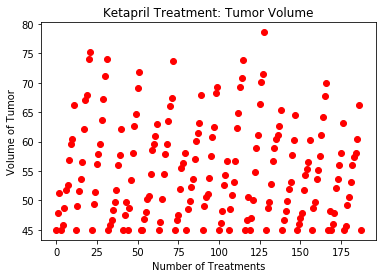

In [34]:
x_axis_k = np.arange(0, len(ketapril_data_list_df))

tumor_k_data = []

tumor_k_data = ketapril_data_list_df["Tumor Volume (mm3)"]
    
plt.title("Ketapril Treatment: Tumor Volume")
plt.xlabel("Number of Treatments")
plt.ylabel("Volume of Tumor")

plt.scatter(x_axis_k, tumor_k_data, marker="o", color="red")
plt.show()
